![wav2vec2_structure](https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/wav2vec2.png)

# Lab 5: Deep learning based end-to-end speech recognition 

The goal of this assignment is to get familiar with applications that require speech data as input.

We would be using the torchaudio library (pip install torchaudio==0.11.0), please carefull read this tutorial https://pytorch.org/tutorials/intermediate/speech_recognition_pipeline_tutorial.html

Next, we would ask you to perform similar analysis on a speech dataset, i.e., speechdata.zip. Unzip this folder, you would see a folder named wavs, and a file called "labels.csv", containing annotated transcripts, including the files in the wavs folder (you have more labels in labels.csv). This dataset is selected from https://keithito.com/LJ-Speech-Dataset/, a famous speech-based application benchmark.

General torchaudio tutorials: https://pytorch.org/tutorials/index.html

**Submission: submit via onq.** 


#Data Download

In [1]:
%%capture
!gdown --folder https://drive.google.com/drive/folders/1Q2BCKKxocAqo2Bw2L0P73VmUoar63eWw?usp=sharing

In [2]:
%%capture
!unzip "/content/Lab_5/speechdata.zip"

# pip install

In [3]:
%%capture
!pip install jiwer

#Import Libraries

In [4]:
# Import needed libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torchaudio
import wave
from scipy import signal
from scipy.io import wavfile
import librosa
import librosa.display
import IPython.display as ipd



# path of files
from os import listdir
from os.path import isfile, join

import jiwer
from jiwer import wer, mer
import re


# Task 1: Basic data exploration
Select one randomly sampled wav file in the given folder, perform the following analysis:

1) Print the shape of the picked waveform

2) Print the sample rate of the waveform. 

3) Visualize the waveform using matplotlib

4) Create the spectrogram representation of the picked waveform and visualize it. 

5) Create the MFCC representation of the picked waveform and visualize it.

Reference: https://www.kaggle.com/code/davids1992/speech-representation-and-data-exploration/notebook 

### Select one randomly sampled wav file in the given folder, perform the following analysis:

In [5]:
#save the path of the random file in speech_file_sample variable
speech_file_sample = "/content/wavs/LJ001-0007.wav"
print(speech_file_sample)

/content/wavs/LJ001-0007.wav


### 1) Print the shape of the picked waveform

In [6]:
#using pytorch to load the audio file
waveform, sample_rate = torchaudio.load(speech_file_sample)

print("Shape of the picked wave: {}".format(waveform.size()))

Shape of the picked wave: torch.Size([1, 184989])


### 2) Print the sample rate of the waveform.

In [7]:
print("Sample rate of the picked wave: {}".format(sample_rate))

Sample rate of the picked wave: 22050


### 3) Visualize the waveform using matplotlib

> I will use two way for this virtualization


> #### 1) First Way

In [8]:
train_audio_path = '/content/wavs/'
filename = 'LJ001-0007.wav'
sampleRate, samples = wavfile.read(str(train_audio_path) + filename)

> Note, that we are taking logarithm of spectrogram values. It will make our plot much more clear, moreover, it is strictly connected to the way people hear. We need to assure that there are no 0 values as input to logarithm.

In [9]:
def log_specgram(audio, sampleRate, window_size = 20, step_size = 10, eps = 1e-10):
  nperseg = int(round(window_size * sampleRate / 1e3))
  noverlap = int(round(step_size * sampleRate / 1e3))
  freqs, times, spec = signal.spectrogram(audio,
                                  fs=sampleRate,
                                  window='hann',
                                  nperseg=nperseg,
                                  noverlap=noverlap,
                                  detrend=False)
  return freqs, times, np.log(spec.T.astype(np.float32) + eps)

In [10]:
freqs, times, spectrogram = log_specgram(samples, sampleRate)

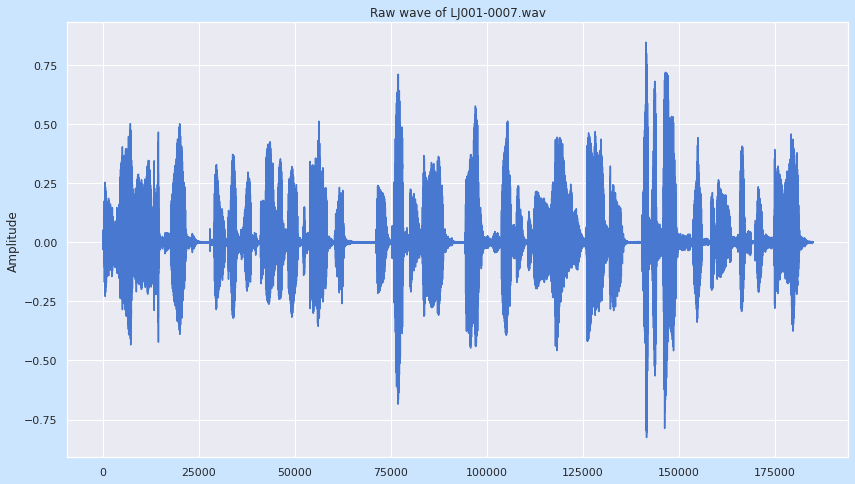

In [11]:
fig = plt.figure(figsize=(14, 8), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
plt.title('Raw wave of ' + filename)
plt.ylabel('Amplitude')
plt.plot(waveform.t().numpy())
plt.grid(True)
plt.show()

> #### 2) Second Way

In [12]:
#read the file
wav_obj = wave.open(speech_file_sample, 'rb')

#A sound wave is a continuous quantity that needs to be sampled at some time interval to digitize it. 
#The sampling rate quantifies how many samples of the sound are taken every second. 
#We can access this information using the following method:
sample_freq = wav_obj.getframerate()

#The number of individual frames, or samples
n_samples = wav_obj.getnframes()

#calculate how long our audio file is in seconds
t_audio = n_samples/sample_freq

#check the number of channels
n_channels = wav_obj.getnchannels()

#defining the number of frames to read
signal_wave = wav_obj.readframes(n_samples)

#This method returns a bytes object. Check for yourself by using the type() built-in function on the signal_wave object. To get signal values from this, we have to turn to numpy:
signal_array = np.frombuffer(signal_wave, dtype=np.int16)

#To split the data into individual channels, we can use a clever little array slice trick
l_channel = signal_array[0::1]
r_channel = signal_array[0::1]

#create an array of timestamps
times = np.linspace(0, n_samples/sample_freq, num=n_samples)

In [13]:
times.shape

(184989,)

In [14]:
l_channel.shape

(184989,)

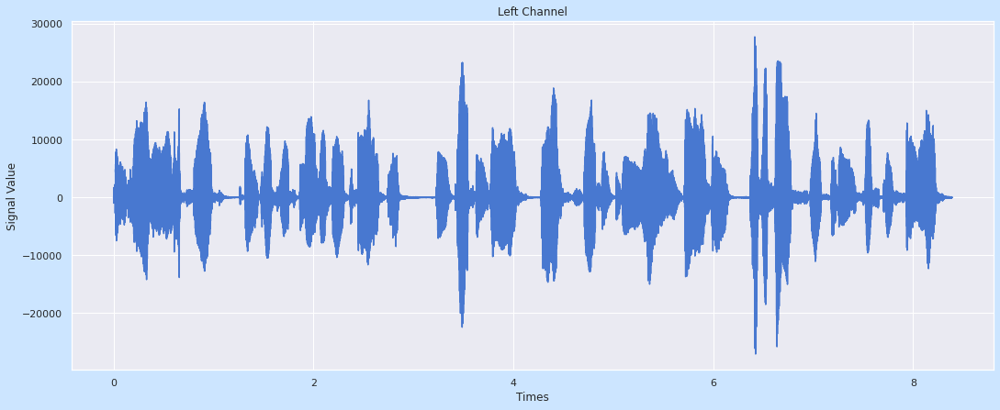

In [15]:
plt.figure(figsize=(18, 7), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
plt.plot(times, l_channel)
plt.title('Left Channel')
plt.ylabel('Signal Value')
plt.xlabel('Times')
plt.grid(True)
plt.show()

### 4) Create the spectrogram representation of the picked waveform and visualize it.

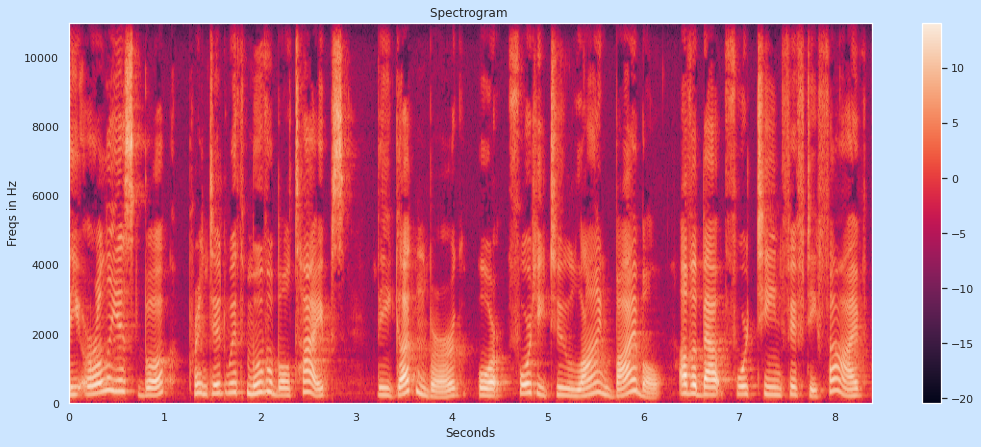

In [16]:
plt.figure(figsize=(18, 7), facecolor='#CCE5FF')
plt.imshow(spectrogram.T, aspect='auto', origin='lower', extent=[times.min(), times.max(), freqs.min(), freqs.max()])
plt.title('Spectrogram ' )
plt.ylabel('Freqs in Hz')
plt.xlabel('Seconds')
plt.colorbar()
plt.grid(False)
plt.show()

### 5) Create the MFCC representation of the picked waveform and visualize it.

> We can calculate Mel power spectrogram and MFCC using for example librosa python package.

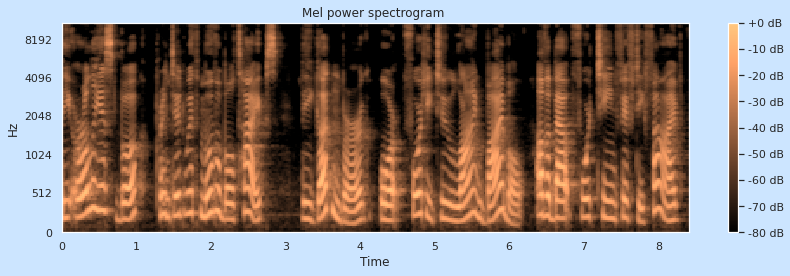

In [17]:
samples, sample_rate = librosa.load(str(train_audio_path)+filename)
S = librosa.feature.melspectrogram(samples, sr=sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 4), facecolor='#CCE5FF')
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel', cmap = 'copper')
plt.title('Mel power spectrogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

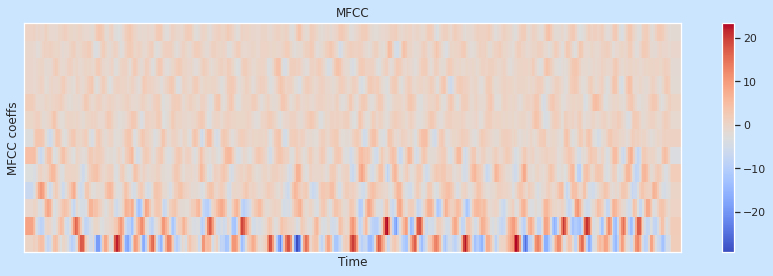

In [18]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4), facecolor='#CCE5FF')
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

>In classical, but still state-of-the-art systems, MFCC or similar features are taken as the input to the system instead of spectrograms.

> However, in end-to-end systems, the most common input features are probably raw spectrograms, or mel power spectrograms. For example MFCC decorrelates features, but NNs deal with correlated features well.

# Task 2: Creating a Wav2Vec2 model that can perform feature extraction and classification.


> I will create a `Wav2Vec2` model that will extract features and classify them.

> I will Build the model and load pretrained weights 

> I will use `torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H()`

In [19]:
#listening to one of the wav files
ipd.Audio(speech_file_sample, autoplay=False)

In [20]:
# Build the model and load pretrained weights 
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H 
print("Sample Rate:", bundle.sample_rate)

Sample Rate: 16000


In [21]:
model = bundle.get_model()

labels = bundle.get_labels()
print('\nlabels: ', labels)


labels:  ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [22]:
print('Model Architecture\n')
print(model)

Model Architecture

Wav2Vec2Model(
  (feature_extractor): FeatureExtractor(
    (conv_layers): ModuleList(
      (0): ConvLayerBlock(
        (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
      )
      (1): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (2): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (3): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (4): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
      )
      (5): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
      )
      (6): ConvLayerBlock(
        (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
      )
    )
  )
  (encoder): Encoder(
    (feature_projec

#### Extracting acoustic features

> I will extract acoustic features from the audio.

In [23]:
#The returned features is a list of tensors. Each tensor is the output of a transformer layer.
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

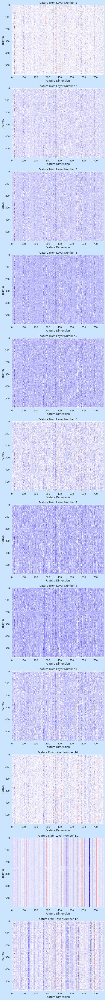

In [24]:
# plot
fig, ax = plt.subplots(len(features), 1, figsize=(14, 7 * len(features)),facecolor='#CCE5FF')
for i, clas in enumerate(features):
  sns.set(palette="muted", color_codes=True)
  ax[i].grid(False)
  ax[i].imshow(clas[0].cpu(), cmap = 'seismic')
  ax[i].set_title(f"Feature From Layer Number {i+1}")
  ax[i].set_xlabel("Feature Dimension")
  ax[i].set_ylabel("Frames")

In [25]:
def Wav2Vec2(sp_f_name):
  waveform, sample_rate = torchaudio.load(sp_f_name)
  # Resample audio to the expected sampling rate
  if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

  
  plt.figure(figsize=(12, 5), facecolor='#CCE5FF')
  sns.set(palette="muted", color_codes=True)
  plt.title('Raw wave of ' + sp_f_name[14:-4])
  plt.ylabel('Amplitude')
  plt.xlabel('Time')
  plt.plot(waveform.t().numpy())
  plt.grid(True)
  plt.show()
  
  # Wav2Vec2 model provides method to perform the feature extraction and classification in one step
  # Infer the label probability distribution
  with torch.inference_mode():
    emissions, _ = model(waveform) 
  return emissions

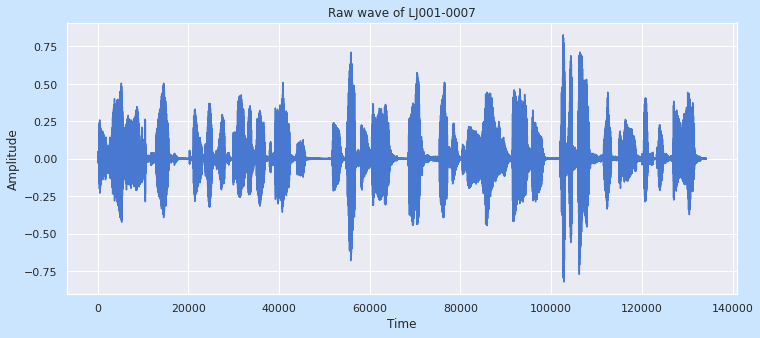


 tensor([[[  3.9413,  -1.2686,  -1.0024,  ...,  -5.6495,  -8.6365,  -2.8860],
         [  4.7635,  -0.2999,  -1.8778,  ...,  -5.2159,  -9.3902,  -2.7509],
         [ 14.7156,  -2.9704,  10.9847,  ..., -11.2411, -14.0030,  -7.9408],
         ...,
         [ 14.0240,   0.8634,  -2.0878,  ...,  -7.9790, -10.0255,  -7.3129],
         [ 14.0234,  -1.0415,  -2.2160,  ...,  -7.5255,  -9.1420,  -7.2261],
         [ 14.0494,  -1.6804,  -1.8714,  ...,  -7.3927,  -8.9343,  -6.8583]]])


In [26]:
speech_file_name = "/content/wavs/LJ001-0007.wav"
emissions = Wav2Vec2(speech_file_name)
print('\n===================================================\n', emissions)

# Task 3: Extract acoustic features and generate predicted transcript for each waveform in the given dataset

#### handle all wav files

> Create a list of wave files from the given Dataset

In [27]:
path = "/content/wavs"
# create a list of wave files from the given path and store it in (pathlist) variable
pathlist = [f for f in listdir(path) if isfile(join(path, f))]

In [28]:
len(pathlist)

101

> As we know we only have `100 wav files`, but as we can see we have `101` files in the list, so `I will drop the wrong file to make the list contain 100 wav files`

In [29]:
# we need to deal with wav file fomate only.
#detect the index of the wrong file
i = 0
for f in pathlist:
    if f == '.DS_Store':
      print('File name : ', f,'\nfile index : ', i)
    i += 1

File name :  .DS_Store 
file index :  56


> Delete the wrong file from the list

In [30]:
print('file name of index 56 before deletion : ')
print(pathlist[56])
del pathlist[56]
print('\nfile name of index 56 after deletion : ')
print(pathlist[56])
print('\nlength of the list after handling')
len(pathlist)

file name of index 56 before deletion : 
.DS_Store

file name of index 56 after deletion : 
LJ001-0031.wav

length of the list after handling


100

#### Predict Transcript

> We now wish to construct transcripts from the sequence of label probabilities. `Decoding` is a term used to describe the process of generating hypotheses.

>We'll use greedy decoding, which is independent of external components, to select the optimal hypothesis at each time step. As a result, the context information is ignored, and just one transcript is possible.

> So I will define a greedy decoding class to use it.

In [31]:
# Generating transcripts
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        # [num_seq,]  
        indices = torch.argmax(emission, dim=-1)  
        print('Predict a sequence of tokens', indices)
        indices = torch.unique_consecutive(indices, dim=-1) 
        print('\nMerge repeats ', indices)

        # Final output after dropping blank (-)
        indices = [i for i in indices if i != self.blank]
        print('\nlabels', [self.labels[i] for i in indices]) 
        return "".join([self.labels[i] for i in indices])

In [32]:
#initialize decoder object
decoder = GreedyCTCDecoder(labels=bundle.get_labels())

> create a dataframe to save the `prediction Transcript` on it.

In [33]:
#create a data frame
df = pd.DataFrame()
#create a list for all prediction transcripts
Transcript = []
#create a list for audio names
file_name = []

In [34]:
def decoding(sp_f_name):
  emissions_ = Wav2Vec2(sp_f_name)

  print('\n')
  plt.figure(figsize=(16, 9), facecolor='#CCE5FF')
  plt.imshow(emissions_[0].cpu().T, cmap = 'hot')
  plt.title("Classification of "+sp_f_name[14:-4])
  plt.xlabel("Frames")
  plt.ylabel("Class")
  plt.grid(False)
  plt.show()
  print('\n')
  transcript = decoder(emissions_[0])
  file_name.append(sp_f_name[14:-4])
  Transcript.append(transcript)
  return transcript

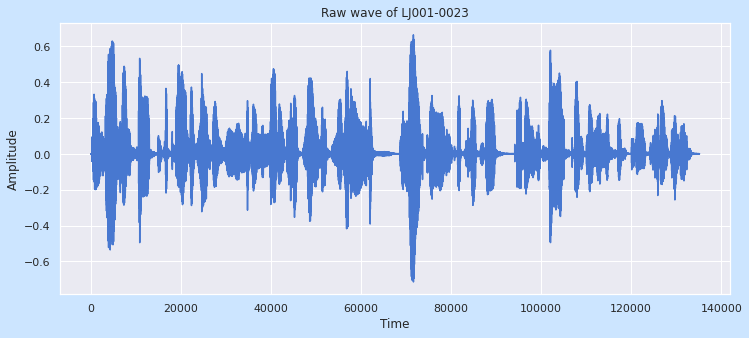

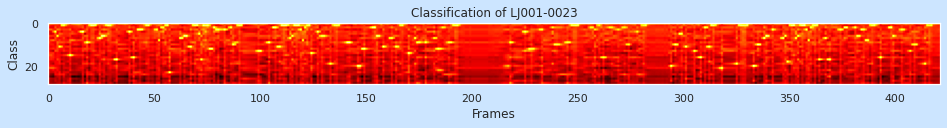



Predict a sequence of tokens tensor([ 0,  0,  0,  4,  6, 11,  0,  1,  0,  0, 15,  0,  0,  0,  0,  0,  4,  0,
         9,  0,  1,  1,  0,  0,  7,  6,  6,  0,  1,  1,  0,  0, 17,  0,  0,  0,
         0,  0,  4,  0, 16,  0,  3,  3,  3,  0,  1,  1,  0,  0,  0,  3,  8,  0,
         2,  1,  1, 23,  0,  0,  0,  0,  7,  0,  6,  6,  0, 11,  0,  1,  1,  5,
        17,  1,  1,  1, 12, 12,  2,  3,  3,  0,  0,  3,  0,  0,  2, 10,  0,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0, 13, 13,  0,  0,  0,  9,  0,  2,  2,
        11, 11,  1,  1,  1,  0,  7,  6,  1,  1,  1,  3,  8,  2,  1,  1, 14,  0,
         0,  4,  0,  6,  6,  0,  0, 19,  0,  1,  1,  0,  0,  0,  0,  9,  9,  0,
         0,  0, 20, 20, 12, 12,  0,  0,  0,  2,  2,  6,  6,  0, 11,  0,  0,  0,
         7,  0, 11,  0,  1,  1,  0,  0, 14,  0,  0,  7,  9,  9,  0,  0,  9,  0,
         0,  0,  7,  0, 12, 12,  2,  0,  0,  9,  9,  1,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

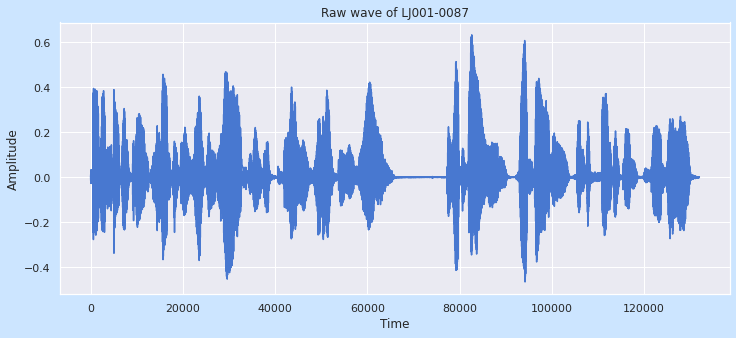

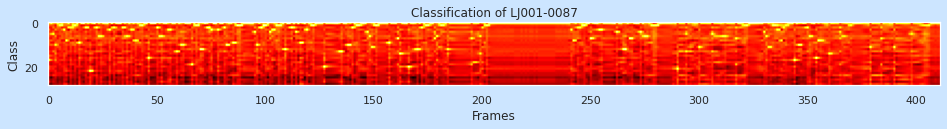



Predict a sequence of tokens tensor([17,  0,  5, 10,  0,  1,  1,  3,  8,  0,  2,  1,  1,  0,  9,  0,  0,  2,
         2, 22, 22,  0,  2,  6,  6,  0,  0,  0,  3,  0,  2,  0,  0,  0,  2,  2,
         6,  0,  3,  0,  8,  0,  1,  1,  0,  0, 16,  0,  0,  0,  2,  6,  6,  0,
         0,  3,  3,  0,  0, 13,  0, 10, 10,  0,  0,  0, 19,  0,  1,  1, 12, 12,
         0,  2,  2,  3,  0,  0,  3,  0,  0,  2, 10, 10,  0,  9,  9,  1,  1,  1,
         0,  0,  0,  0,  0,  4, 10,  0,  2,  1,  1,  0,  4,  3,  3,  1,  1,  1,
         0, 12,  0,  0,  2,  0,  4,  0,  9,  9,  0,  3,  0,  1,  1,  0,  0,  0,
         0, 20,  0,  0,  0,  0,  0,  0, 13, 13,  0,  0, 10, 10,  2,  0,  1,  1,
         0,  0,  0,  4,  6, 11,  1,  1,  1,  0,  0,  0,  0,  9,  0,  0,  0,  7,
        14,  0,  0,  0, 20,  0,  0,  0, 12,  0,  2,  0,  1,  1,  0,  0,  7,  6,
         0,  1,  1,  0, 12,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  0,  0,
         0,  6,  2,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

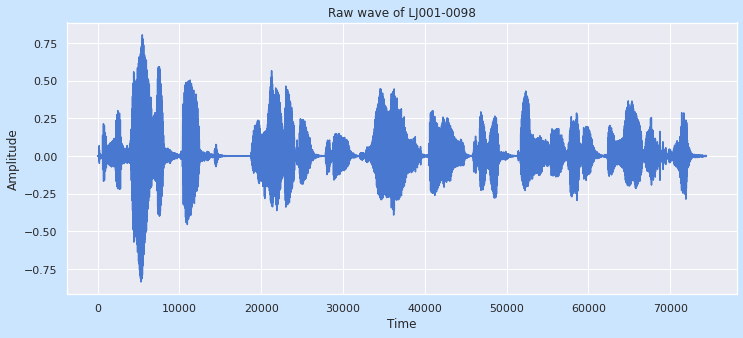

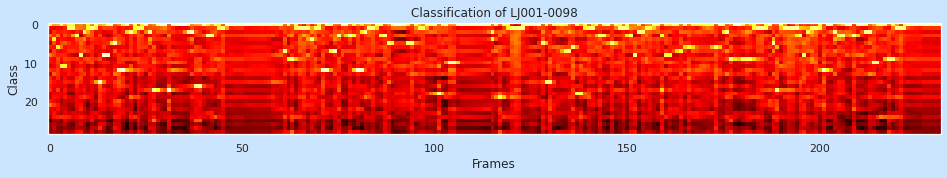



Predict a sequence of tokens tensor([ 0,  4,  6,  0, 11,  1,  1,  3,  8,  2,  1,  1,  0, 15,  8,  8,  0,  5,
        12, 12,  0,  2,  0,  1,  1,  0,  2, 17,  0,  0,  0, 17,  0,  0,  0,  0,
         2,  2, 16, 16,  0,  3,  3,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  7,  0,  9,  0,  1,  1,  1,  4,  1,  1, 12,
        12,  0,  7,  3,  0,  0,  3,  0, 12, 12,  2,  1,  1,  0,  0,  3,  5,  0,
         0,  0,  0,  5,  5,  0,  1,  1,  0,  0,  0, 18,  0,  0, 10, 10,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  2,  0, 19,  0,  0,  1,  1,  1,  1,  0,  0,
         0,  0,  5,  0, 15,  0,  0,  0,  7,  7,  6,  0, 18,  0,  1,  1,  0,  3,
         3,  0,  5,  0,  1,  1,  1,  3,  8,  2,  2,  1,  1,  0,  0,  3,  8,  8,
         0,  0,  7,  0,  6,  0,  0,  0,  0,  0,  0,  6,  0,  0,  2,  9,  0,  0,
         9,  9,  9,  0,  1,  1,  1,  0,  5, 17,  0,  1,  1,  1,  1,  3,  8,  2,
         1,  1,  0, 12,  0,  0,  2,  3,  3,  0,  0,  3,  0,  0,  2,  2, 10, 10,
         

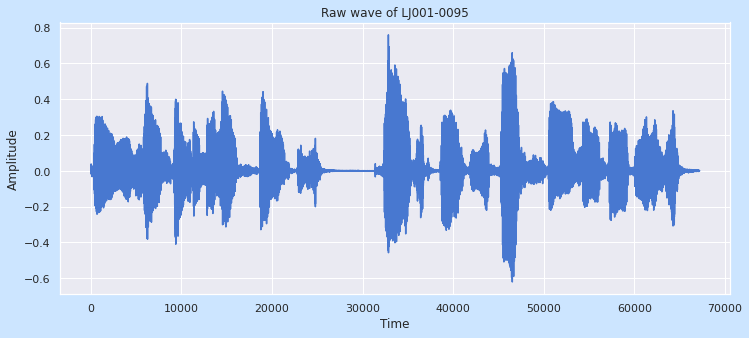

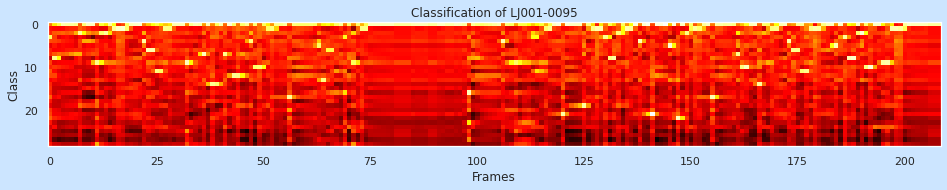



Predict a sequence of tokens tensor([ 3,  8,  0,  0,  0,  0,  0,  2,  0,  0,  0,  9,  2,  2,  0,  1,  1,  1,
         1,  0,  0,  0,  4,  6,  6, 11, 11,  1,  1,  0,  0,  0,  9,  0,  0,  0,
         7,  0, 14, 14,  0,  7,  0, 12, 12,  0,  0,  4,  0, 10,  0,  1,  1,  0,
         0,  0, 17,  0,  0,  0,  0,  0,  0,  5, 13,  6,  6,  0,  0,  3,  0,  9,
         0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0, 16,  0,  0,  0,  0,  0,  0,  0,  4,  0,
         0,  9,  0,  0,  0,  3,  3,  0,  1,  1,  0,  0, 21,  0,  0,  0,  0, 19,
         0,  1,  1,  1,  3,  8,  8,  2,  0,  1,  1,  0,  4,  0,  0, 21,  0,  0,
         0,  5,  0, 22,  0,  2,  0,  1,  1,  0,  0, 17,  0,  0,  0,  0,  0,  7,
        10, 10,  0,  0, 14,  0,  0,  1,  1,  0,  0,  4,  6,  0,  0, 11,  1,  1,
         1,  0,  0,  0,  5,  0,  3,  8,  8,  0,  2, 10, 10,  0,  0,  9,  9,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0])

Merge repeats  tensor([ 3,  8,  0, 

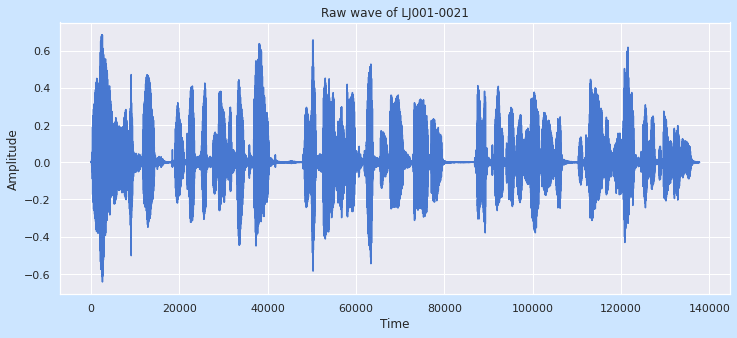

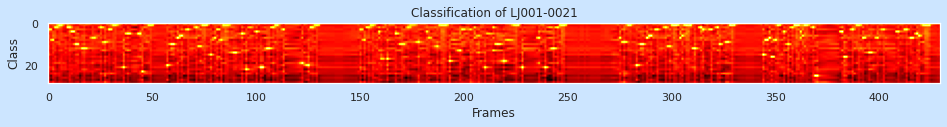



Predict a sequence of tokens tensor([ 3,  0,  8,  2,  2,  1,  1,  0,  0,  2,  2,  4,  4, 10, 10,  0, 12, 12,
         0,  0,  0,  7,  7,  0,  0,  2,  0,  9,  0,  3,  3,  1,  1,  0,  0,  0,
        21,  0,  5,  5,  0,  0,  0,  5,  5, 23,  0,  0,  1,  1,  0,  0,  0,  0,
         0,  0,  0, 20,  0, 10, 10,  0,  7,  6,  6,  0,  0,  3,  0,  0,  0,  2,
        11, 11,  1,  1,  1,  0, 15,  0,  7,  3,  0,  8,  1,  1,  1,  0,  0, 14,
        14,  0,  0,  5,  0, 22,  0,  0,  0,  0,  4,  0, 21, 21,  0, 12, 12,  0,
         2,  1,  1,  0,  0,  3,  0,  0,  0,  0,  0,  0,  0,  0, 19,  0,  0, 20,
         2,  2,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  3,  0,  8,  2,  2,  1,  1,  0,  0,  4, 17,  0,
         0, 17,  0,  0,  0,  5,  0, 10, 10, 10,  0,  2,  0,  0,  0,  0,  9,  0,
         0,  0,  4,  7,  0,  0,  0, 11,  1,  1,  1,  1,  0, 18,  0,  0,  0,  0,
        13,  3,  0,  0,  0,  3,  0,  2,  0,  6,  0,  0, 21,  0,  0,  0,  2, 10,
        1

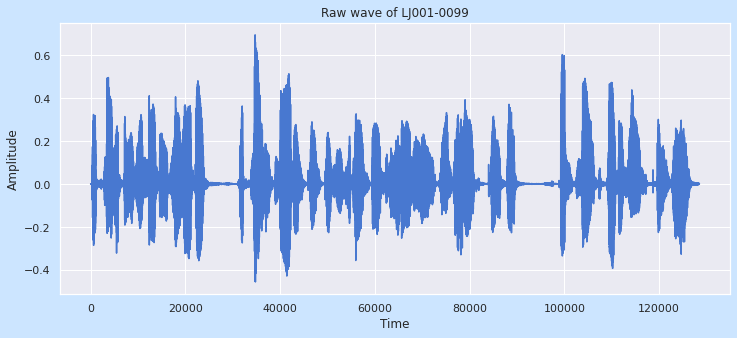

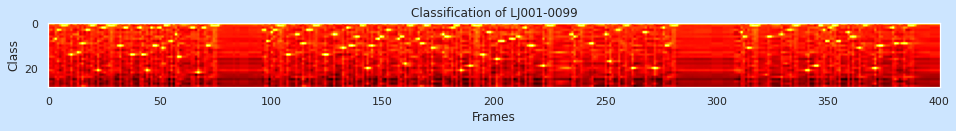



Predict a sequence of tokens tensor([ 0,  0,  0,  7,  3,  0,  1,  1,  0,  0, 14,  0,  0, 13,  0,  9,  0,  3,
         3,  1,  1,  0, 21,  0,  2,  2,  0,  1,  1,  1,  0,  0, 10,  0,  2,  2,
         0, 14, 14,  0,  0,  2, 14, 14, 21,  0,  2, 10, 10,  0,  2, 11,  1,  1,
         0,  8,  0,  5, 15, 15,  0,  0,  0,  0,  2,  2,  0, 22,  0,  2,  2, 10,
        10,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  4,  3,  3,  1,  1,  1,  0, 14,
        14,  0,  0,  5,  5,  0,  9,  0,  3,  3,  3,  1,  1,  1,  0,  0, 14, 14,
         0,  0,  5,  0,  0,  0, 11,  0,  2, 10, 10,  0,  6,  6,  0,  1,  0, 20,
         0, 10,  0,  0,  7,  6,  0,  0,  3,  3,  0,  0,  0,  7,  6,  6, 18,  0,
         1,  1,  0,  0,  7,  9,  9,  1,  1,  0, 11,  0,  0,  0,  0,  5,  6,  6,
         0,  2,  0,  1,  0, 21,  0,  0,  0, 19,  0,  1,  1,  1, 14, 14,  0,  4,
         4,  0,  0, 16,  8,  8,  8,  0,  0,  0,  7,  0,  0,  6,  0,  0,  2,  0,
        1

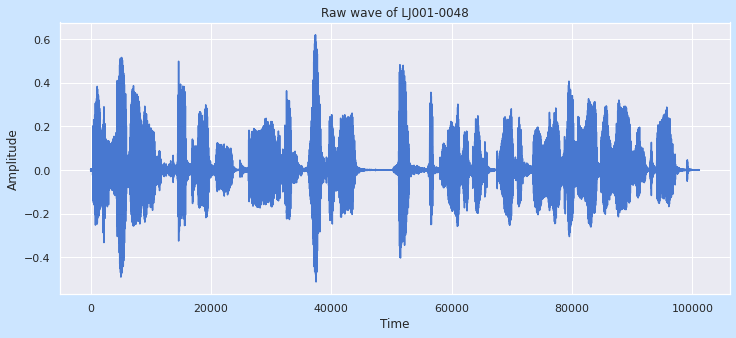

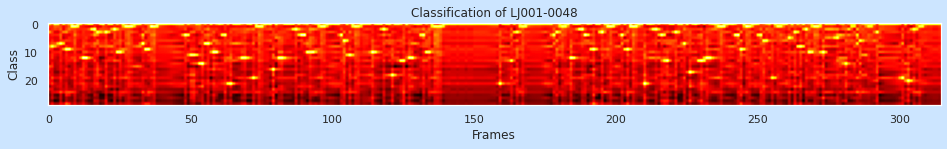



Predict a sequence of tokens tensor([ 0,  8,  0,  0,  7,  0,  9,  9,  1,  1,  0,  0, 12, 12,  0,  0,  2,  3,
         0,  0,  3,  0,  0,  2, 10, 10,  0,  1,  1,  1,  0,  0,  0,  7,  9,  9,
         1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  0, 11, 11,  0, 14,
        14,  7,  7,  0, 10, 10,  0,  0,  4, 21, 21,  0,  0,  0, 12, 12,  0,  0,
        19,  1,  1,  1,  0,  0,  0, 16,  0, 12, 12,  0,  0,  0,  0,  2,  0,  4,
         4, 10, 10, 10,  0,  0,  1,  1,  0,  0,  0,  0,  0,  4,  6,  0, 11,  0,
         1,  1,  0,  0,  0,  0, 10,  0,  0,  0,  2,  0,  0, 18,  0,  0, 13, 13,
         0, 12, 12,  0,  0,  0,  4, 10, 10,  0,  1,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 21,  0,  0,
         0, 13,  0,  3,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  3,
         0,  1,  1,  0, 12, 12,  0,  0,  2,  4,  0,  0,  9,  0,  0,  3,  0,  1,
         1,  1,  0,  0,  4,  0,  9,  1,  1,  1,  0,  0, 21,  0,  0,  2,  2,  0,
         

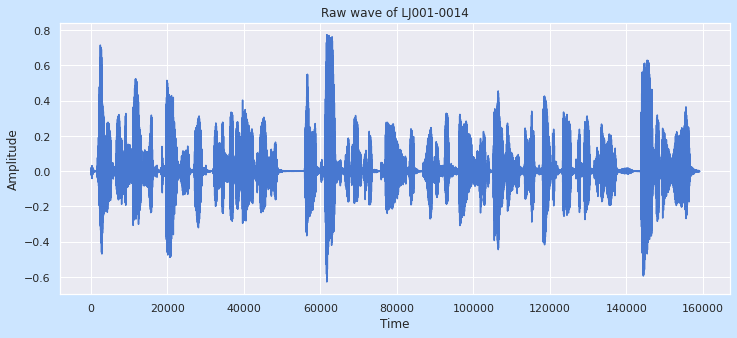

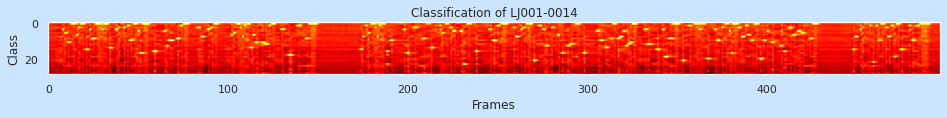



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  0,  0,  4,  6,  0, 11,  0,  1,  1,  0,  7,  3,
         1,  1,  0, 15,  0,  4,  0,  9,  0,  1,  1,  1,  4,  1,  1,  0, 14,  0,
         0,  0,  4,  3,  0,  0,  3,  0,  2,  0, 10,  0,  1,  1,  5, 17, 17,  1,
         1,  1,  0,  0,  0, 16,  0,  0,  0,  0,  0,  5, 13, 10, 10, 10,  0,  0,
         9,  2,  2,  1,  1,  1,  0,  0,  0,  0,  0,  3,  3,  8,  8,  0,  0,  4,
         0,  3,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  7,  6,  0,  1,  1,  3,
         8,  2,  1,  1, 14, 14,  7, 11, 11,  0,  0, 11,  0, 12, 12,  2,  0,  1,
         1,  0,  0,  0,  4,  4,  0,  0, 18, 18,  0,  0,  0,  2,  2,  0,  0,  0,
         9,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,  8,  0,  2,  6,  0,
         1,  1,  3,  8,  2,  1,  1,  1, 16, 16,  0, 10,  0,  0,  0,  0,  0,  0,
         4,  0, 17,  0,  0,  0,  3,  3,  0,  0,  0,  9,  0,  0,  0, 14,  0,  0,
         

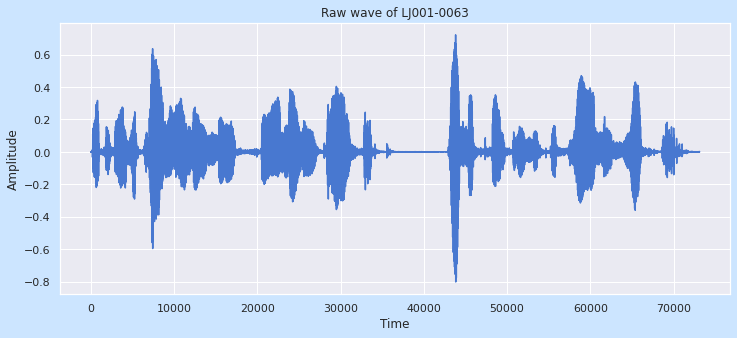

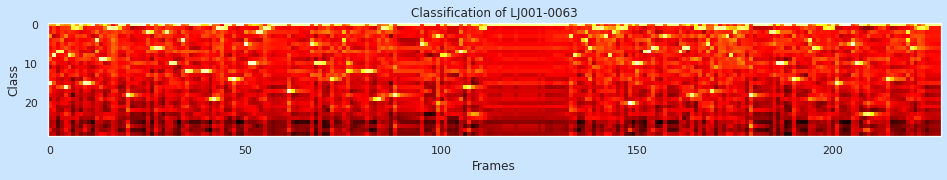



Predict a sequence of tokens tensor([15,  8,  7,  7, 16,  8,  0,  1,  0, 15, 15,  0,  4,  9,  9,  1,  1,  1,
         0,  0, 18,  0,  0,  0,  0,  2,  0,  6,  6,  0,  2, 10, 10,  0,  4, 12,
         0,  0,  0, 12, 12,  0, 19,  1,  1,  0,  0, 14,  0,  0,  5, 10, 10,  2,
         2,  1,  1,  0,  0,  0,  0, 17,  0,  0,  0,  0,  0,  5,  0, 10,  0,  0,
        14,  0,  0,  4, 12,  0,  0,  0,  0, 12, 12,  0, 19,  1,  1,  0, 18,  0,
         0,  0,  0,  0,  0,  5,  0,  0,  0,  3,  0,  8,  0,  0,  0,  7,  0, 16,
         0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  0,  4,  6,  1,  1,  1,  3,  8,
         2,  1,  1,  1, 20, 20, 10,  0,  7,  7,  6,  0,  0,  3,  0,  0,  0,  7,
         6,  6, 18,  1,  1,  1,  5, 17,  1,  1,  1,  3,  8,  2,  1,  1,  0, 18,
         0,  0,  0,  0,  2,  2, 10, 10,  0,  0, 14,  0,  0,  0,  4,  6,  6,  0,
         1,  1,  0, 15,  0,  0,  0,  5, 10,  0, 23, 23,  0,  0,  0,  0, 14,  0,
         

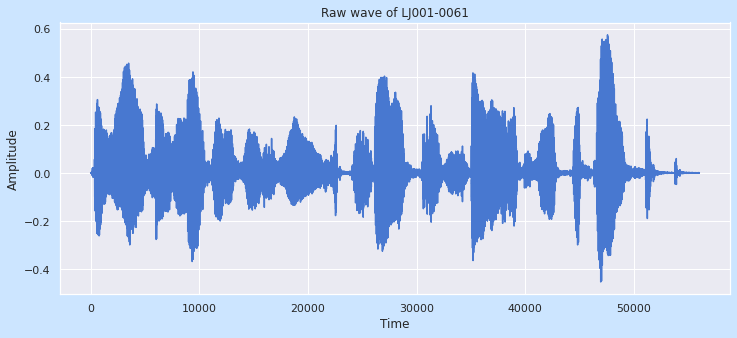

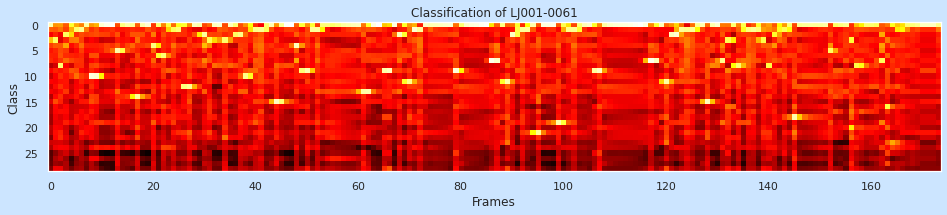



Predict a sequence of tokens tensor([ 0,  3,  8,  2,  0,  1,  1,  0, 10, 10,  0,  0,  0,  5,  0,  0,  0, 14,
         0,  0,  4,  0,  6,  0,  1,  1, 12, 12,  0,  0,  2,  3,  0,  0,  3,  0,
         0,  2, 10, 10,  1,  1,  0,  0, 15,  0,  0,  0,  4,  9,  9,  1,  1,  0,
         0,  0,  0,  0,  0,  0,  0, 13, 13,  0,  0,  9,  9,  0,  2,  2, 11,  1,
         1,  0,  0,  0,  0,  0,  0,  9,  0,  0,  0,  0,  0,  0,  7,  7,  0, 11,
         2,  2,  1,  1,  0, 21,  0,  0,  0, 19,  0,  1,  1,  0,  0,  0,  9,  9,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  7,  0, 11,  2,  2,  1,  1,  1,
         0,  0, 15,  0,  0,  7,  3,  0,  8,  0,  1,  1,  1,  3,  8,  2,  1,  1,
         0, 18,  0,  0,  0,  0,  0,  0,  5,  0,  0,  0,  3,  8,  8,  0,  0,  0,
         7, 16,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0])

Merge repeats  tensor([ 0,  3,  8,  2,  0,  1,  0, 10,  0,  5,  0, 14,  0,  4,  0,  6,  0,  1,
        12,  0,  2,  3,  0,  3,  0,  2, 10,  1,  0, 15,  0,  4,  9,  1,  0, 13,
         0,  9, 

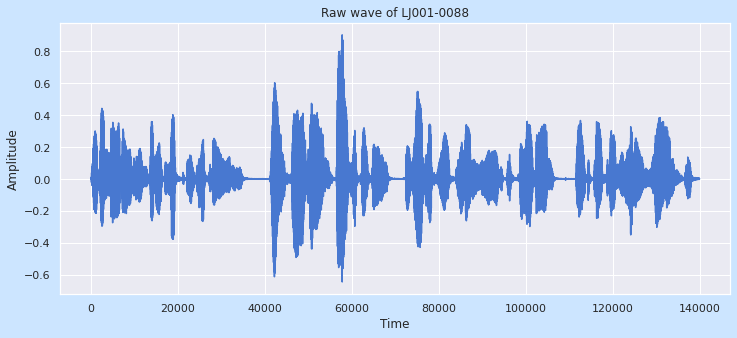

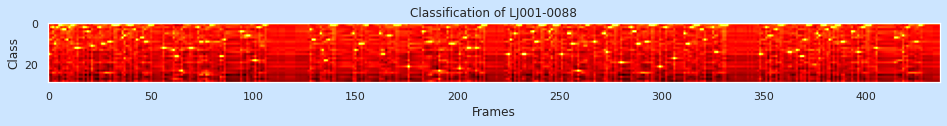



Predict a sequence of tokens tensor([15,  0,  2, 10,  2,  1,  1,  3,  3,  8,  2,  1,  1, 12, 12,  0,  0,  2,
         0,  4,  0, 11,  0,  0,  0,  2, 10, 10,  0,  9,  9,  0,  1,  1,  1,  0,
         7,  6,  0,  1,  1,  0,  3,  8,  0,  0,  7,  9,  9,  1,  1,  0,  0,  0,
         0,  0, 12,  0,  0,  0,  0, 13, 16, 16,  0, 23,  0,  0,  0, 12, 12,  0,
         0,  2,  9,  9,  0,  9,  9,  1,  1,  0,  0,  0, 16, 16,  8,  0,  0,  0,
         0,  0,  0,  0,  4,  0,  0,  6,  6,  0,  0, 18,  2,  2,  0,  1,  1,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  3,  8,  8,  0,  0,  5, 13, 18, 18,  8,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  5, 13,  0, 10, 10, 10,  1,  1,  0,  0,  0,  0,  0,
         5, 15, 15,  0,  6,  6,  0,  1,  1,  1,  0,  0,  0,  0, 21,  0,  0,  0,
         0,  0,  0,  4,  0,  0,  9,  9,  0,  0,  0, 23,  0,  0,  0,  2,  0, 10,
        10,  0,  0, 22,  0,  0,  7, 12, 12,  0,  0, 12,  0,  2,  1,  1,  0,  0,
         

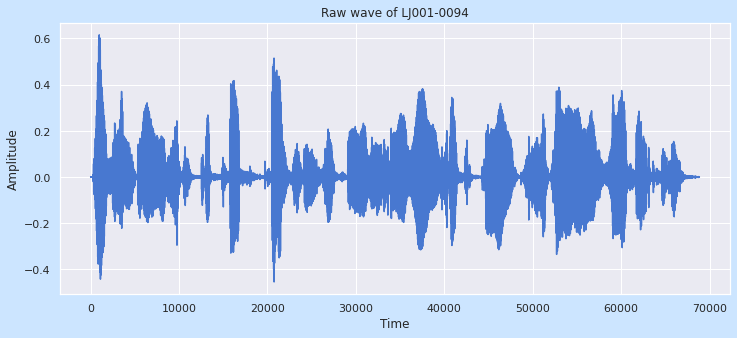

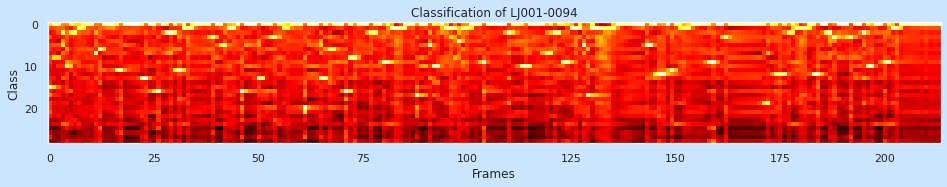



Predict a sequence of tokens tensor([15,  0,  0,  2, 10,  0,  2,  1,  1,  0,  0,  7,  6,  0,  0,  0, 11, 11,
         0,  0,  0,  0, 13, 13,  0,  0, 16,  0,  2,  2,  0, 11,  0,  1,  1,  0,
         0,  0,  0,  3,  0,  0,  5,  1,  1,  0, 16,  0,  0,  0, 13,  0,  0,  0,
         3,  0,  1,  1,  0,  0,  0, 20,  0,  0,  0, 13, 13,  6,  0,  0,  0, 16,
         0,  8,  0,  0,  0,  2,  0,  0,  9,  9,  1,  1,  1,  0,  0,  0, 17,  0,
         0,  5, 10, 10,  0,  1,  1,  1,  4,  1,  1,  0,  0,  0,  9,  0,  0,  0,
         0,  0,  2,  0,  0, 10, 10,  0,  0,  0,  0,  7,  0,  2,  2,  9,  9,  1,
         1,  1,  5, 17,  1,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  5,
         5,  0, 12, 12,  0, 11,  0,  0,  1,  1,  0,  0,  0,  0,  9,  9,  0,  0,
         3,  0,  0,  0,  0,  0,  0,  0,  0,  0, 19,  0, 12, 12, 12,  2,  0,  1,
         1,  1,  0, 12, 12,  0,  0,  2,  3,  0,  0,  0,  3,  0,  0,  2, 10, 10,
         0,  0,  9,  9,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0])

Merge repeats  

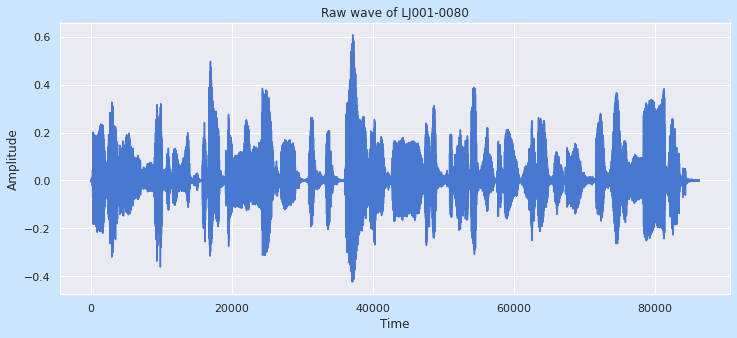

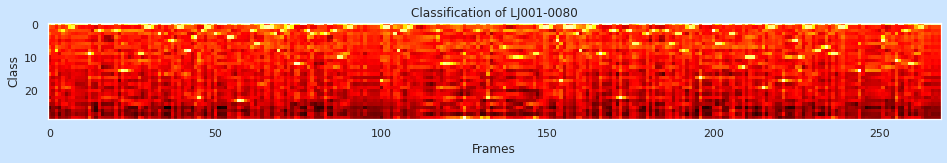



Predict a sequence of tokens tensor([ 0,  0,  8,  0,  2,  0,  0,  1,  0,  0,  0,  0,  9,  0,  0,  2,  0,  0,
         0,  0,  2,  0, 14, 14,  0,  0,  0,  9,  9,  1,  1,  0,  0,  3,  0,  0,
         0,  5,  0,  1,  1,  8,  8,  0,  4, 22,  2,  0,  1,  0,  3,  0,  0,  0,
         4,  4,  0, 23, 23,  0,  0,  2,  6,  6,  1,  1,  1,  1,  3,  8,  2,  0,
         1,  0, 12, 12,  0,  0,  2,  3,  0,  0,  0,  3,  0,  0,  2, 10, 10,  0,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0, 17,  1,  1,  0,  3,  8,  2,  2,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  2,  0, 12, 12,  0,  0,  0,  0, 28,
         0,  0,  0,  2,  0,  0, 22,  0,  0,  0,  0,  7,  0,  0, 10, 10,  0,  0,
         0,  0,  9,  9,  1,  1,  1,  0,  0,  5, 17,  1,  1,  1,  1,  3,  8,  2,
         1,  1,  0,  0,  9,  0,  0,  0,  2,  0, 22,  0,  0,  2,  6,  6,  0,  0,
         3,  0,  2,  0,  0,  0,  2,  6,  0,  3,  3,  8,  0,  1,  0,  0, 16,  0,
         0,  0,  2,  6,  6,  0,  0,  3,  3,  0,  0, 13,  0, 10, 10,  0,  0, 19,
         

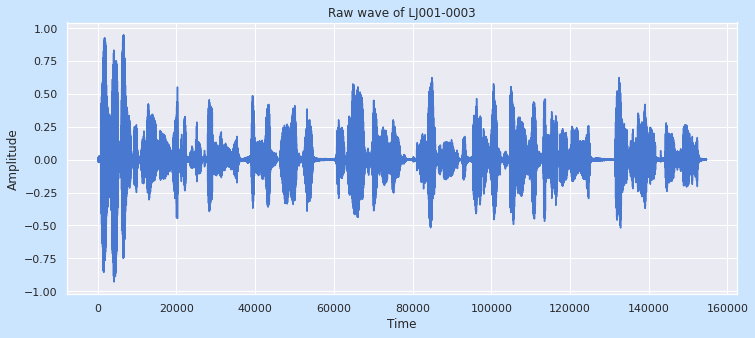

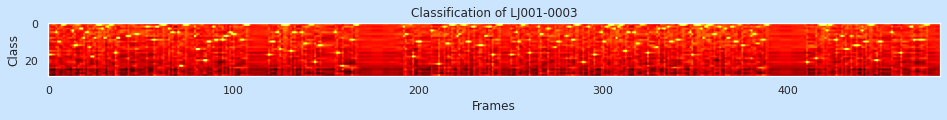



Predict a sequence of tokens tensor([17, 17,  0,  0,  5, 10,  0,  1,  1,  0,  0,  0,  0,  4, 12,  0,  0,  3,
         3,  8,  0,  5, 13, 18, 18,  8,  1,  1,  1,  3,  8,  0,  2,  1,  1,  0,
        16,  8,  8,  0,  0,  0,  0,  7,  0,  0,  0,  6,  6,  0,  0,  0,  0,  2,
         0,  0,  0,  9,  2,  2,  0,  1,  1,  1,  0,  3,  0,  5,  0,  0,  5, 23,
        23,  1,  1,  1,  0,  0,  0,  7, 14, 14,  0,  0, 20, 20, 10, 10,  0,  2,
         9,  9,  0,  0,  9,  0,  7,  0,  5,  0,  6,  0,  0,  0,  9,  9,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 17,  0, 10,  0,  0,  5, 14,
         0,  1,  1,  1,  0, 15,  0,  5,  0,  0,  0,  5, 11, 11,  0,  0,  1,  0,
        21,  0, 12, 12,  0,  0,  0,  0,  0,  0,  0,  5, 16,  0,  0, 23,  0,  0,
         0,  0,  9,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2,  6,  0,  0,  0, 18,
         0,  0, 10, 10,  0,  0,  0,  0,  0,  4,  0,  0,  0, 22,  0,  0,  2, 11,
        1

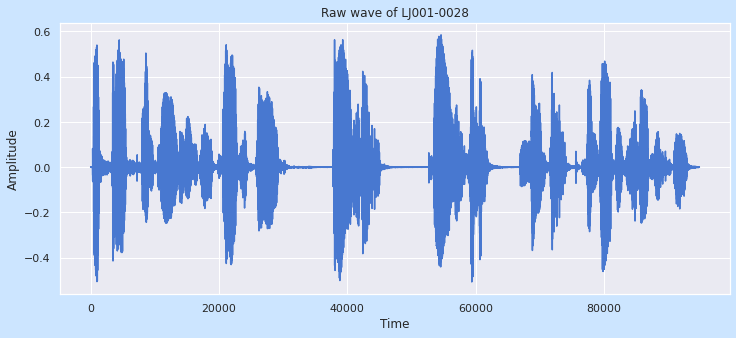

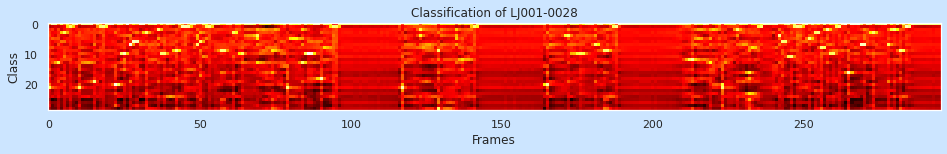



Predict a sequence of tokens tensor([21,  0,  0, 13,  0,  3,  0,  1,  0,  0, 21,  0,  0,  0,  0, 19,  0,  1,
         1,  0,  0,  0, 20,  0, 10, 10,  0,  7,  6,  6,  0,  0,  3,  0,  0,  0,
         2, 10, 10,  0,  0,  0,  9,  0,  1,  1,  1,  0,  0,  7,  6,  0,  1,  1,
         0,  0,  0,  9,  9,  0,  0,  3,  0,  0, 10,  0,  0,  0,  0,  4,  0,  0,
         0,  0,  9,  0,  0,  0,  0, 21,  0,  0,  0,  0, 13,  0, 10, 10,  0,  0,
        18,  0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0, 21,  0,  0,  0,  0,  0,  2,  0,  0,
         0,  0,  0,  9,  0,  0,  0,  0,  0,  2,  0, 12,  0,  0,  0,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  4,  0,  0, 10, 10, 10,  0,  0,
         0,  7,  0,  0,  9,  9,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 12, 12,  0,  0,
         

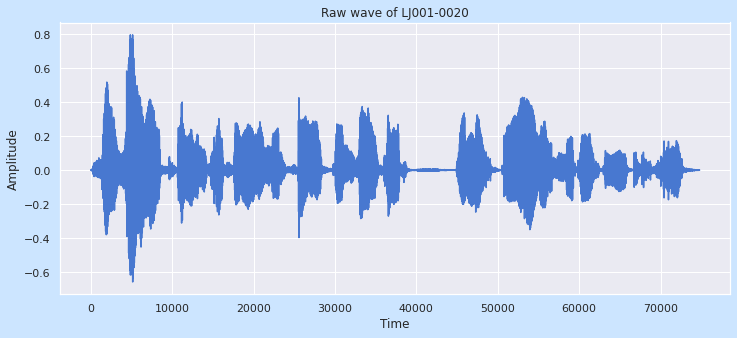

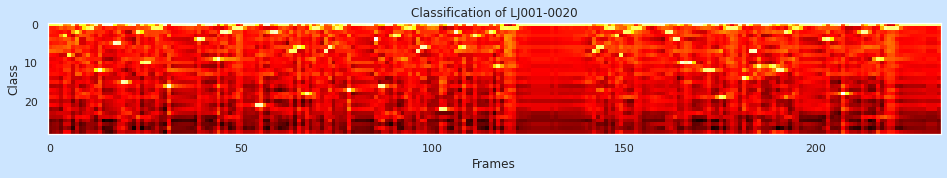



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  3,  8,  0,  2,  0,  0,  1,  1,  0, 12,  0,  0,  0,  5,
         5, 15, 15,  0,  0,  2, 10, 10, 10,  1,  1,  1,  0, 16,  0,  0,  0,  0,
         0,  0,  0,  4,  4,  0,  0,  0,  9,  2,  2,  2,  1,  1,  1,  0,  0,  0,
        21, 21,  0,  0,  2,  2,  0,  0,  0,  7,  0,  6,  0, 18,  0,  1,  1,  0,
         7,  6,  0,  1,  1,  0, 17,  0,  0,  0,  0,  0,  0,  4, 16, 16,  0,  0,
         3,  3,  0,  1,  1,  0,  7,  6,  6,  0,  0,  0, 22, 22,  0,  0,  2,  0,
         6,  0,  0,  3,  0,  0,  0,  2,  0, 11,  1,  1,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  6,
         6,  0,  1,  1,  3,  8,  2,  2,  1,  1,  1,  0,  0,  0,  0,  0,  0,  2,
         2,  4,  4, 10, 10, 10,  0,  0,  0, 12, 12, 12,  0, 19, 19,  1,  1,  1,
         0, 14,  0,  7,  7, 11,  0,  0,  0, 11, 12, 12,  2,  0,  1,  1,  0,  0,
         0,  0,  0,  0,  4,  4,  0,  0,  0, 18,  0,  0,  0,  0,  2,  2,  0,  0,
         

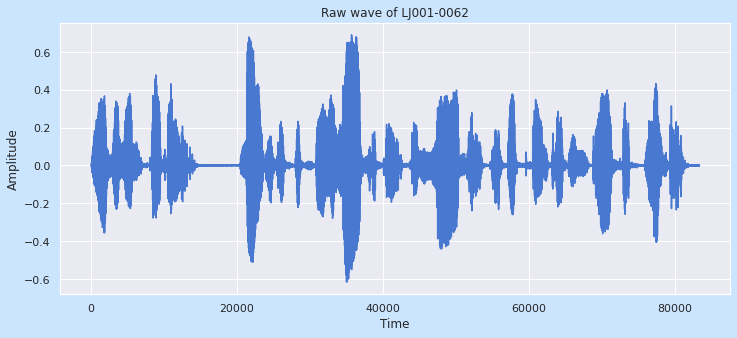

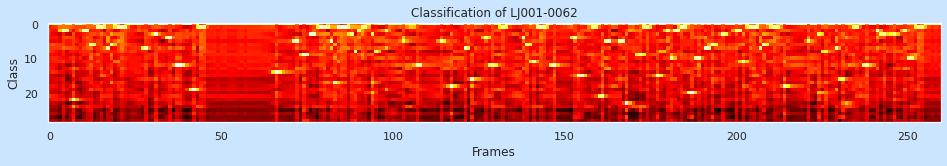



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  2,  0,  0, 22,  0,  0,  2,  2,  6,  0,  1,  1,  0,  7,
         6,  0,  1,  1,  1,  0,  0,  0,  0,  0,  7,  0,  0,  3,  0,  0,  4,  4,
         0, 12, 12,  0,  0,  0, 19,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14,  0,  0,  0,  0,  0,
         5,  0,  9,  9,  3,  3,  0,  1,  1,  1,  5, 17,  1,  1,  1,  1,  3,  8,
         2,  1,  1,  0,  3,  8,  0,  0,  2,  0,  0,  0,  0,  5,  0,  0,  0, 12,
        12,  0,  0,  0,  0,  0,  5,  0,  0, 18,  0,  0,  0,  7,  0, 16,  0,  0,
         0,  4, 12, 12,  0,  0,  1,  0,  0,  0,  0,  0,  4,  6,  0, 11,  1,  1,
         1,  0,  0, 12,  0,  0,  0,  0,  0,  4, 15, 15,  0,  0,  1,  1,  0, 21,
         5,  5,  0,  0,  5,  5, 23,  0,  0,  0,  9,  0,  1,  0,  0, 15,  0,  0,
         2, 10,  2,  2,  1,  1,  0, 20, 10, 10,  0,  7,  7,  6,  0,  0,  3,  0,
         0,  0,  2,  0, 11,  0,  1,  1,  1,  7,  6,  0,  0,  1,  1,  0, 18,  0,
         

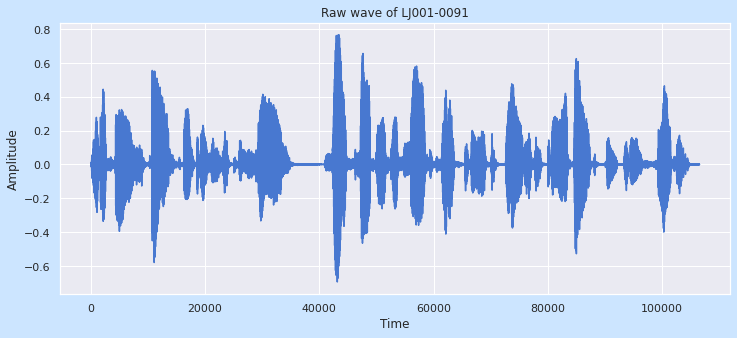

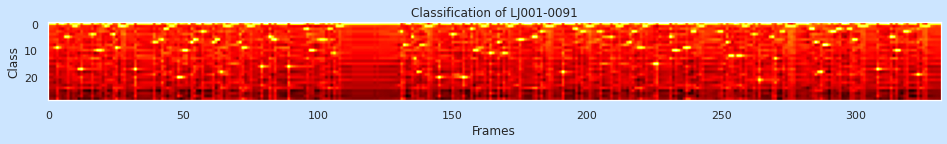



Predict a sequence of tokens tensor([ 0,  0,  0,  9,  0,  0,  5,  5,  0,  1,  1,  0, 17,  0,  0,  0,  4,  0,
        10, 10,  0,  1,  0,  0,  4,  9,  0,  1,  1,  0,  0,  0, 17,  0,  0,  0,
         0,  0,  0,  7,  0,  0,  6,  2,  2,  1,  1,  0, 20, 20, 10, 10,  0,  7,
         6,  0,  0,  3,  0,  0,  0,  7,  6,  6, 18,  0,  1,  1,  0,  0,  0,  7,
         9,  9,  1,  1,  0,  0,  0, 16,  0,  0,  5,  0,  6,  0,  0,  0,  0, 16,
         0,  0,  0,  0,  0,  0,  2, 10, 10,  0,  0,  6,  6,  0,  2,  0, 11,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  3,  8,  0,  0,  5, 13, 18,  0,  8,  1,  1,  1,  0,
         0, 20,  0,  0,  0,  0,  4,  0,  0,  0, 20,  0,  0,  2, 10, 10,  0,  1,
         1,  0, 11,  0,  0,  7,  0, 11,  0,  1,  1,  0,  0,  6,  6,  0,  0,  0,
         5,  5,  0,  3,  0,  1,  1,  1,  0,  0,  0, 18,  0,  0,  0,  0,  2,  0,
         3,  3,  1,  1,  1,  0,  0,  3,  0,  0,  0,  5,  0,  0,  1,  0,  0,  0,
         

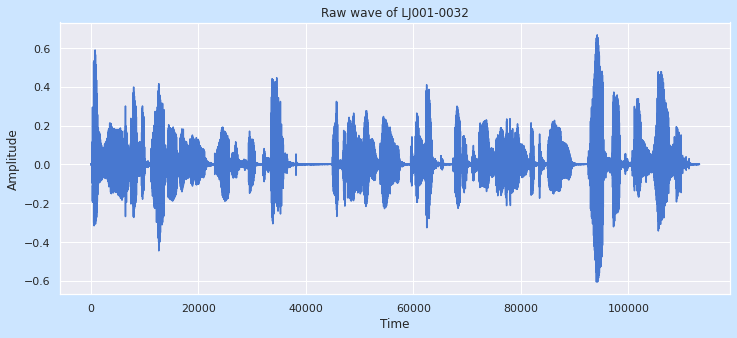

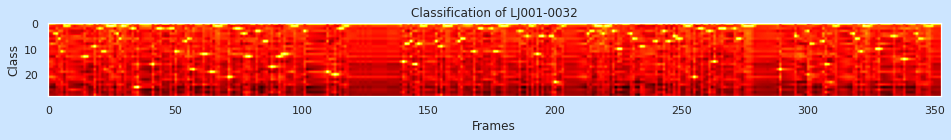



Predict a sequence of tokens tensor([ 0,  0,  0,  4,  6, 11,  0,  1,  0,  0,  0,  0,  0,  0, 13, 13,  0,  0,
         9,  0,  2, 11, 11,  1,  1,  1,  1,  4,  6,  1,  1,  0,  0,  2, 25, 25,
         0,  0,  0,  0,  0, 16,  0,  2,  2,  0,  0,  0,  2,  0, 11,  0,  0,  0,
         7,  6,  0, 18,  0,  0,  0, 12, 12,  0, 19, 19,  1,  1,  1,  0,  0, 21,
         0,  0,  2,  2,  0,  4, 13, 13,  0,  0,  3,  3,  0,  7,  7,  0, 17,  0,
         0, 13, 12, 12,  0,  0,  1,  1,  1,  0,  0,  3,  0,  0,  0,  0,  0,  0,
         0,  0, 19,  0,  0, 20,  0,  2,  2,  1,  1,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,  8,  0,  7,
        16, 16,  8,  1,  1,  0,  0,  0,  0,  7,  0,  9,  0,  1,  1,  1,  0,  0,
         7,  6,  6,  0,  0,  0, 11,  0,  2,  2,  0,  0,  0,  2, 11, 11,  0,  1,
         1,  1,  0,  0,  0,  0,  3,  0,  0,  5,  0,  1,  0, 12,  0,  5,  0,  0,
         5,  5, 23,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  3,  3,
         

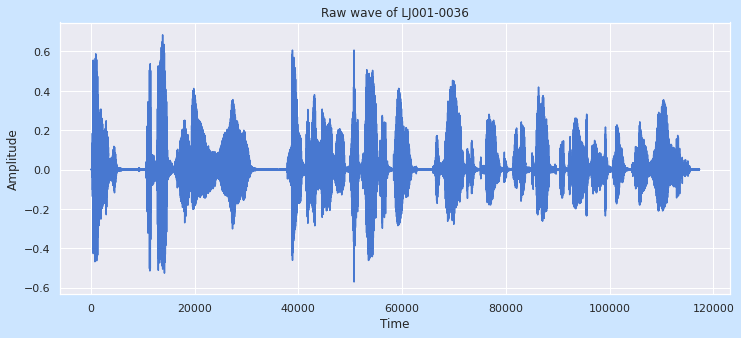

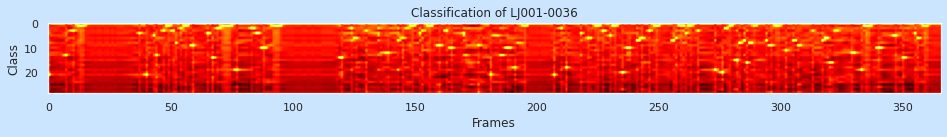



Predict a sequence of tokens tensor([21,  0,  0,  0,  0,  0,  0, 13,  0,  0,  3,  0,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  4,  0,  0, 21,  0,  0,  5, 13,  0,  0,  3,  1,  1,  0,  3,  8,  0,
         2,  1,  1,  0,  0,  9,  0,  0,  0,  0,  0,  4,  0, 14,  0,  2,  2,  1,
         1,  1,  1,  0,  0, 19,  0,  0,  0,  0,  0,  2,  2,  4,  4, 10, 10, 10,
         0,  0,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14, 14,  0,  0,  0,  2,  6,
         6,  0,  0,  0,  3,  0,  0,  0,  0,  2,  0,  0, 12, 12,  0,  0,  0,  7,
         0,  6,  0,  2,  1,  1,  0,  0,  4,  3,  0,  1,  1,  1,  0,  0,  9,  0,
         0,  3, 10, 10,  0,  0,  0,  0,  4, 13,  0,  0,  0,  0,  9,  0,  0,  0,
         0, 21,  0,  0,  0, 13, 13, 10, 10, 10,  0, 18,  0,  0,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0, 21,  0,  0,  2,  0, 18,  0,  0,  0,
         

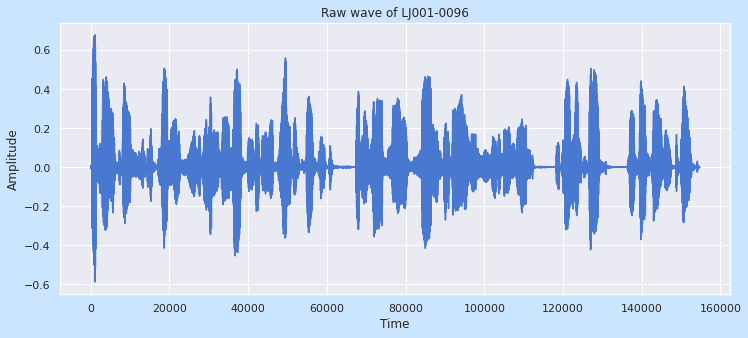

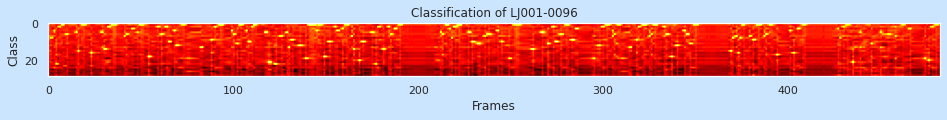



Predict a sequence of tokens tensor([ 0,  8,  0,  4, 22,  0,  2,  1,  1,  0,  6,  0,  0,  0,  0,  5, 15,  0,
         1,  1,  0,  0,  0, 16,  0,  0,  0,  0,  0,  5, 14, 14,  2,  2,  1,  1,
         1,  0,  0,  0,  0,  7,  6,  0,  0,  3,  3,  0,  5,  0,  1,  1,  0,  0,
        18,  0,  0,  0,  0,  2,  0,  6,  0,  2,  2, 10, 10,  0,  4, 12, 12,  0,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0, 13, 13,  0,  0,  0,  0,  9,  0,
         2,  0,  1,  1,  1,  0,  0,  0,  0,  4,  6,  0, 11,  1,  1,  0,  0,  4,
        10, 10,  2,  1,  1,  0,  0,  0,  0,  5,  5, 21, 21,  0, 22, 22,  0,  7,
         7,  0,  0,  5, 13,  9,  9,  0,  0, 12, 12,  0,  0, 19,  0,  1,  1,  1,
         1,  4,  1,  1,  0, 18,  0, 10, 10,  0,  0,  2,  4,  0,  0,  3,  0,  1,
         1,  0,  7, 14,  0,  0, 20,  0, 10,  0,  0,  0,  0,  5,  0, 22,  2,  0,
         0, 14,  0,  0,  2,  6,  0,  3,  3,  0,  1,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5,  6,  0,  1,
         

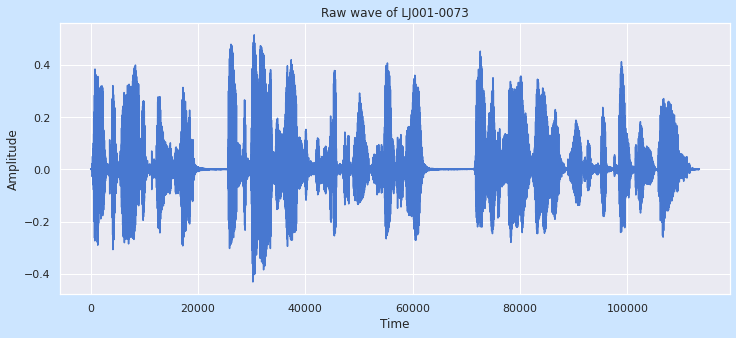

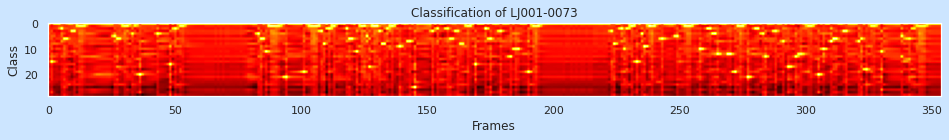



Predict a sequence of tokens tensor([ 0, 15,  0,  0,  0,  2,  6,  6,  0,  3,  3,  1,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  5,  6,  6,  0,  1,  1,  0,  4,  0,  0,
        20,  0,  0,  0,  0,  0,  0,  4,  0,  0,  0,  0, 16,  0,  2,  0,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  6,  6, 11,  1,  1,  1,
         1,  1,  0,  0, 21,  0,  0,  0,  0,  0,  0, 19,  0,  1,  1,  1,  1,  1,
         3,  8,  0,  2,  1,  1,  0,  0,  0,  0,  2,  6,  6,  0, 11,  0,  1,  1,
         5, 17,  1,  1,  1,  3,  8,  8,  2,  1,  1,  0,  0,  9,  0,  0,  7,  7,
         0, 25,  0,  0,  0,  0,  0,  0,  3,  0,  2,  0,  0,  0,  2,  6,  6,  3,
         3,  8,  8,  0,  1,  1,  0, 16,  0,  0,  0,  2,  6,  6,  0,  0,  0,  3,
         0,  0,  0, 13,  0, 10, 10,  0,  0,  0, 19,  0,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

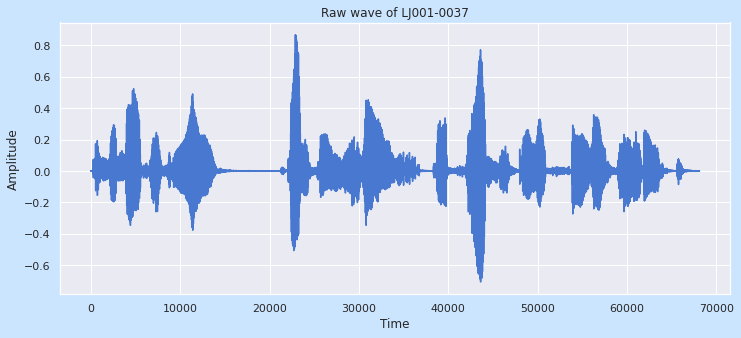

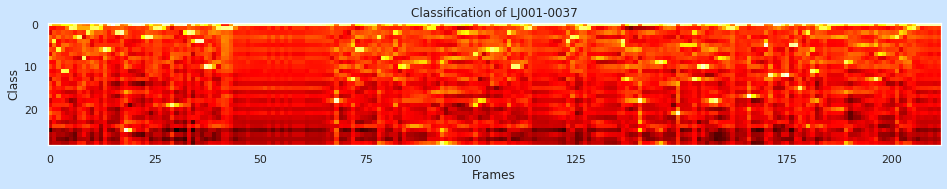



Predict a sequence of tokens tensor([ 0,  4,  6, 11, 11,  1,  0,  3,  8,  2,  1,  1,  0,  6,  0,  0,  0,  2,
        25,  0,  0,  0,  0,  3,  3,  1,  1,  0,  0, 19,  0,  0,  0,  2,  0,  4,
         4, 10, 10,  0,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 18,  0,  0,  0,
        13,  6,  6,  0,  0,  0,  3,  8,  0,  0,  2,  0, 10,  0,  0,  0,  0,  0,
         1,  0,  0, 28,  0,  0,  0,  0,  0,  2,  0,  7,  0,  0,  0,  6,  0,  0,
         0,  2, 10, 10,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  4,  3,  0,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  4, 13,  0,  0, 18,  0,  0,  0,
         0,  9,  0,  0,  0, 21,  0,  0,  0, 13,  0, 10, 10, 18, 18,  0,  0,  1,
         1,  0,  0,  0, 17,  0,  0,  0,  5, 12,  0,  0, 12, 12,  5,  5, 15,  0,
         2, 11,  0,  1,  1,  0,  0,  0,  0,  9,  0,  0,  0,  0,  0,  0, 13,  7,
         0,  0,  0,  3,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0])

Merge repeats  tensor([

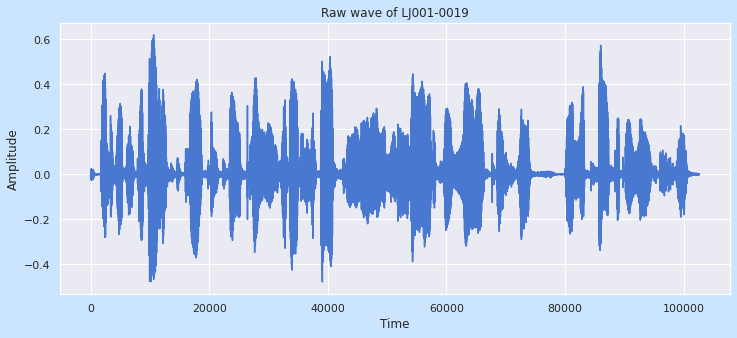

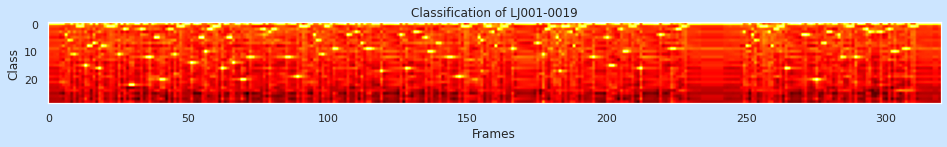



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  4,  6,  0, 11,  1,  1,  0, 15,  8,  0,  7,  0,
        16,  8,  0,  1,  1,  1,  0, 11,  0,  2,  0, 22, 22,  0,  0,  2,  0, 12,
        12,  0,  5,  5, 20, 20,  0,  2,  0, 11,  0,  1,  1,  0,  0, 14,  0,  0,
         5,  5, 10,  2,  2,  1,  1,  0, 16,  0,  5,  5, 14,  0,  0, 20, 20,  0,
        12,  0,  0,  0,  0,  2,  0,  3,  2,  2,  0,  0,  0, 12, 12,  0,  0, 19,
         1,  1,  1,  0,  0,  4,  6,  0, 11,  1,  1,  0,  9,  9,  0,  0,  0,  4,
         0,  0,  3,  0,  7,  0,  9,  9,  0,  0,  0, 17,  0,  0,  0,  0,  0,  0,
         4,  0, 16,  0,  0,  3,  3,  0,  0,  5, 10, 10,  0,  7,  7,  0,  0, 12,
        12,  0,  0, 19,  1,  1,  1,  0,  0,  0,  5,  6,  0,  1,  1,  3,  8,  2,
         1,  1,  1,  0,  9,  0,  0,  0,  0,  0,  0,  0,  0,  7,  0, 11,  2,  2,
         1,  1,  5, 17,  1,  1,  1,  3,  8,  2,  1,  1,  1,  0,  0, 12,  0,  0,
         0,  0,  5, 15, 15,  0,  0,  2, 10, 10,  0,  1,  0,  0, 16,  0,  0,  0,
         

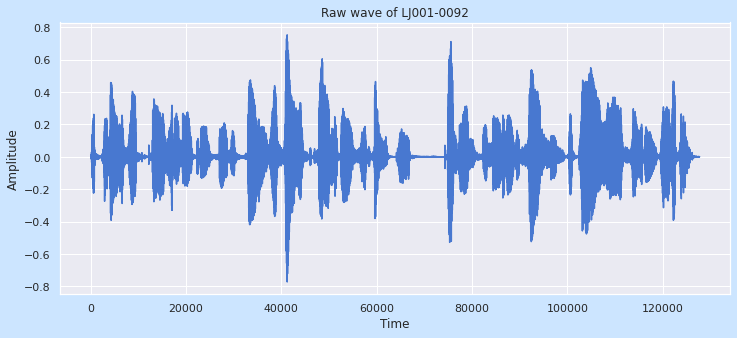

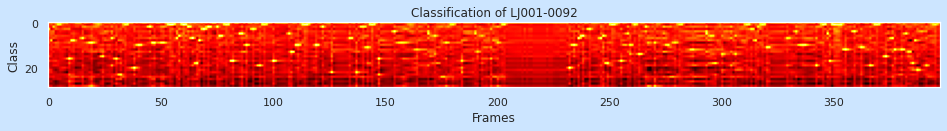



Predict a sequence of tokens tensor([ 3,  8,  2,  0,  1,  0,  0,  0,  0, 16,  8,  8,  0,  0,  0,  7,  0,  0,
         9,  9,  0,  0,  0,  0, 15,  0,  0,  0,  7,  0, 16,  0, 23,  0,  1,  0,
         0,  0, 20,  0, 10, 10,  0,  0,  0,  2,  9,  9,  0,  0,  9,  9,  0,  1,
         1,  1,  0,  7,  6,  0,  1,  1,  2,  2,  7, 18, 18,  8,  3,  3,  3,  2,
         2,  0,  0,  2,  6,  6,  0,  1,  1, 17, 17,  0,  0,  5,  5,  0, 10,  0,
         0,  3,  0,  0, 19,  1,  1,  0,  0,  0, 17,  0,  0,  0,  0,  0,  0,  5,
        13,  0, 10, 10,  0,  1,  1,  1,  0,  0,  0, 10,  0,  0,  2,  0,  0,  0,
        22,  0,  0,  0,  0,  0,  0,  0,  7,  7,  0, 22,  0,  2,  2,  2, 11,  1,
         1,  0,  0, 16,  0,  0,  0,  0,  0,  0,  4,  0,  0,  9,  9,  9,  0,  0,
         0,  0, 12,  0,  0,  0,  0,  5,  0,  0,  6,  0,  0,  0, 24,  9,  0,  0,
         1,  0,  0,  0, 17,  0,  0,  0,  0,  0,  5, 13,  0,  6,  0,  0,  0, 16,
         0,  0,  9,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

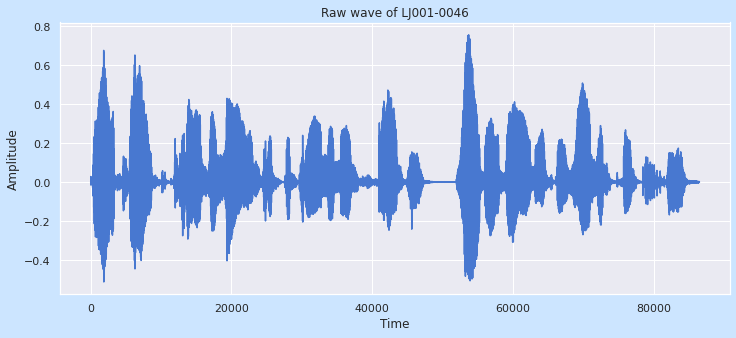

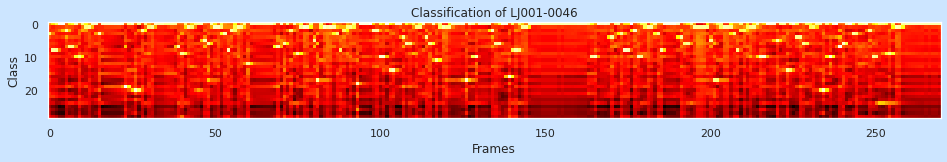



Predict a sequence of tokens tensor([ 3,  8,  8,  0,  0,  2,  7,  7,  0, 10,  0,  1,  1,  0,  0,  3,  0,  0,
         0,  0,  0,  0,  0, 19,  0,  0, 20,  0,  2,  0,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  7,  9,  0,  1,  1,  0,  0,  0,  5,  6,  0,  1,  1,  1,  3,
         8,  2,  2,  1,  1,  0, 12,  0,  0,  0,  0,  0,  0,  0,  0,  7,  0,  6,
         0,  2,  0,  9,  1,  1,  1,  0,  5, 17,  0,  1,  1,  1,  1,  3,  8,  2,
         1,  1,  0, 18,  0,  0,  0,  0,  2,  2, 10, 10,  0, 14, 14,  0,  0,  4,
         6,  6,  0,  1,  1,  0,  4,  6,  0, 11,  0,  1,  1,  1,  0,  0,  0,  0,
        17,  0,  0, 10,  0,  0,  0,  0,  2,  6,  6,  0,  0, 16,  0,  8,  8,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0, 10, 10,  0,  0,  0,  0,  4,  0,  0,  3,  8,  8,  0,  2, 10, 10,
         1,  1,  1,  0,  3,  8,  0,  0,  0,  0,  0,  4,  6,  6,  0,  1,  1,  1,
         1,  1,  5, 17, 17,  0,  1,  1,  1,  3,  8,  0,  2,  1,  1,  1,  0, 10,
        1

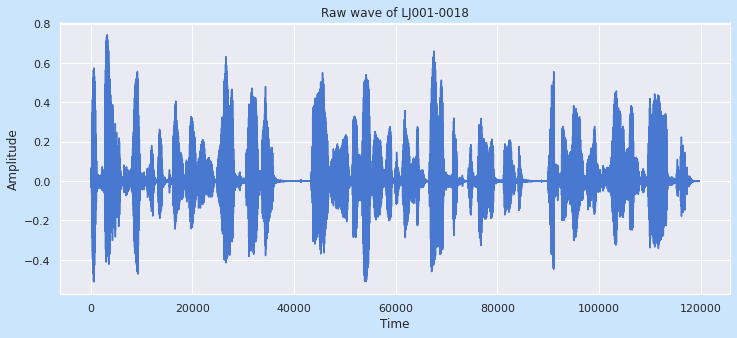

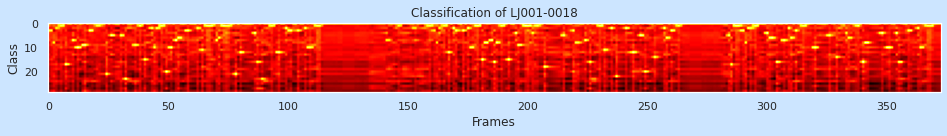



Predict a sequence of tokens tensor([ 3,  3,  8,  2,  0,  1,  1, 17,  0,  0,  7,  0, 10,  0,  9,  9,  0,  3,
         3,  0,  1,  1,  0,  0, 21,  0,  5,  5,  0,  0,  5,  0, 23,  0,  0,  0,
         9,  9,  1,  0, 15,  0,  0,  2, 10,  2,  0,  1,  1, 20, 10, 10,  0,  7,
         6,  6,  0,  3,  3,  0,  0,  0,  2,  0, 11,  1,  1,  1,  1,  0,  7,  6,
         1,  1,  1,  1,  0,  0, 21,  0, 12,  0,  0,  0,  0,  0,  4, 16,  0, 23,
         0,  0,  1,  1,  0, 12, 12,  0,  0,  2,  3,  3,  0,  0,  3,  0,  0,  2,
        10, 10, 10,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  7,  0,
         0,  0,  1,  0,  0,  0,  0,  0,  0,  2,  0,  0,  0,  0,  1,  1,  1,  3,
         8,  2,  0,  1,  1, 12,  0,  2,  3,  0,  0,  3,  0,  2, 10, 10,  1,  1,
         0, 15,  8,  8,  7,  7, 16,  8,  8,  1,  1,  0, 15,  0,  0,  4,  9,  9,
         1,  1,  1,  1,  4,  1,  1,  0,  0, 18,  0,  0,  0,  0,  0,  0,  0,  5,
         

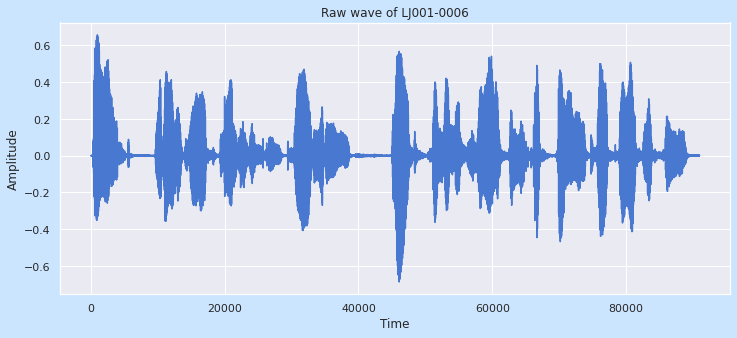

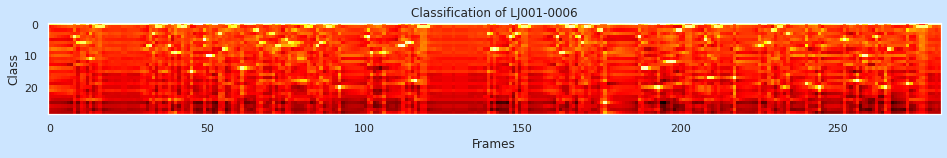



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  0,  0,  4,  0,  6,  6,  0, 11,  0,  1,  1,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  3,  1,  1,
         0,  0,  7,  0,  9,  0,  1,  1,  0, 15,  0,  0,  0,  5, 10, 10,  0,  0,
         3,  8,  0,  0,  1,  1,  0, 14,  0,  0,  0,  0,  2,  6,  0,  0,  0,  3,
         7,  7,  0,  5,  6,  6,  0,  0,  0,  1,  1,  0,  0,  7,  6,  0,  1,  1,
         0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  4,  9,  0,  0,  0,  9,  0,
         0,  0,  0,  7,  7,  6,  6, 18, 18,  1,  1,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  0,  8,  0,  0,
         0,  0,  4,  0,  3,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,
         9,  9,  0,  1,  1,  0,  4,  6,  1,  1,  0,  0,  0,  2, 25,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  4, 14, 14,  0,  0,  0, 20,  0,  0, 12, 12,
        12,  2,  2,  0,  1,  1,  0,  0,  0,  0,  5, 17,  0,  1,  1,  0,  0,  0,
         

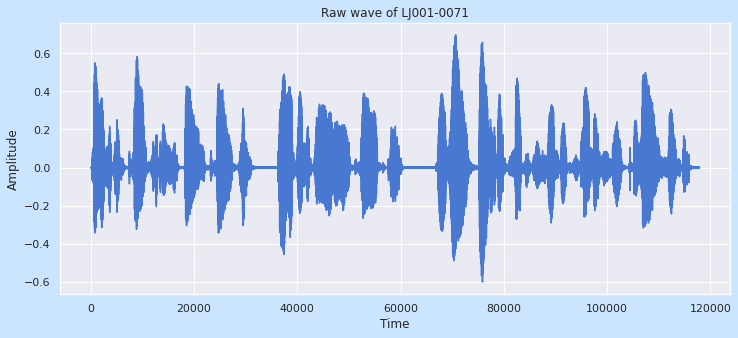

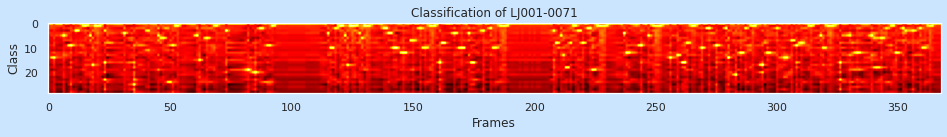



Predict a sequence of tokens tensor([ 0,  0, 14,  0,  0,  0,  5,  0,  0,  9,  0,  3,  3,  0,  1,  1,  0,  5,
        17,  1,  1,  1,  0, 16,  0,  0,  0,  0,  0,  0,  0,  4,  0,  0,  0, 25,
         0,  0,  0,  0,  3,  3,  0,  0,  0,  5,  6,  6,  0, 24, 24,  9,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  5, 15,  0,  0,  6,  0,  0,  1,  1,  0,  0,
         0,  3,  0,  0,  0,  0,  0,  0,  0,  0, 19,  0,  0, 20,  0,  2,  2,  0,
         9,  9,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  4, 10, 10,  2,  0,  1,  1,  5, 17,  1,  1,
         1,  1,  4,  6,  1,  1,  1,  0,  0,  0,  0,  0,  2,  2,  4,  4, 10, 10,
         0, 12, 12, 12,  0,  7,  7,  0,  0,  2, 10, 10,  0,  1,  1,  1,  0, 16,
         8,  8,  0,  0,  0,  4,  0, 10, 10, 10,  0,  4, 16, 16,  0,  0,  0,  3,
         0,  0,  2, 10, 10,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  5, 13, 18, 18,  8,
         

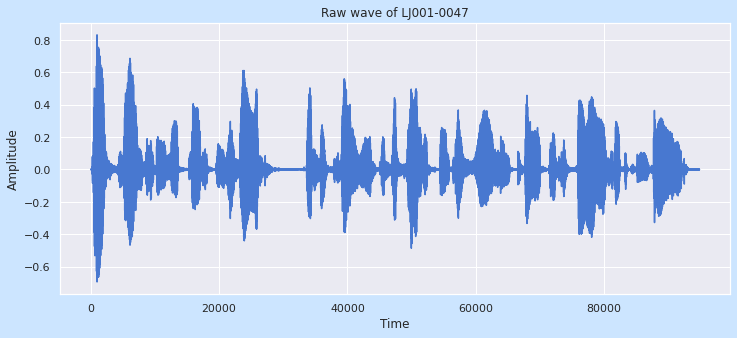

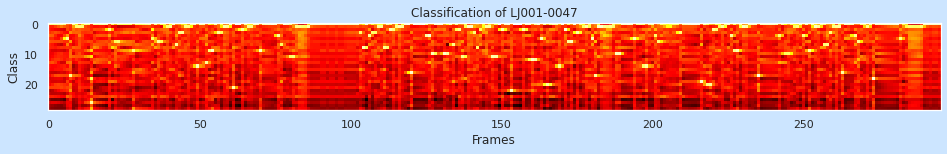



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  5, 17,  0,  1,  1,  1,  0,  0, 26,  0,  0,  0,
         0,  0,  2,  0,  6,  6,  0,  0,  0,  0,  9,  0,  0,  0,  0,  0,  5,  0,
         6,  6,  0,  1,  1,  0,  7,  3,  3,  1,  1,  0,  0, 14,  0,  0, 13,  9,
         9,  0,  3,  3,  1,  1,  0, 21,  0,  0,  2,  0,  1,  1,  0,  0,  9,  0,
         0,  0,  0,  0,  4,  7,  0,  0,  0, 11,  1,  1,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  4,  3,
         3,  1,  1,  8,  0,  2,  2,  1,  1,  1,  0,  0, 16,  0,  0,  0,  0,  4,
         4, 10,  0,  0,  0, 10, 10,  0,  7,  0,  2, 11,  1,  1,  1,  3,  8,  2,
         0,  1,  1, 11, 11,  0,  2,  0,  0, 22,  0,  0,  0,  2,  0,  0, 12, 12,
         0,  5,  0, 20,  0,  0,  0, 14,  0,  2,  6,  6,  0,  3,  0,  1,  1,  1,
         5, 17,  1,  1,  1,  1,  1,  1, 10, 10,  0,  0,  0,  0,  5,  0,  0, 14,
        14,  0,  0,  4,  6,  0,  0,  1,  0,  0,  0,  3,  0,  0,  0,  0,  0,  0,
        1

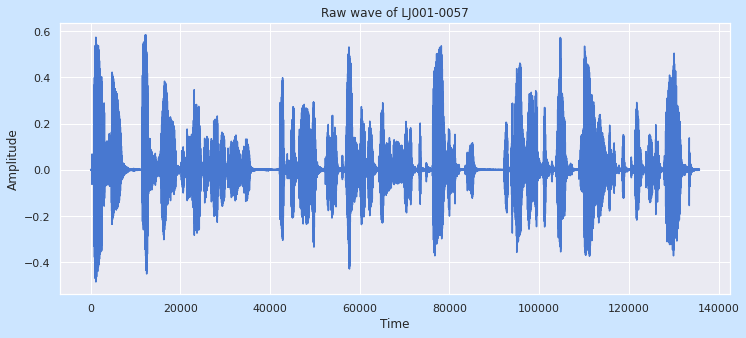

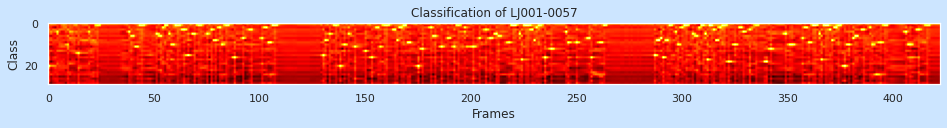



Predict a sequence of tokens tensor([20,  0,  0,  0,  4,  0,  0,  0,  0, 10,  0,  0,  0,  0, 14,  0,  0,  0,
         0,  4,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  4,  6,  6, 11, 11,  1,  1,  1,  0,  0,  0,  0,  0,  5,  0,  6,
         2,  1,  1,  5, 10, 10,  1,  1,  1,  3,  3,  3, 15,  0,  5,  5,  0,  1,
         1,  0,  0,  5,  0,  3,  8,  8,  0,  2, 10,  0,  1,  1,  0,  0, 16,  0,
         0,  0,  7,  0,  0,  3,  3,  0,  0,  0,  0,  7,  2,  2,  9,  9,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0, 15,  8,  0,  5,  0,  1,  1,  0, 20,  0, 10,  0,  5,  0,
         0, 11,  0,  0,  0,  0, 13,  0,  0, 16,  0,  2,  2, 11,  0,  1,  1,  0,
         0,  3,  3,  8,  2,  2,  1,  1,  9,  9,  0,  0,  0, 20,  0, 12,  0,  0,
         0,  2,  6,  6,  0,  0, 11,  0,  0,  7,  7,  0, 11,  0,  1,  0,  0,  2,
         0,  0,  0, 11,  0,  0,  7,  0,  0,  3,  0,  7,  0,  0,  5,  6,  6,  0,
         

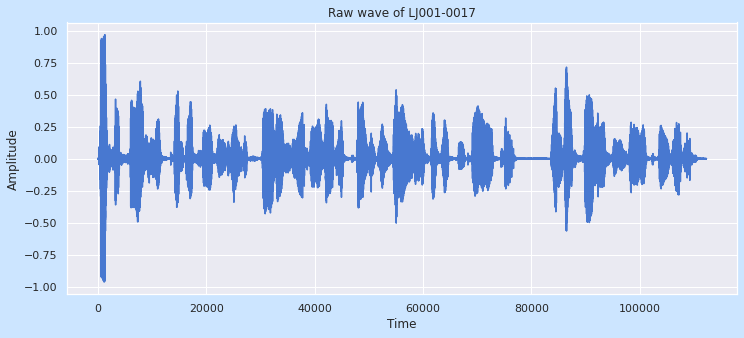

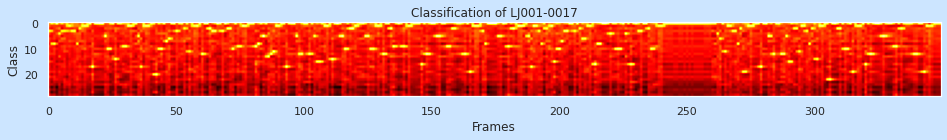



Predict a sequence of tokens tensor([ 3,  0,  8,  0,  4,  3,  3,  1,  1,  3,  3,  8,  2,  1,  1,  1,  0, 17,
         0,  0,  0,  0,  5, 10, 10,  0, 14,  0,  0,  9,  9,  1,  1,  0,  0,  5,
        17,  1,  1,  1,  0,  0, 20, 10, 10,  0,  7,  6,  0,  0,  3,  0,  0,  2,
         0, 11,  0,  1,  1,  0, 12,  0,  0,  2,  3,  3,  0,  0,  3,  0,  2,  2,
        10,  0,  9,  9,  1,  1,  0,  0,  0,  9,  8,  0,  5,  0, 13, 12, 11,  1,
         1,  0,  0, 17,  0,  0,  0,  5, 12, 12,  0,  0, 12,  0,  5, 15, 15,  0,
         1,  1,  0, 14,  0,  0,  5,  5, 10, 10,  2,  2,  1,  1,  0,  0,  5,  5,
        10, 10,  1,  1,  1, 12,  0,  0,  2,  9,  0,  0,  9,  9,  1,  1,  1,  0,
         0,  0, 16,  0, 12, 12,  0,  0,  5,  5,  0,  0,  9,  9,  2,  2,  0,  0,
        12, 12,  0, 19,  1,  1,  1,  0,  3,  8,  0,  0,  0,  0,  5,  5,  0,  0,
         9,  2,  2,  0,  1,  1,  1,  0,  5, 17,  1,  1,  3,  8,  2,  2,  1,  1,
        15, 10, 10,  7,  3,  3,  0,  0,  3,  0,  2,  6,  6,  1,  1, 16, 16,  8,
         

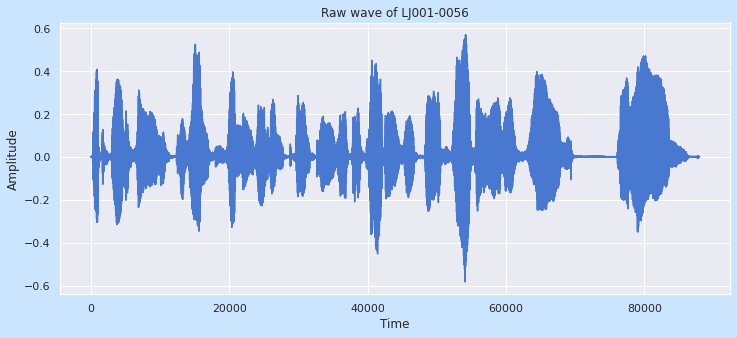

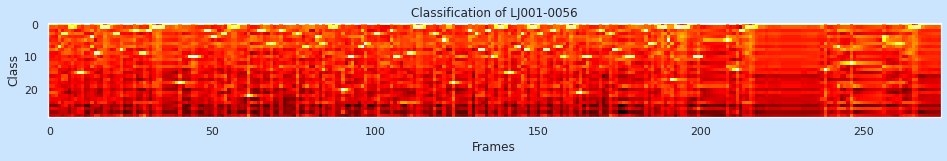



Predict a sequence of tokens tensor([ 0,  0,  0,  7,  3,  3,  0,  1,  0, 15, 15,  0,  0,  4,  9,  9,  1,  1,
         1,  0,  3,  3,  8,  0,  0,  0,  2,  2,  0,  9,  2,  2,  1,  1,  1,  1,
         0,  0,  0,  0, 18,  0,  0, 10, 10, 10,  0,  0,  2,  2,  4,  4,  0,  3,
         3,  0,  1,  1,  0,  0,  0, 22,  0,  0,  2,  2,  0,  0,  6,  0,  0,  2,
         0,  0,  0,  0,  3,  0,  0,  7,  0,  0,  4,  0,  6,  0,  1,  1,  0,  0,
        20,  0, 10, 10,  0,  0,  7,  6,  0,  0,  3,  3,  0,  0,  0,  2, 10, 10,
         0,  0,  9,  9,  1,  1,  1,  0,  0,  0,  3,  0,  0,  5,  0,  0, 18,  0,
         0,  0,  0,  2,  0,  3,  8,  8,  0,  2, 10,  0,  1,  1,  0, 15,  0,  0,
         7,  3,  8,  8,  1,  1,  0,  3,  8,  8,  0,  2,  7,  0, 10,  1,  1,  1,
         0, 21,  0, 10,  0,  0,  0,  2,  0,  0,  3,  8,  8,  0,  0, 10, 10, 10,
         0,  0,  0,  2,  6,  6,  0,  1,  1,  1,  5, 17,  1,  1,  1,  1,  1,  0,
        10, 10, 10,  0,  0,  0,  0,  0,  0,  0,  5,  0,  0, 14,  2,  2,  1,  1,
         

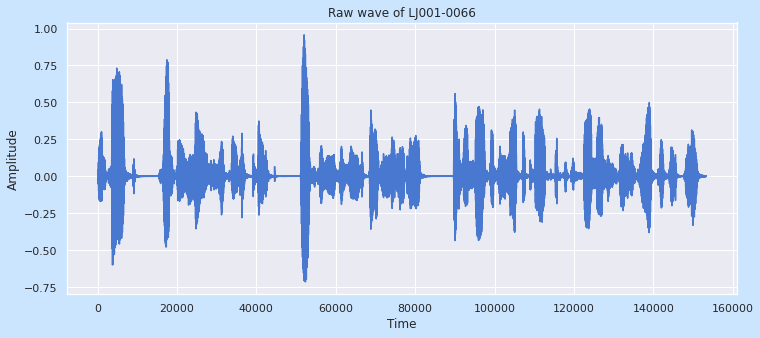

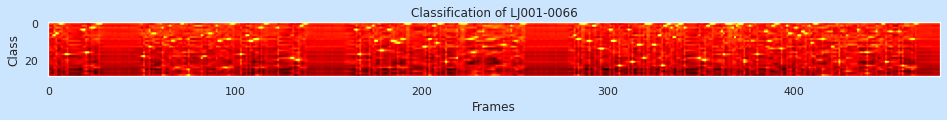



Predict a sequence of tokens tensor([ 0,  0,  0,  7,  6,  0,  1,  1,  0, 17, 17,  0,  0,  0,  0,  0,  0,  0,
         4,  4, 16, 16,  0,  3,  3,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 18,  0,  0,
        13,  0,  6,  6,  0,  0,  0,  3,  8,  0,  0,  2, 10, 10,  0,  0,  0,  1,
         1,  0,  0, 28,  0,  0,  0,  0,  0,  0,  7,  0,  0,  0,  6,  6,  0,  0,
         2, 10, 10,  0,  0, 24,  9,  9,  1,  1,  0,  0,  0, 17,  0,  0,  7,  7,
        10, 10,  0,  9,  9,  3,  3,  0,  1,  1,  0,  0,  0,  0,  0,  3,  0,  0,
         0,  0,  0,  0, 19, 19,  0, 20, 20,  2,  2,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  4,  0, 17,  0,  0,  0,  0,  3,  0,  2, 10, 10,  0, 15, 15,
         0,  0,  4,  4, 10, 10,  0, 11, 11,  0,  9,  0,  1,  1,  0,  0,  0,  0,
         0,  0,  0, 13, 13,  0,  9,  0,  0,  2, 11,  0,  1,  0,  0, 21,  0,  0,
         

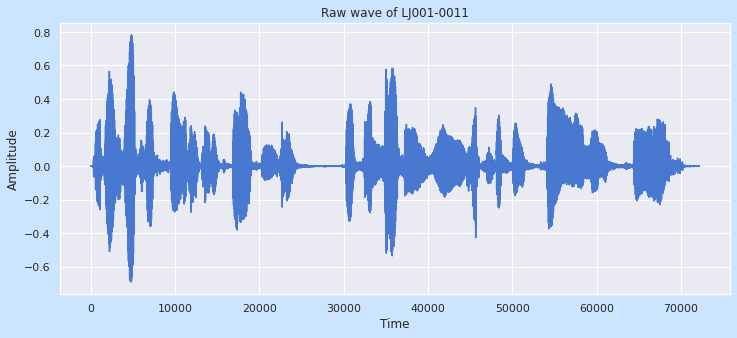

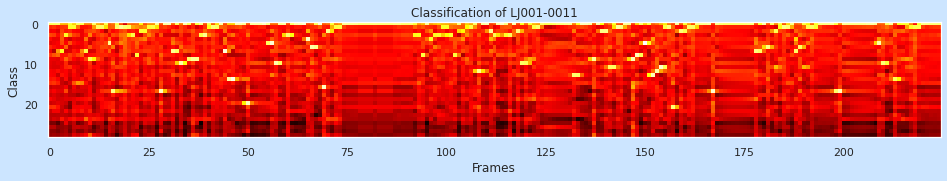



Predict a sequence of tokens tensor([ 0,  0,  0,  7,  3,  1,  1,  0,  0,  7,  9,  0,  1,  1,  0,  5, 17,  1,
         1,  1,  1,  3,  8,  2,  2,  1,  1,  0, 17,  0,  0,  7,  7, 10,  0,  9,
         9,  9,  0,  3,  0,  1,  1,  0,  7, 14, 14,  0,  0,  0, 20,  0,  0,  0,
         0,  0,  5, 10,  0,  0,  3,  0,  0,  0,  0,  4,  6,  6,  0, 16,  2,  0,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  3,  8,  0,  4,  3,  3,  1,  1,  3,  8,  0,  2,  1,  1,  0,
        12,  0,  0,  2,  3,  0,  0,  0,  3,  0,  2, 10, 10,  0,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0, 13, 13,  0,  0,  0,  9,  0,  2,  2, 11, 11,  1,
         1,  0,  0,  9,  8,  0,  5,  0, 13, 12, 11, 11,  1, 21,  0,  2,  2,  1,
         1,  0,  0,  0,  0, 17,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  7,
         0,  6,  0,  2,  0,  1,  1,  0,  7,  6,  0,  1,  1,  1,  0,  0,  0,  0,
        17, 17,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5, 10,  0,  0, 14,  0,  0,
         

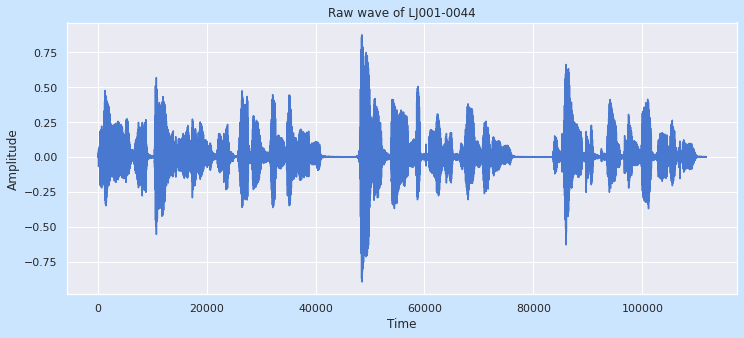

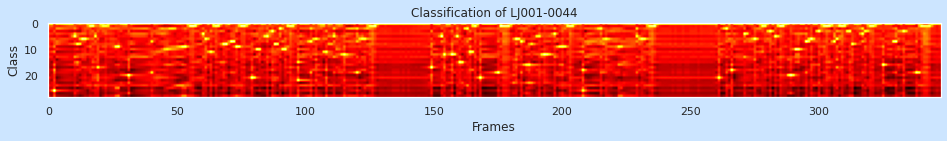



Predict a sequence of tokens tensor([ 0,  0, 26,  0,  0,  0,  0,  0,  0,  0,  5,  8,  0,  6,  6,  0,  1,  1,
         5, 17,  0,  1,  1,  0,  0,  0,  9,  9,  0,  0,  0, 20,  0,  0,  0,  0,
         0,  0,  0,  0,  7,  0,  0,  0,  0, 10, 10,  2,  2,  0,  0,  0,  9,  9,
         0,  1,  1,  1,  0,  0,  4,  6,  0, 11,  0,  1,  1,  0,  8,  8,  0,  7,
         7,  9,  9,  1,  1,  0,  0, 21,  0, 10, 10,  0,  0,  5,  0,  3,  8,  8,
         2, 10, 10,  1,  1,  1,  0, 22,  0,  0,  0,  0,  7,  0,  6,  0,  0,  0,
        11,  0,  0,  5,  0,  0,  0, 12,  0,  0,  0,  0, 19,  0,  6,  6,  0,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0, 17,  0,  0,  0,  5, 12,  0,  0, 12,  0,  5, 15,  0,
         0,  2, 11, 11,  1,  0, 21,  0,  0,  0,  0,  0,  0, 19,  1,  1,  1,  1,
         0,  0,  6,  6,  7,  0, 16, 16,  8,  0,  0,  5,  0, 12, 12,  0,  0,  4,
         0,  9,  9,  9,  1,  1,  1,  0,  0,  0, 18,  0,  0,  0,  0,  0,  0,  2,
         

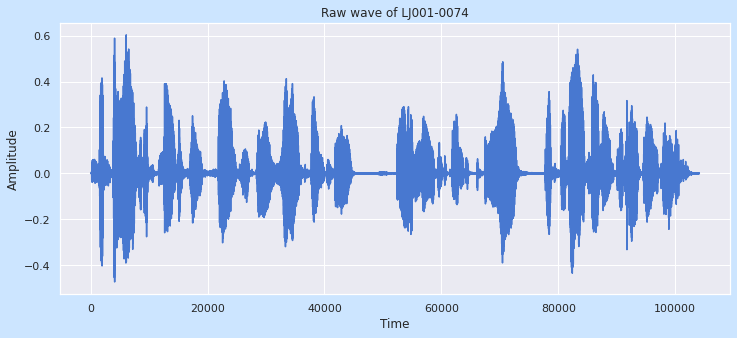

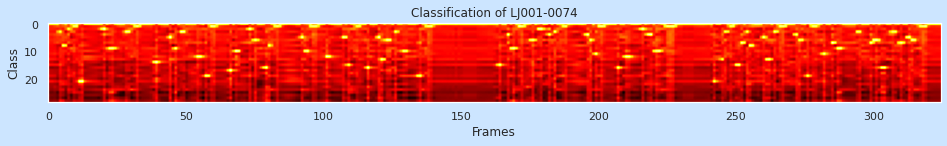



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  3,  8,  0,  2,  0,  1,  1, 21, 21,  0,  0,  0,  0,  0,
         0,  0,  2,  0,  9,  9,  0,  0,  0,  0,  3,  3,  0,  0,  1,  0,  0,  0,
         0,  0,  0, 14,  0,  0,  0,  0,  5,  0,  9,  0,  3,  3,  0,  0,  0,  0,
        12, 12,  0, 19, 19,  1,  1,  0,  0,  0,  0,  0, 17,  0, 10, 10,  0,  0,
         0,  2,  0,  6,  0,  0,  0, 16,  8,  0,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  5, 10, 10,  1,  1,  1,  0,  0,  0, 12, 12,  0,  0,  0,  0,  5,
         5, 15,  0,  0,  1,  1,  0,  0, 16,  0,  0,  0,  5, 13,  0,  6,  6,  0,
         3,  0,  0, 10, 10,  0,  0,  0, 19, 19,  0,  1,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0, 15,  0,  0,  4,  9,  9,  0,  1,  1,  0,  0,  6,  6,  0,  2,  2,
         0,  0,  4,  0,  3,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  4,  6,
         0, 11,  1,  1,  1,  0,  0,  0,  0, 16,  0,  0, 12, 12,  0,  0,  0,  0,
         

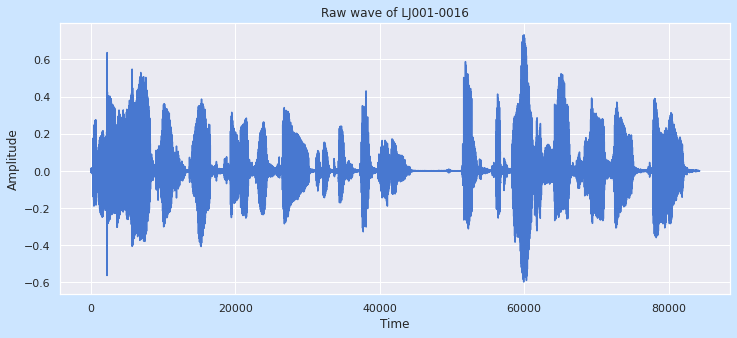

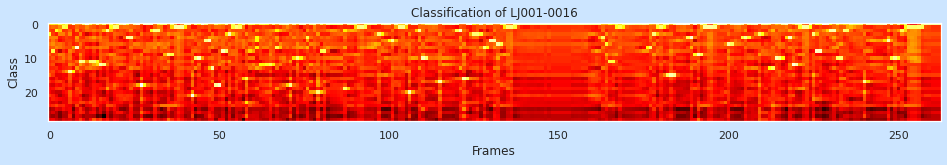



Predict a sequence of tokens tensor([ 3,  8,  2,  0,  1,  0, 14,  0,  7, 11, 11,  0, 11, 11,  0, 12, 12,  2,
         0,  1,  1,  0,  0,  4,  4,  0,  0, 18,  0,  0,  0,  2,  2,  0,  0,  9,
         0,  1,  1,  1,  0,  0, 21,  0, 10,  0,  5,  5, 13, 18, 18,  8,  0,  3,
         0,  1,  1,  0, 16,  0,  0,  4,  0,  0, 12, 12,  0,  7,  0,  0,  0, 18,
         0, 10,  0,  0,  4,  0,  0, 20,  0,  8,  0,  0,  0,  0,  0, 19,  0,  0,
         0,  1,  1,  1,  0,  0,  0,  3,  0,  0,  0,  5,  0,  1,  1,  0, 20,  0,
         0,  2, 10, 10,  0,  0,  0, 17,  0,  0,  0,  0,  0,  2, 16,  0,  0,  3,
         3,  0,  7,  0,  5,  5,  6,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  4,  6, 11, 11,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  7,  3,  0,
         1,  0,  0, 15, 15,  0,  0,  0,  0,  4,  0,  9,  0,  1,  1,  1,  1,  0,
         0,  0,  6,  0,  0,  0,  0,  4,  0,  0,  0,  3,  0,  0,  0, 13, 10, 10,
         

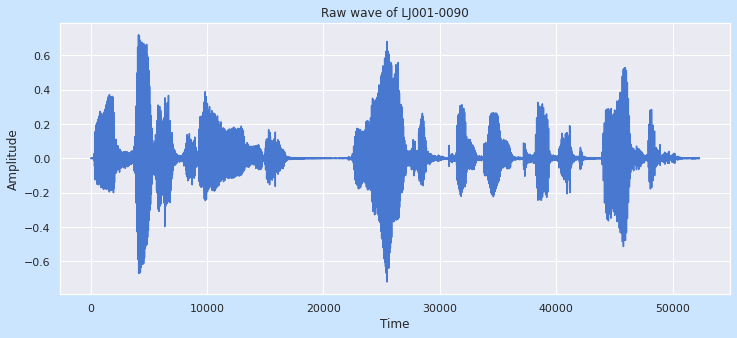

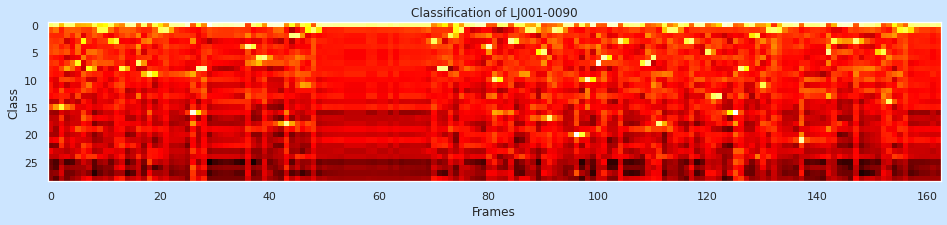



Predict a sequence of tokens tensor([ 0,  0, 15,  0,  0,  7,  3,  8,  0,  1,  1,  0,  3,  8,  0,  0,  7,  0,
         9,  0,  1,  1,  0,  0,  0,  0, 16,  8,  8,  0,  0,  0,  0,  0,  0,  0,
         4,  0,  6,  6,  0,  0,  0, 18,  2,  2,  0,  0,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  8,
         8,  2,  0,  1,  0,  0,  0,  0,  4, 10,  0,  0,  3,  0,  0,  1,  1,  0,
         5, 17,  1,  1,  0,  0, 20,  0, 10,  0,  7,  6,  0,  0,  3,  0,  0,  0,
         0,  7,  6, 18,  0,  1,  1,  0,  0,  3,  0,  0,  5, 13, 13,  0,  0, 16,
         8,  0,  0,  2, 11,  1,  1,  1,  0,  0,  0, 21,  0,  0,  0,  0,  5,  3,
         0,  0,  0,  3,  0,  0,  0,  0,  5, 14,  0,  1,  1,  0,  0,  0,  0,  0,
         0])

Merge repeats  tensor([ 0, 15,  0,  7,  3,  8,  0,  1,  0,  3,  8,  0,  7,  0,  9,  0,  1,  0,
        16,  8,  0,  4,  0,  6,  0, 18,  2,  0,  1,  0,  3,  8,  2,  0,  1,  0,
         4, 10,  0,  3,  0,  1,  0,  5, 17,  1,  0, 20,  0, 

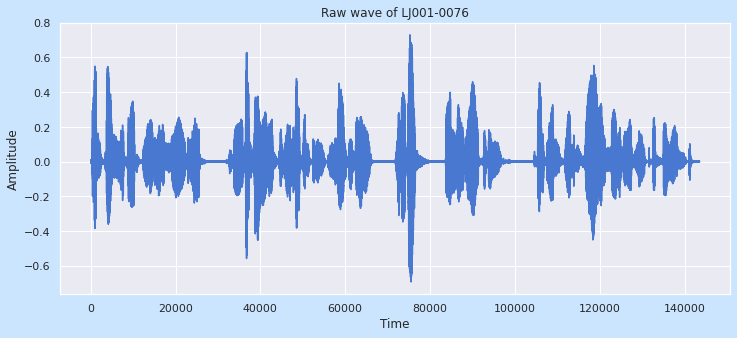

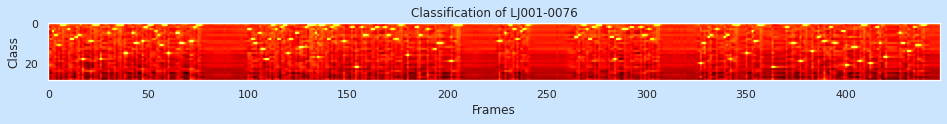



Predict a sequence of tokens tensor([ 0,  0,  4,  6,  0, 11,  1,  1,  1,  0,  3,  8,  8,  0,  7,  6,  0, 18,
         0,  0,  0,  9,  0,  1,  1,  0, 18,  0,  0,  0,  5,  0,  0,  3,  0,  1,
         1,  1, 15, 15,  0,  0,  5, 10, 10,  0,  0,  9,  2,  2,  1,  1,  0,  0,
         4,  6, 11, 11,  1,  0, 15,  0,  0,  0,  5,  5, 10, 10,  0,  0,  0,  9,
         9,  2,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  3,  8, 10, 10,  0,  5, 13,
        13, 18, 18,  8,  1,  1,  3,  8,  0,  2,  1,  1, 15,  8,  0,  0,  5,  5,
        12, 12,  0,  2,  0,  1,  1,  1,  5, 17,  1,  1,  1,  3,  8,  0,  2,  0,
         1,  1,  0,  0,  9,  0,  0,  0,  2,  0, 22, 22,  0,  2,  6,  6,  0,  0,
         3,  3,  0,  2,  0,  0,  0,  2,  6,  0,  3,  3,  8,  8,  1,  1,  0,  0,
        16,  0,  0,  0,  2,  2,  6,  0,  0,  0,  3,  0,  0,  0, 13, 10, 10, 10,
         0,  0,  0,  0, 19,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

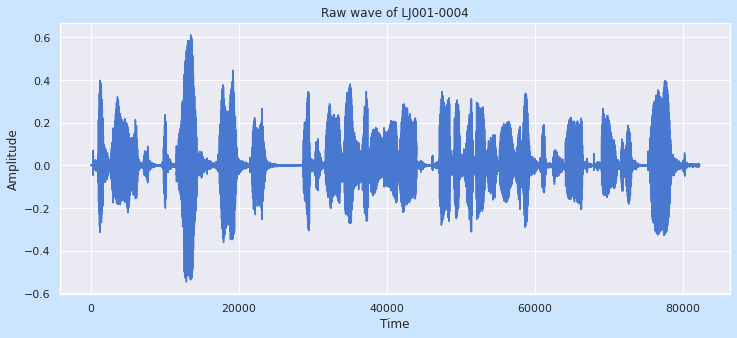

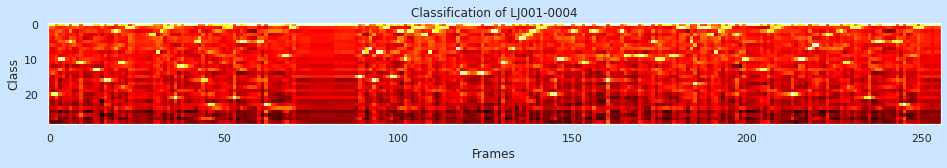



Predict a sequence of tokens tensor([ 0,  0, 20, 10, 10,  0,  5,  0,  0, 11,  0,  0,  0, 13, 13,  0, 16, 16,
         0,  2, 11, 11,  1,  1,  1,  0,  0,  0,  0,  0,  3,  8,  2,  0,  1,  0,
        21,  0, 12,  0,  0,  0,  0,  5, 16,  0, 23, 23,  0,  0,  0,  1,  0, 21,
         0,  5,  5,  0,  0,  0,  5,  0, 23,  0,  0,  0,  0,  9,  9,  1,  1,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,
         8,  0,  7, 16,  8,  8,  1,  1, 15, 15,  2,  2, 10,  2,  2,  1,  1,  1,
         3,  8,  2,  2,  1,  1,  0,  0,  0,  7, 14, 14,  0,  0,  0,  0, 14,  0,
         0,  2,  2,  0, 11,  0,  0,  7,  0,  4,  4,  3,  2,  2,  1,  1,  0,  0,
         0, 20, 10, 10,  0,  0,  2,  0,  0, 11,  0,  0,  2,  0,  0,  0, 16,  0,
         0,  0,  2,  9,  0,  0,  0,  9,  9,  0,  0,  5,  0, 10,  0,  0,  0,  9,
         0,  1,  1,  0,  5, 17,  1,  1,  1,  1,  3,  8,  2,  1,  1,  0,  0,  3,
         0, 10,  0,  0,  0,  0, 13, 13,  2,  0,  1,  1,  0,  0,  0, 20,  0, 10,
        1

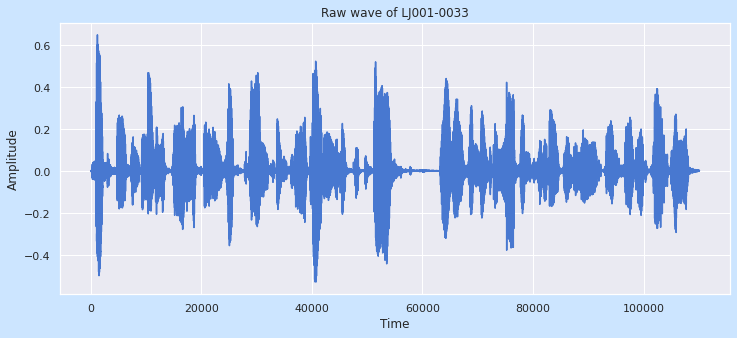

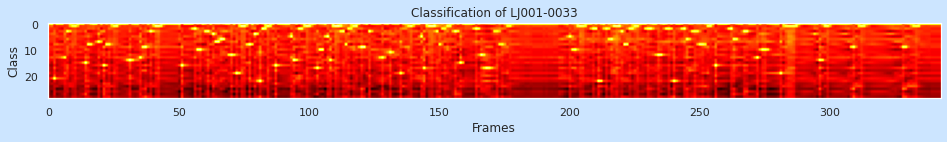



Predict a sequence of tokens tensor([ 0,  0, 21,  0,  0,  0, 13,  3,  0,  1,  1,  0,  0,  0, 15,  8,  0,  0,
         0,  7,  0, 16,  8,  8,  0,  1,  1,  0,  0,  0,  0, 14,  0,  0,  0, 13,
         9,  9,  0,  3,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0, 16,  0,  0,
         0,  0,  2, 10, 10,  0,  3,  3,  0,  4,  7,  7,  6,  6,  0,  0, 12,  0,
        19, 19,  1,  1,  0,  8,  0,  4,  0, 22,  2,  2,  1,  0,  0, 16,  0,  0,
         0,  0,  0,  5, 14,  0,  2,  2,  1,  1,  1,  0,  0, 17, 10, 10,  0,  5,
        14,  1,  1,  1,  1,  3,  8,  2,  2,  1,  1,  0,  9,  9,  0,  3,  0,  0,
         0,  0, 13,  0,  0, 11,  0,  0,  0, 19,  0,  0,  1,  1,  0,  0,  0,  5,
        17,  0,  1,  1,  1,  3,  8,  2,  2,  1,  1,  0,  3,  0, 15,  0,  0,  0,
         0,  0,  2,  2, 12, 12, 17, 17,  0,  0,  3,  8,  8,  0,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  5, 10, 10,  1,  1,  1,  1,  0,  0,  2,  2, 22,  0,  0,  2,  0,
         

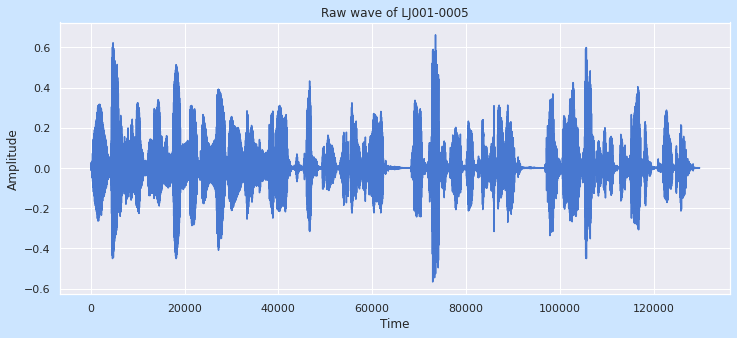

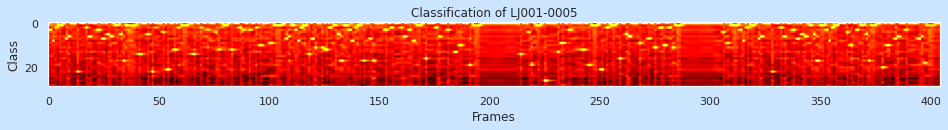



Predict a sequence of tokens tensor([ 0,  3,  8,  2,  0,  1,  1,  0,  7,  6,  0,  0,  0, 22,  0,  0,  0,  2,
         6,  6,  0,  0,  3,  3,  7,  7,  0,  5,  6,  0,  1,  1,  0,  5, 17,  1,
         1,  1,  1,  1,  0, 14, 14,  0,  0,  5,  0, 22,  0,  0,  0,  0,  4,  0,
        21,  0,  0, 12, 12,  2,  1,  1,  1,  1,  0,  0, 14,  0,  0,  2,  0,  0,
         3,  0,  0,  0,  4, 12,  0,  0,  1,  1,  0, 12,  0,  0,  0,  2,  3,  0,
         0,  3,  0,  0,  2,  0, 10,  0,  0,  0,  9,  9,  1,  1,  1,  1,  0,  0,
         7,  6,  1,  1,  3,  8,  2,  2,  1,  1, 14,  0,  7, 11,  0,  0, 11,  0,
        12,  2,  2,  1,  1,  5, 17, 17,  1,  1,  3,  3,  8,  2,  1,  1,  0, 17,
         0,  0,  7, 17,  0,  0,  0,  0,  3,  3,  0,  2,  2,  0,  0,  0,  2,  6,
         6,  3,  3,  8,  0,  1,  1,  0,  0, 16,  0,  0,  0,  0,  2,  6,  0,  0,
         0,  3,  0,  0, 13, 13, 10, 10,  0,  0,  0, 19,  0,  1,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14,  0,
         

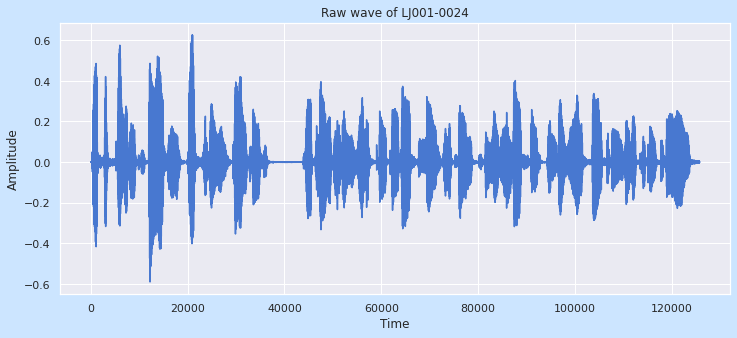

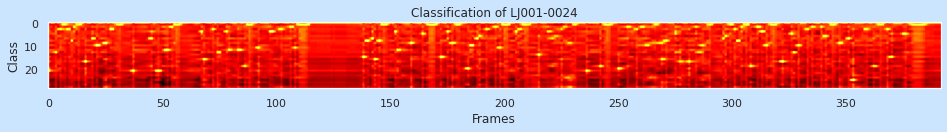



Predict a sequence of tokens tensor([21,  0,  0, 13,  0,  3,  1,  1,  3,  3,  8,  2,  0,  1,  0,  0, 17,  0,
         0,  7,  0, 10, 10,  0,  9,  9,  0,  3,  3,  0,  1,  1,  1,  0,  0,  0,
         0, 21,  0,  0,  0,  0,  0,  0,  7,  7,  0, 21, 21,  0,  0, 12, 12,  0,
         2,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4, 16,  0,  0,  0,
         3,  0, 13, 13,  0,  0,  4, 12,  0,  0,  0, 12, 12,  0, 19,  1,  1,  1,
         0,  0, 11,  0,  0,  0,  0,  4,  4,  0,  0,  0,  3,  0,  0,  0,  2,  2,
        11,  0,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,  8,  8,  0,  7, 16,
         0,  8,  1,  1,  1,  0,  0,  0,  4, 12,  0,  0,  0,  0,  0,  9,  0,  0,
         0,  0,  5,  0,  0,  1,  1,  1,  0,  0, 15,  0,  0,  4,  0,  9,  0,  1,
         1,  0,  0,  0, 20, 10, 10,  0,  7,  6,  0,  0,  3,  0,  0,  0,  2,  0,
        11,  1,  1,  1,  1,  0,  0,  4,  3,  3,  1,  1,  1,  0,  0,  0,  0, 14,
         

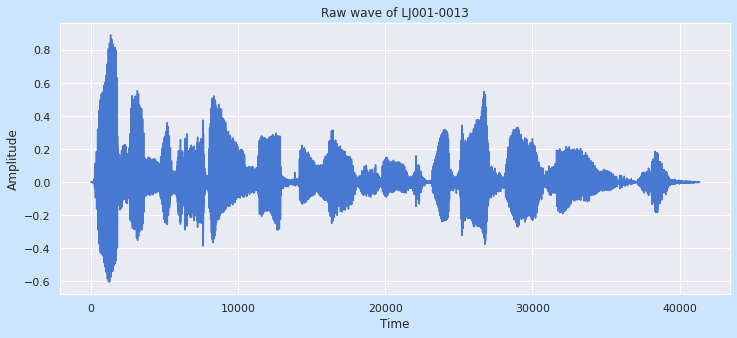

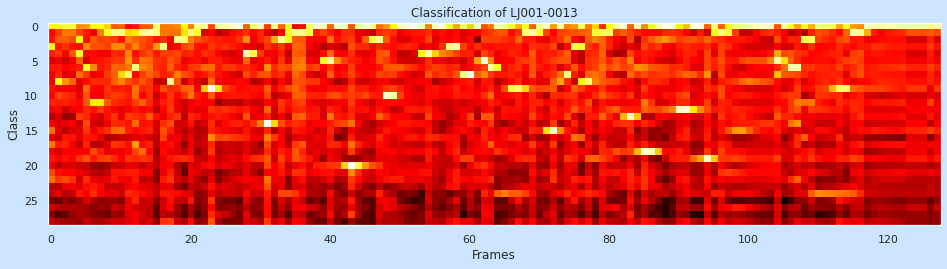



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  4,  6,  0,  0,  1,  1,  1,  7,  6,  1,  1,  1,  3,  8,
         2,  2,  1,  0,  0,  9,  0,  0,  0,  0,  4,  0,  0, 14,  0,  2,  0,  1,
         1,  0,  0,  0,  5,  0,  0, 20,  0,  0,  0,  2, 10, 10,  0,  0,  0,  0,
         4,  0,  0,  3,  3,  7,  7,  0,  5,  6,  0,  0,  9,  9,  1,  1,  0,  0,
        15,  0,  7,  3,  0,  8,  1,  1,  1,  0,  0, 13,  0, 18, 18,  0,  0,  0,
        12, 12,  0,  0, 19,  0,  1,  1,  0,  0,  0,  0,  0,  0,  5,  0,  6,  6,
         2,  2,  0,  0,  0,  9,  9,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0])

Merge repeats  tensor([ 0,  4,  6,  0,  1,  7,  6,  1,  3,  8,  2,  1,  0,  9,  0,  4,  0, 14,
         0,  2,  0,  1,  0,  5,  0, 20,  0,  2, 10,  0,  4,  0,  3,  7,  0,  5,
         6,  0,  9,  1,  0, 15,  0,  7,  3,  0,  8,  1,  0, 13,  0, 18,  0, 12,
         0, 19,  0,  1,  0,  5,  0,  6,  2,  0,  9,  1,  0])

labels ['A', 'N', '|', 'I', 'N', '|', 'T', 'H', 'E', '|', 'S', 'A', 'M', '

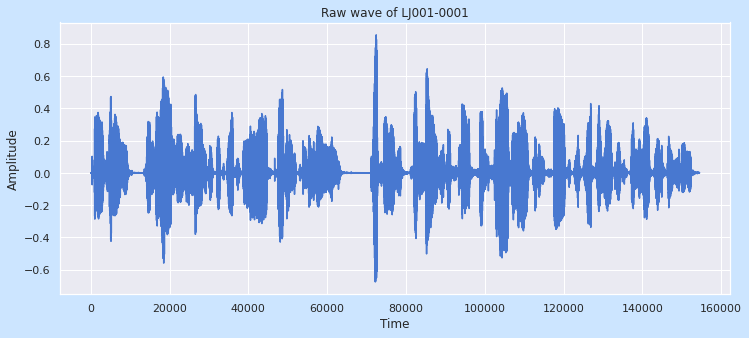

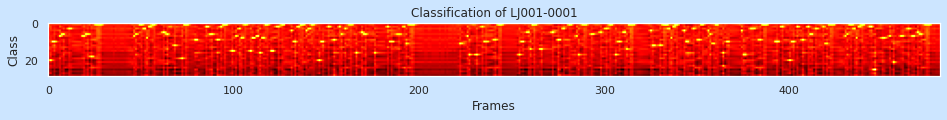



Predict a sequence of tokens tensor([ 0, 20, 10, 10,  0,  0,  7,  6,  6,  0,  0,  3,  3,  0,  0,  0,  0,  0,
         7,  7,  6,  6,  0, 18,  0,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  6,  0,  1,  1,  3,  3,  8,
         2,  2,  1,  1,  0,  0,  0,  0,  5,  0,  6,  0,  0,  0, 12,  0,  0,  0,
        19,  1,  1,  1,  0,  0,  0,  9,  9,  0,  0,  0,  0,  2,  2,  6,  6,  0,
         0,  9,  9,  2,  1,  1,  1,  0,  0, 15,  0,  7,  0,  3,  8,  8,  1,  0,
         0, 15,  8,  8,  7,  7, 16,  8,  8,  1,  1,  0, 15, 15,  0,  0,  2,  0,
         1,  1,  0,  0,  0,  4,  0, 10,  0,  2,  1,  1,  0,  4,  3,  3,  1,  1,
         0,  0, 20, 10, 10,  0,  0,  2,  0,  0,  9,  0,  0,  2,  6,  0,  3,  0,
         1,  1,  0,  0, 16,  0,  0,  5,  6,  6,  0,  0,  0,  0, 16,  0,  0,  0,
         0,  0,  0,  2,  0, 10,  0,  0,  6,  6,  0,  0,  2, 11,  0,  1,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

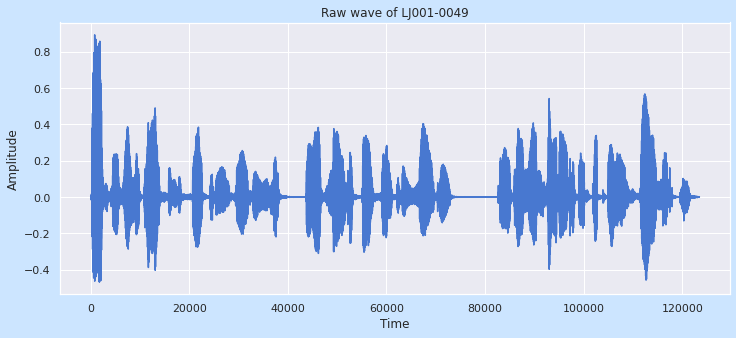

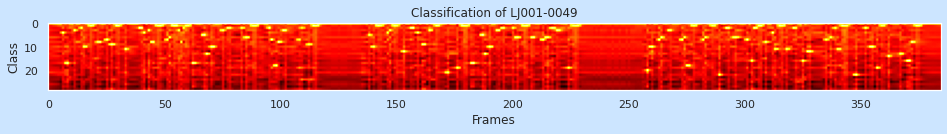



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  4, 17, 17,  0,  0,  3,  0,  0,  2, 10, 10,  0,
         1,  1,  0,  8,  8,  0,  0,  7,  0,  9,  0,  1,  1,  0,  0, 11,  0,  0,
         0,  0,  0,  2,  2,  4,  0,  3,  8,  8,  1,  1,  1,  0,  0,  7,  6,  1,
         1,  1,  3,  8,  2,  1,  1,  0, 17, 17,  0,  0,  5,  5, 13,  0, 10, 10,
         0,  0,  0,  3,  0,  2,  2,  0,  0,  0,  0,  2,  0,  6,  6,  0,  1,  1,
         0,  0,  0,  0,  0,  2,  7, 18, 18,  8,  8,  3,  3,  0,  0,  0,  0,  0,
         7,  2,  0,  0,  9,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5,  0, 10,  0,  1,  1,
         0,  0,  4,  3,  0,  1,  1,  0,  0, 12,  0,  0,  2,  2,  0,  4,  0,  9,
         9,  0,  3,  0,  0,  1,  1,  0,  0,  0, 21,  0,  0,  0, 19,  0,  1,  1,
         1,  0, 17, 17,  0,  0,  0,  5, 13,  0, 10,  0,  0,  3,  3,  2,  2,  0,
         0,  0,  2,  6,  6,  0,  1,  1,  1,  0,  6,  6,  0,  0,  0,  7,  6,  6,
         

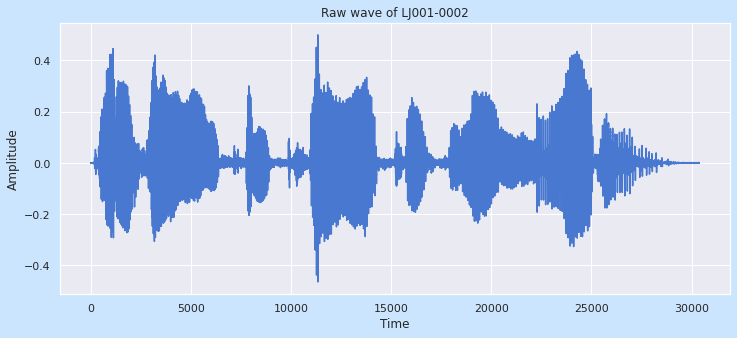

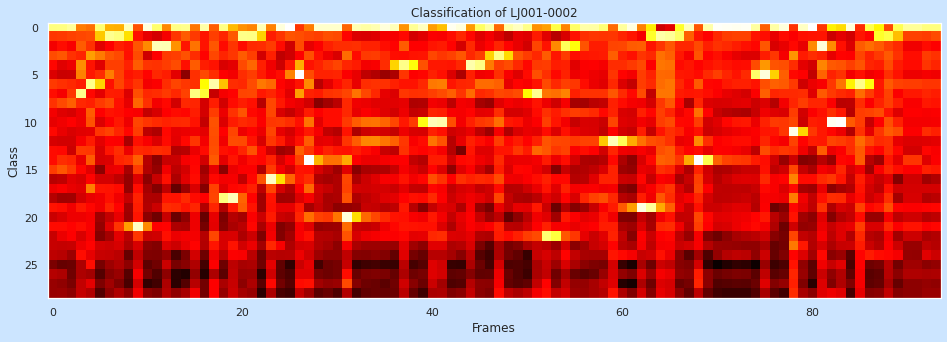



Predict a sequence of tokens tensor([ 0,  0,  0,  7,  6,  0,  1,  1,  0, 21,  0,  2,  2,  0,  0,  7,  0,  6,
         0, 18,  1,  1,  0, 16,  0,  0,  5, 14,  0,  0,  0, 20,  0,  0,  0,  0,
         0,  4,  0,  0, 10, 10,  0,  0,  4,  4,  0,  3,  0,  0,  0,  7, 22,  0,
         2,  0,  0,  0,  0, 12,  0,  0, 19, 19,  1,  1,  1,  0, 14,  0,  0,  0,
         0,  0,  0,  5,  0,  0, 11,  0,  0,  2, 10, 10,  0,  6,  0,  1,  1,  0,
         0,  0,  0,  0])

Merge repeats  tensor([ 0,  7,  6,  0,  1,  0, 21,  0,  2,  0,  7,  0,  6,  0, 18,  1,  0, 16,
         0,  5, 14,  0, 20,  0,  4,  0, 10,  0,  4,  0,  3,  0,  7, 22,  0,  2,
         0, 12,  0, 19,  1,  0, 14,  0,  5,  0, 11,  0,  2, 10,  0,  6,  0,  1,
         0])

labels ['I', 'N', '|', 'B', 'E', 'I', 'N', 'G', '|', 'C', 'O', 'M', 'P', 'A', 'R', 'A', 'T', 'I', 'V', 'E', 'L', 'Y', '|', 'M', 'O', 'D', 'E', 'R', 'N', '|']

Transcript: IN|BEING|COMPARATIVELY|MODERN|



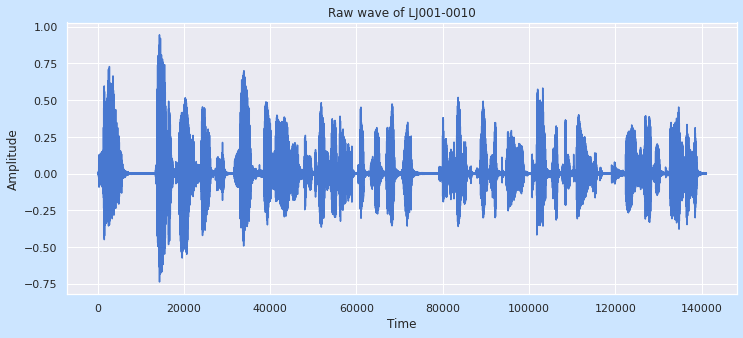

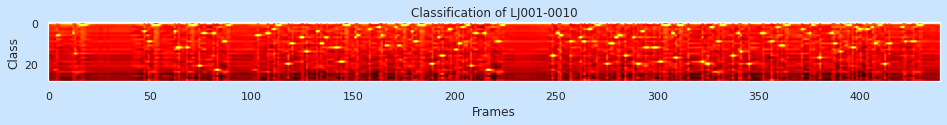



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  6,  6,  0,  0,  0,  0,  0,  0,  5, 15,  0,  1,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  0,  9,  9,  1,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  4, 12, 12,  0,  0,  0, 12,  0,  1,  1,
         1,  0, 21,  0,  5,  5,  0,  0,  0,  5,  0, 23,  0,  0,  9,  9,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  6,  0,  0,  0,  0,
         5,  0,  0,  3,  0,  1,  1,  0,  0,  0, 20, 10, 10,  0,  0,  0,  7,  7,
         0, 14,  0,  0,  0,  0,  4,  0, 10, 10,  0,  7,  0,  0,  0, 12, 12,  0,
        19, 19,  1,  1,  1,  0,  0,  7,  6,  0,  0,  0,  0,  0,  3,  0,  0,  0,
         2,  2,  6,  0, 11,  0,  0,  0,  0,  2, 11, 11,  1,  1,  1,  0,  0,  4,
         9,  9,  1,  1,  1,  1,  0,  0,  0, 20,  0,  0,  7, 16, 16,  0,  0,  3,
         3,  0,  0, 13, 10, 10,  2,  0,  1,  1, 21,  0,  5,  5,  0,  0,  0,  5,
        2

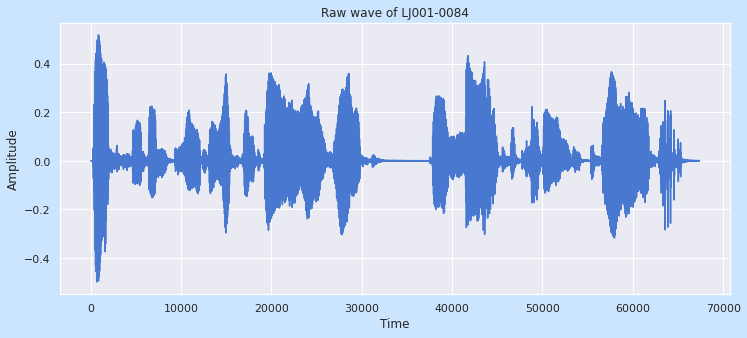

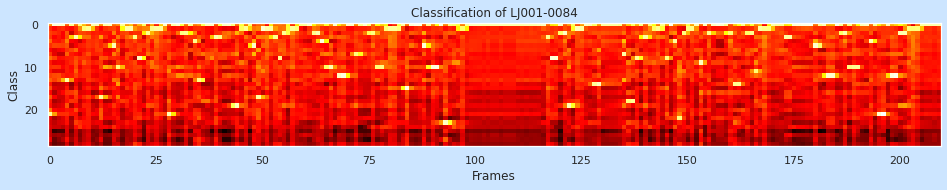



Predict a sequence of tokens tensor([21,  0,  0,  0, 13,  0,  3,  0,  1,  1,  0,  0, 17,  0,  0,  5, 10,  0,
         1,  1,  3,  8,  0,  2,  1,  1,  1,  0, 21,  0,  0,  2,  2,  0,  4, 13,
         0,  0,  0,  3,  3,  0,  0,  0, 19,  1,  1,  0,  5, 17,  1,  1,  1,  3,
         8,  2,  2,  1,  1,  0,  0,  0,  2,  2,  4, 10, 10,  0, 12, 12,  0,  0,
         7,  0,  0,  0,  2, 10, 10,  1,  1,  1,  1,  0, 15,  0,  0,  0,  5,  0,
        10, 10,  0, 23,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  8,  8,  0,  2, 19,  0,  1,  1,
         0,  0, 14, 14,  0,  0,  0,  0,  0,  7, 18, 18,  8,  0,  3,  0,  1,  1,
         0,  8,  0,  4, 22,  2,  1,  1,  0,  9,  0,  2,  0,  0,  0,  0,  2, 14,
        14,  0,  2,  2, 11,  1,  1,  1,  0,  0,  0,  3,  3,  0,  0,  0,  0,  0,
         5,  0,  0, 12, 12,  0,  0,  2, 10, 10, 10,  0,  0,  4,  0, 21, 21,  0,
        12, 12,  2,  2,  1,  1,  1,  0,  0,  0,  0,  0])

Merge repeats  tensor([21,  0, 

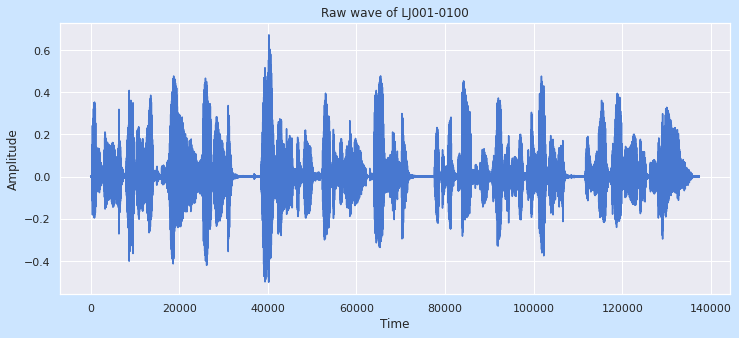

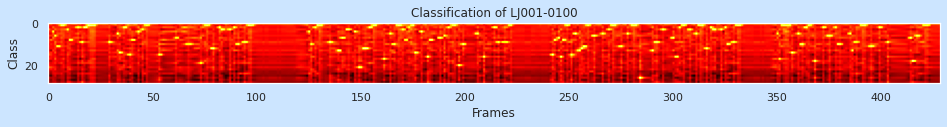



Predict a sequence of tokens tensor([ 0,  0,  4,  6, 11, 11,  1,  1,  0,  3,  8,  8,  0,  0,  2,  0,  9,  2,
         2,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  9,  0,  0,  0,  5, 14,  0,
         2,  2,  0, 15,  8,  8,  0,  4,  0,  3,  0,  1,  0,  0,  0,  0,  0, 15,
         0,  0,  0,  0,  0,  0,  0,  7,  0,  0,  0,  0, 10, 10, 10,  0,  0,  0,
         0, 19,  0,  1,  1,  0, 12, 12,  0,  0,  2,  3,  3,  0,  0,  3,  0,  2,
        10, 10,  0,  0,  9,  9,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,
        10,  0,  2,  1,  1,  1,  0,  0,  0,  9,  0,  0,  0, 13, 13,  7,  7,  3,
         3,  0,  0,  4,  0, 21, 21, 12, 12, 12,  2,  2,  1,  1,  0,  0,  0, 17,
         0,  0,  5, 10, 10,  0,  1,  1,  3,  8,  8,  2,  1,  1, 14,  0,  0,  4,
         0,  0, 16,  8,  8,  0,  0,  7,  7,  0,  6,  0,  2,  0,  1,  1,  0, 20,
         0, 10,  0,  0,  0,  0,  0,  0,  5,  0,  0, 16,  0,  0,  0,  0,  2,  2,
         

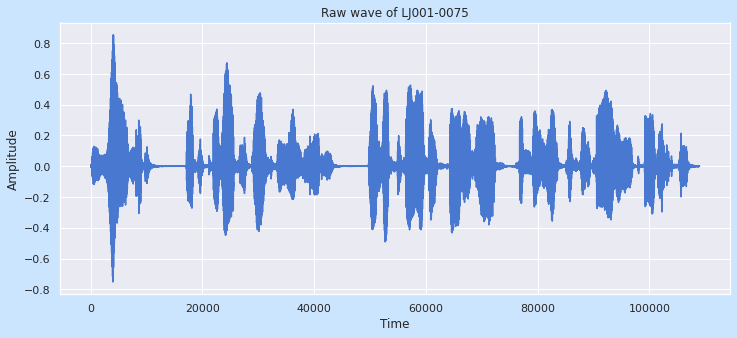

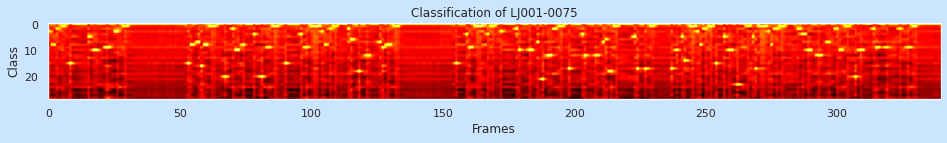



Predict a sequence of tokens tensor([ 3,  8,  8,  2,  0,  1,  1,  0, 15,  0,  0,  0,  0,  0,  0,  5,  0, 10,
        10,  0,  0,  0,  9,  9,  0,  3,  3,  0,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,
         8,  0,  7,  7, 16,  8,  8,  1,  1,  1,  0,  0,  0, 20,  0,  0,  2, 10,
        10,  0,  8,  0,  0,  0,  4,  0,  0, 20,  0,  9,  9,  1,  1,  1,  0,  0,
        15,  0,  0,  0,  0,  0,  4,  0,  9,  0,  1,  1,  1,  1,  3,  8,  0,  2,
         1,  1,  0,  0,  0,  0,  2,  6,  0,  0, 18,  0,  0, 12, 12,  0,  0,  0,
         7,  9,  0,  8,  8,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,  0,  0,  0,  4,  9,  9,
         1,  1,  1,  1,  0,  4,  1,  1,  0,  0,  3,  0,  0,  0,  0,  0,  2, 10,
         0,  0,  0, 10,  0,  0,  7,  0, 21,  0, 12, 12,  2,  2,  1,  1,  0,  0,
        17,  0,  0,  0,  0,  4, 12,  0,  0,  0, 12, 12,  0,  7,  6, 18, 18,  1,
         

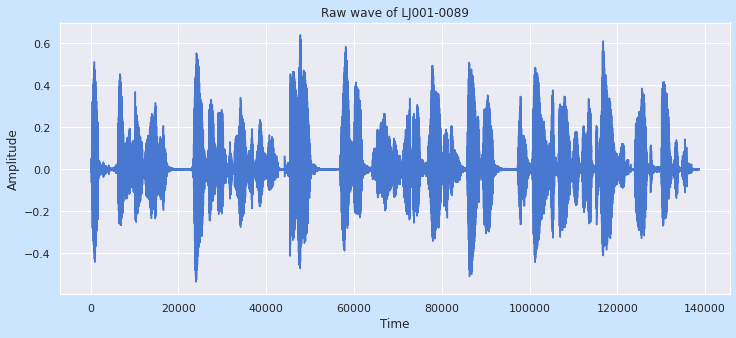

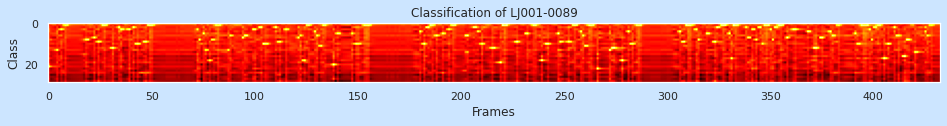



Predict a sequence of tokens tensor([21,  0,  0,  0, 13,  0,  3,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,
         8,  8,  0,  0,  7,  0,  9,  0,  1,  1,  0,  0,  0, 12,  0,  0,  2,  3,
         0,  0,  0,  3,  0,  2,  0, 10,  0,  0,  9,  9,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         3,  8,  0,  5, 13,  0, 18,  8,  8,  1,  1,  1,  0,  0,  0, 13,  6,  0,
         0,  0,  0,  0,  7,  6,  6,  0,  0,  3,  3,  0,  2,  2, 10, 10, 10,  0,
         0,  0,  2,  9,  9,  0,  0,  3,  0,  0,  0,  0,  0,  7,  6,  0, 18,  1,
         1,  0,  0,  4,  6,  0, 11,  1,  1,  0,  0,  0, 20,  0,  5,  5,  0,  0,
         0,  0,  0,  5,  0, 10, 10, 10,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         4,  0, 10,  2,  2,  1,  1,  0,  6,  0,  0,  5,  0,  0,  3,  1,  1,  1,
         0,  0,  0,  0,  6,  6,  0,  0,  2,  2,  4,  0, 10,  0,  0,  0,  0, 12,
        1

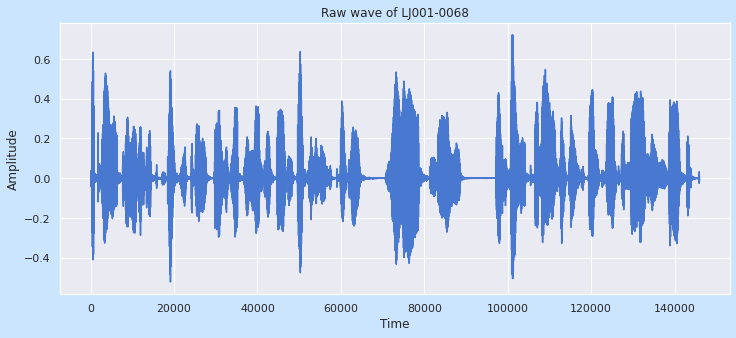

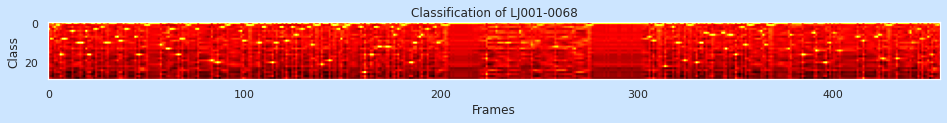



Predict a sequence of tokens tensor([ 3,  8,  0,  2,  1,  1, 16,  8,  8,  0,  0,  0,  4,  0,  0, 10, 10, 10,
         0,  4, 16, 16,  0,  0,  3,  0,  0,  2,  0, 10, 10,  0,  0,  0,  0,  7,
         9,  9,  0,  3,  3,  0,  0,  0,  7,  0, 16,  0,  0,  1,  1,  1,  0,  0,
         0,  0,  0, 11,  0,  0, 13, 13,  3,  3,  0,  0, 16,  8,  8,  0,  0,  1,
         0,  0,  0,  0,  3,  0,  0,  0,  0,  0,  0, 19,  0,  0, 20,  0,  2,  2,
         0,  1,  0,  0,  0,  0,  0,  0,  4,  9,  9,  1,  1,  1,  0,  0,  0, 10,
         0,  2,  2,  0,  0,  0, 20,  0, 10,  0,  0,  2,  0,  9,  0,  0,  2,  0,
         6,  0,  0,  3,  0,  0,  2,  2, 11,  0,  1,  1,  0, 21,  0,  0,  0, 19,
         0,  1,  1,  1,  3,  8,  2,  2,  1,  1,  0,  0,  0,  0,  0,  2,  0, 25,
         0,  0, 16, 16,  2,  2, 12, 12,  0,  0, 12, 12,  0,  2,  6,  0,  3,  0,
         1,  1,  0,  0, 20, 20, 10, 10,  0,  7,  6,  0,  0,  3,  0,  0,  0,  2,
        10, 10,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

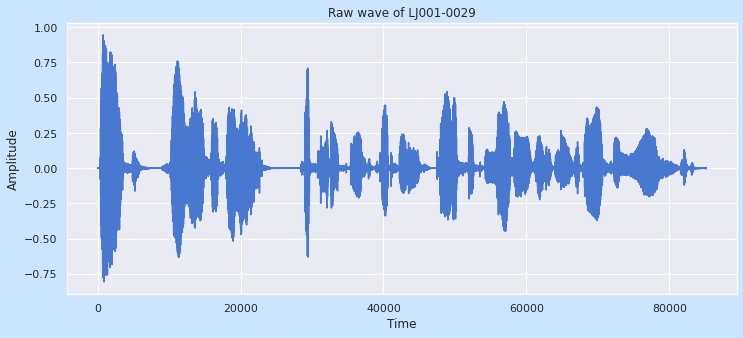

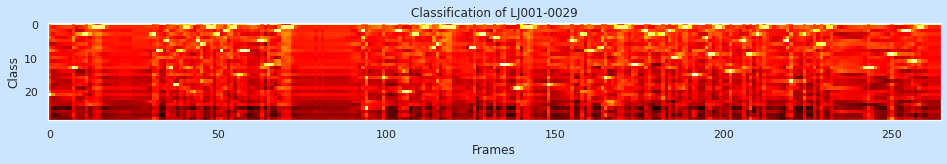



Predict a sequence of tokens tensor([21,  0,  0,  0,  0,  0,  0, 13,  0,  0,  3,  3,  0,  1,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  0,  5,
        13, 18, 18,  8,  1,  1,  0,  0,  5,  6,  0,  1,  1,  0,  3,  8,  2,  0,
         1,  1, 15,  8,  8,  0,  0,  0,  0,  5,  0, 12,  0,  2,  2,  1,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  2, 25,  0,  0,  0,  0, 16,  0,  0,  0,  2,  2, 20, 20,  0,
         3,  3,  0,  1,  1,  0,  7,  6,  0,  1,  1,  1,  1,  0,  0,  0,  0,  7,
         7,  0,  3,  3,  0,  0,  4,  0, 12, 12, 12,  0,  0, 19,  0,  1,  1,  1,
         0,  0,  0,  0, 18,  0,  0,  0,  0,  0,  0,  5,  0,  0,  3,  3,  8,  8,
         0,  0,  7, 16,  0,  0,  1,  1,  1,  1,  0, 12, 12,  0,  0,  2,  3,  0,
         0,  0,  3,  0,  2, 10, 10,  0,  1,  1,  0, 15, 15,  0,  0,  4,  9,  9,
         1,  1,  0,  0, 14,  0,  0,  0,  5,  9,  9,  0,  3,  0,  1,  1,  0,  0,
         

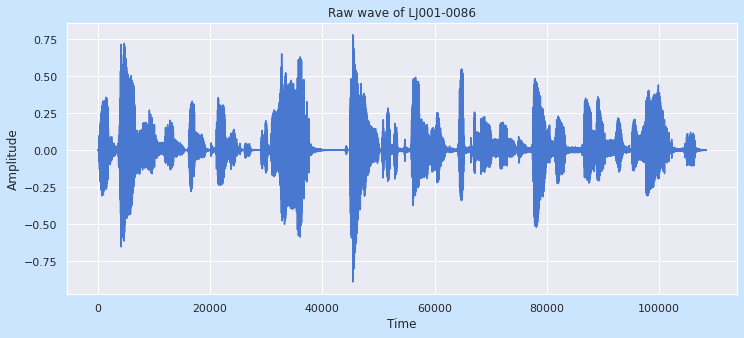

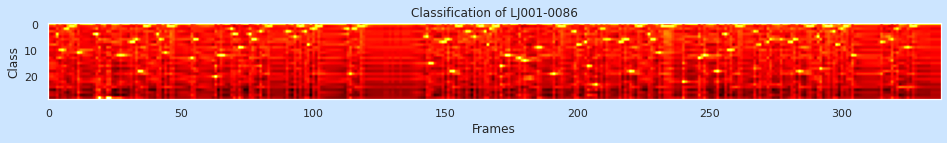



Predict a sequence of tokens tensor([ 0,  0,  0,  4, 10, 10,  2,  2,  1,  1,  0, 11,  0,  0,  0,  0,  0,  4,
         4, 28,  0,  0, 28, 28,  0,  0,  0, 12,  0,  0,  0,  7,  7,  6, 18, 18,
         1,  1,  0,  0,  0,  4,  6,  0, 11,  1,  1,  1,  0,  0,  0,  0,  0,  0,
        13,  6,  6,  0,  0,  0,  0,  0,  0, 20,  0, 12, 12,  0,  0,  2,  4,  4,
         9,  9,  0,  0,  4,  6,  6,  0,  3,  0,  0,  1,  0,  0,  0,  0,  0,  0,
         3,  3,  0,  5,  0,  1,  0,  3,  8,  0,  2,  1,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  2, 19,  2,  2,  1,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5,
        15, 15,  0,  0,  0,  7,  0,  6, 18, 18,  1,  1,  1,  0,  3,  3,  0,  5,
         0,  1,  1,  3,  8,  2,  1,  1,  1, 16,  0, 12, 12,  0,  0,  0, 13,  0,
        14,  0,  0,  0,  0,  9,  9,  0,  0,  0,  0, 19,  0,  1,  1,  1,  0,  0,
         0,  3,  8,  0,  0,  7, 16,  0,  0, 23,  0,  2,  0,  6,  6,  0,  0,  0,
         

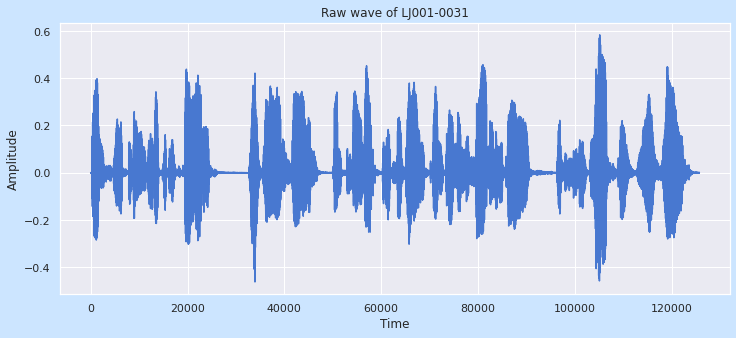

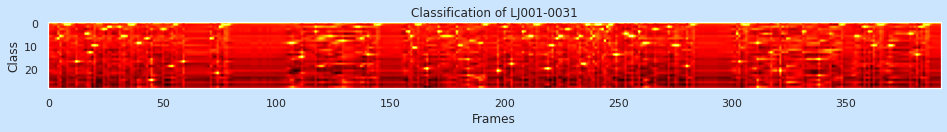



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  7,  6,  0,  1,  1,  1,  0,  0, 17,  0,  0,  0,  5,  5,
        13,  0, 10,  0,  0,  0,  3,  0,  2,  2,  0,  0,  0,  2,  6,  6,  0,  0,
         1,  1,  0,  9,  9,  0,  0,  7,  0, 25,  0,  0,  0,  0,  3,  0,  0,  0,
        19,  1,  1,  0,  0, 17,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,
         0,  0, 22,  2,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  9,  9,
         0,  0,  0, 15,  0,  0,  0,  0,  0,  4,  0,  0, 19,  0,  0,  6,  6,  0,
         0,  0,  0,  8,  0,  0,  0,  0,  0,  2,  2,  7,  0,  0, 14,  0,  0,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  6, 11, 11,
         1,  0,  0,  0, 20,  0,  0,  0,  0,  4,  0,  0,  6,  6,  6,  0,  0,  4,
        10, 10,  0,  0, 16,  8,  8,  0,  0,  9,  9,  1,  1,  0,  0,  0,  0, 21,
         0,  0,  2,  0,  0, 18,  0,  0,  0,  0,  4,  0,  0,  6,  6,  0,  1,  1,
         

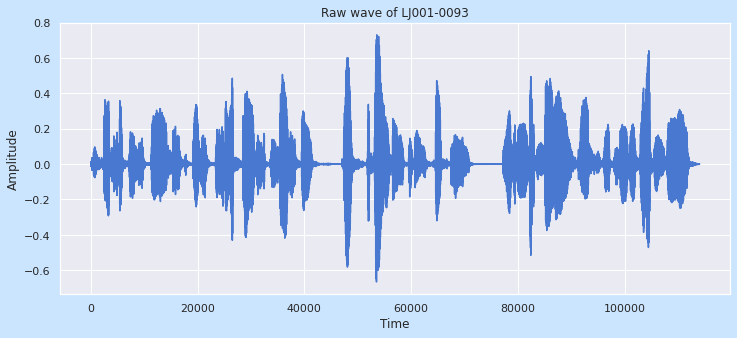

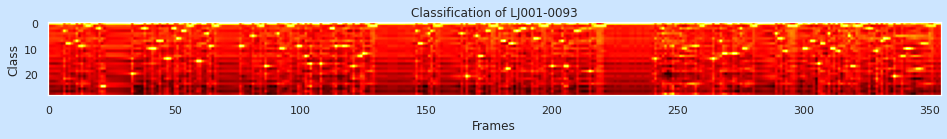



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  3,  8,  8,  0,  0,  7,  0,  9,  0,  1,  1,  0,
         0,  0,  2, 25, 25,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0,
         0,  0,  2,  0,  0, 10, 10,  0,  7,  0,  0, 14,  0,  0,  2,  6,  0,  3,
         3,  0,  1,  0,  0, 15, 15,  0,  0,  4,  9,  0,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  9,  9,  0,  0,  0,  5,  0,  0,  1,  1, 17,  0,  0,  0,
         0,  4, 10, 10,  0,  1,  1,  0,  0,  9,  9,  0, 13,  0, 16,  0,  0,  0,
        16,  0,  0,  0,  2,  2,  9,  0,  0,  9,  9,  0,  0, 17,  0,  0, 13, 12,
         0,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  3,  8,  8,  0,  0,  4,  3,  0,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  4,  0, 21,  0,  0,  0,  5, 13, 13,  0,  3,  3,  1,  1,  1,  2,
         7,  7, 18,  8,  8,  0,  3,  0,  2,  2,  0,  0,  2,  6,  6,  0,  1,  1,
         1,  0, 17,  0,  0,  0,  7, 17, 17,  0,  0,  0,  3,  0,  0,  0,  0, 19,
         

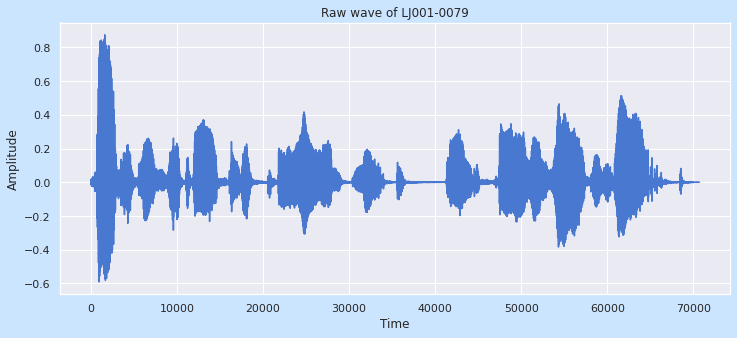

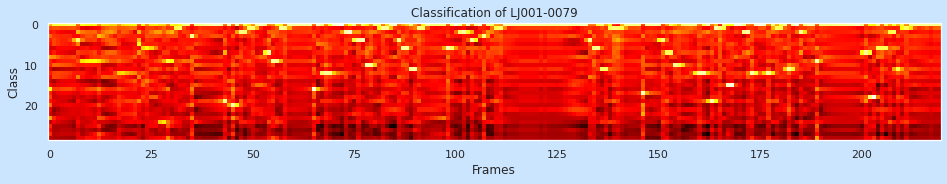



Predict a sequence of tokens tensor([16,  0,  0,  0,  0,  0,  0,  4,  0,  9,  9,  9,  9,  0,  0,  0,  0, 12,
         0,  0,  0,  0,  5,  0,  6,  0,  0,  0, 24,  9,  0,  1,  1,  0,  0,  3,
         0,  0,  0,  0,  0,  0,  0, 19,  0, 20,  0,  2,  2,  1,  1,  0,  0,  0,
         7,  9,  9,  1,  1,  0,  0,  0,  0,  0,  0, 16,  0,  0, 12, 12,  0,  0,
         0,  2,  2,  0,  4,  4, 10, 10,  0,  0,  1,  1,  0,  0,  4,  6,  6, 11,
        11,  1,  1,  0,  0,  0,  0,  0,  6,  0,  0,  0,  2,  0,  4,  0,  0,  3,
         0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  4,  6,  6,  0, 11,  1,  1,  1,  1,  0,  0,
         0,  0, 17,  0,  0,  0,  0,  4,  7,  7, 10, 10,  0,  0,  0,  0, 12, 12,
         0, 19,  1,  1,  0, 15, 15,  0,  0,  2,  2, 12,  0,  0,  0, 12,  0,  1,
         1,  0, 11,  0,  0,  2,  0,  0,  0,  9,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  7, 18, 18,  0,  6,  6,  2,  2, 11,  0,  1,  0,  0,  0,  0,
         

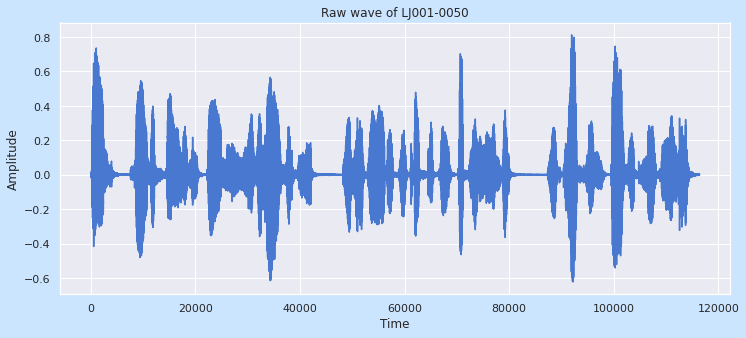

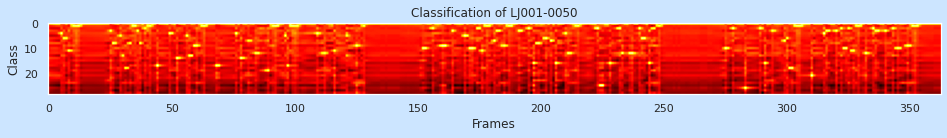



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  4,  6,  0, 11,  0,  1,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  0,  5, 13, 18,  0,  8,  1,  1,
         3,  8,  0,  2,  1,  1,  0,  0, 17,  0,  0,  0,  0,  4,  0,  0, 14,  0,
         0,  0,  5, 13, 13,  9,  9,  0,  1,  1,  0,  0,  0,  0, 17, 17,  0,  0,
         0,  0,  0,  0,  4,  0, 14,  0,  0,  7,  0,  0, 12, 12,  0,  0,  0, 19,
         0,  1,  1,  1,  0,  0,  5, 17,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  4,  0,  0, 12,  0,  0,  0, 11,  0,  0,  0,  0,  5,  0,  0,  0,  9,
         0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0, 10, 10,  0,  0,  2,  0,  0,  9,  9,  9,
         0,  0,  3,  0,  0,  0,  0,  5,  0, 10, 10,  0,  2,  2, 11,  1,  1,  1,
         0,  7,  3,  3,  0,  9,  0,  1,  1,  0,  0,  3,  3,  0,  0,  2,  0, 16,
         8,  8,  0,  0,  6,  0,  7,  0, 16,  0,  0,  0,  4, 12, 12,  0,  1,  1,
         

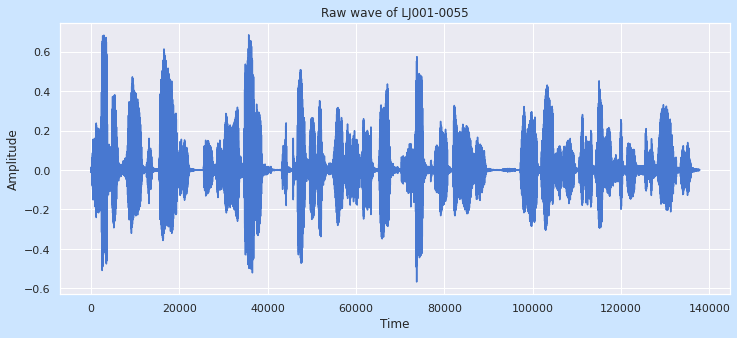

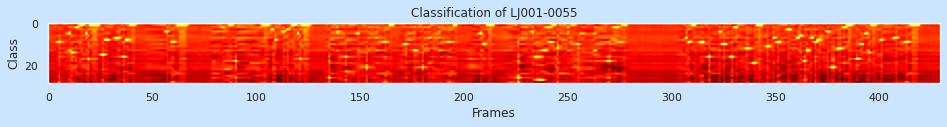



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  9,  0,  0,  0,  0,  5, 14,  0,  2,  0,  1,  1,  0,
         5, 17,  1,  1,  1,  1,  0,  0, 15,  8,  8,  0,  0,  0,  0,  7,  7,  0,
        16,  8,  8,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  4,  0,  9,  9,  0,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2,  0,  0,  1,  1,  0,
        18,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  0,  0,
         3,  8,  0,  0,  0,  4,  0,  3,  0,  1,  1,  1,  5, 17,  1,  1,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  0,  0, 26,  0,  0,  0,  4,  0,  0,  0, 16,
         0,  0,  0,  0,  0,  5,  0,  0,  0, 21,  0,  0,  0,  0,  7,  0,  0,  9,
         9,  0,  1,  1,  0,  0,  0,  0,  0, 10, 10,  0,  0,  0, 13, 13,  0,  0,
        21,  0,  0,  7,  0,  0,  0,  0, 13,  0,  0,  0,  9,  9,  0,  1,  1,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5, 10, 10,  1,  1,  1,  0,  0,
         

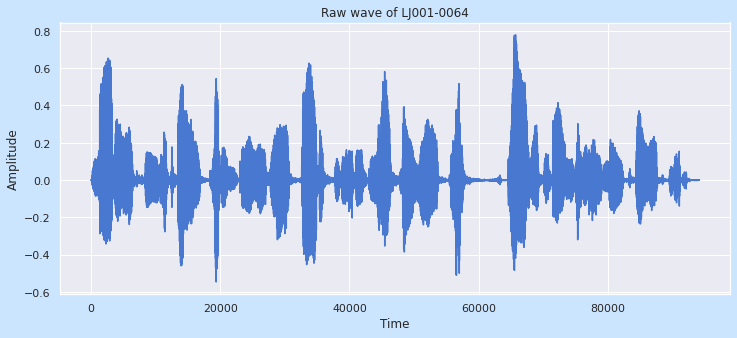

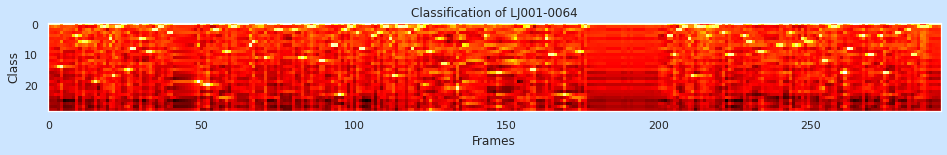



Predict a sequence of tokens tensor([ 0,  0,  0,  0, 14,  0,  0,  0,  0,  4,  0,  6,  6,  0,  0, 19,  0,  1,
         1,  1,  5, 17,  1,  1,  0,  0, 15,  8,  8,  0,  5,  0,  9,  9,  2,  2,
         1,  1,  0,  3,  3,  0,  0,  0,  0,  0,  0,  0,  0, 19,  0, 20, 20,  0,
         2,  2,  0,  0,  9,  0,  1,  1,  0,  0,  0,  0,  7,  6,  0,  0,  0, 11,
         0,  0,  0,  2,  0,  0,  0,  0,  2,  0,  0, 11,  0,  1,  1,  1,  0, 12,
        12,  0,  0,  7,  7, 23,  0,  2,  1,  1,  0,  3,  8,  8,  0,  0,  4,  0,
         3,  0,  1,  1,  5, 17,  1,  1,  1,  1,  3,  8,  2,  1,  1,  0,  9,  9,
         0,  0,  5, 13, 13,  0,  0,  0, 21,  0,  7,  0,  0,  0,  0,  0,  0,  4,
         0,  0,  0, 16, 16,  0,  0,  0,  0,  5,  0,  0,  1,  1, 15, 15,  0,  0,
         0,  5, 10, 10,  0,  0,  0, 23,  0,  0,  0,  0,  9,  0,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  4,  4, 10,  2,  2,  1,  1,  5, 17,  1,  1,  1,  1,
         

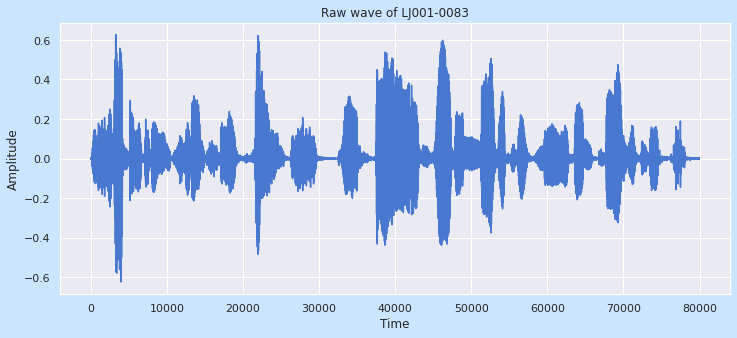

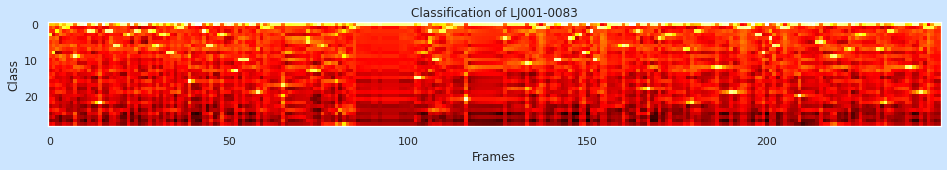



Predict a sequence of tokens tensor([ 3,  8,  2,  0,  1,  0,  0,  9,  0,  0,  0,  2,  2,  0, 22,  0,  2,  2,
         6,  6,  0,  0,  3,  0,  2,  0,  0,  0,  2,  0,  6,  0,  3,  8,  8,  0,
         1,  1,  0, 16,  0,  0,  0,  2,  6,  6,  0,  0,  3,  0,  0,  0, 13, 10,
        10, 10,  0,  0, 19,  0,  1,  1,  0,  0,  0, 17,  0,  0,  0,  0,  0,  0,
         5, 13,  0,  0,  6,  0,  0,  0,  3,  0,  9,  0,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15, 15,  0,  0,  2, 10,
        10,  2,  2,  1,  1,  0,  0,  0, 21,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  4,  0,  0,  0,  0,  0, 11,  0,  0,  1,  1,  1,  0,  0, 10, 10,  0,
         0,  4,  0,  0,  3,  8,  0,  2, 10,  1,  1,  1,  0,  0,  0,  0,  6,  0,
         0,  0,  2,  0,  0, 18,  0,  0,  4,  0,  3,  3,  0,  0,  0,  7,  0, 22,
         2,  2,  0,  0,  0,  0, 12,  0,  0,  0, 19, 19,  1,  1,  1,  1,  0,  3,
         3,  8,  0,  4,  6,  0,  1,  1,  1,  0,  0, 20,  0,  0,  0,  0,  0,  5,
         

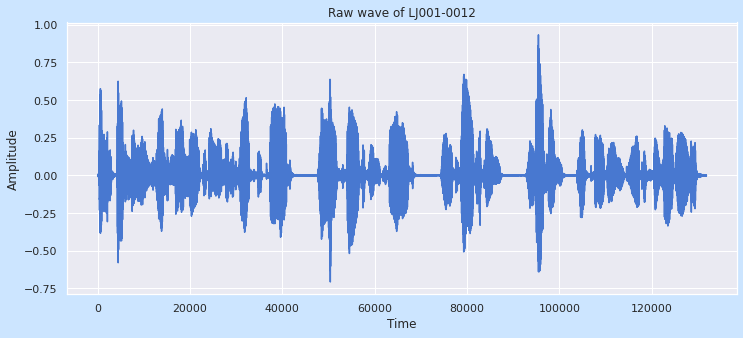

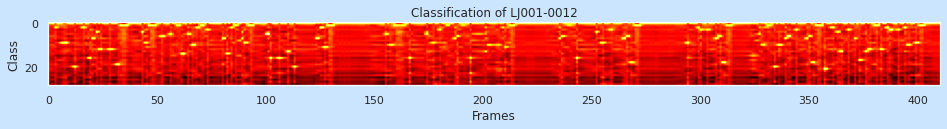



Predict a sequence of tokens tensor([ 0,  0,  0,  2,  0,  0,  9,  9,  9,  0,  0,  0, 20,  0,  0,  0,  2,  0,
         0, 16,  7,  0,  4, 12, 12,  0,  0,  0, 12,  0,  0,  0, 19,  1,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  4,  9,  9,  1,  1,  1,  1,  0,  0,  6,  0,
         0,  0,  5,  0,  0,  1,  1, 14, 14,  0,  5,  0, 10, 10,  2,  2,  1,  1,
         0,  3,  0,  0,  0,  0,  0,  0,  7,  7, 14,  0,  2,  0,  1,  0,  0,  7,
         9,  9,  1,  1,  1,  0,  0,  0,  0,  0,  5,  5, 16,  0,  0,  0, 16,  0,
         0,  0, 13,  0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  7,  2,
         2, 11,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5,  0, 10, 10,  1,  1,  1,
         1,  1,  0,  0, 16,  0,  0,  0,  0,  0,  0,  0,  5,  0,  0,  9,  0,  0,
         3,  0,  0,  1,  1,  0,  0,  7,  6,  0,  0,  0,  0,  0, 16,  0,  0,  0,
         0,  0,  0, 13, 10, 10,  0,  0,  0, 10,  0,  2, 11,  0,  1,  1,  1,  0,
         

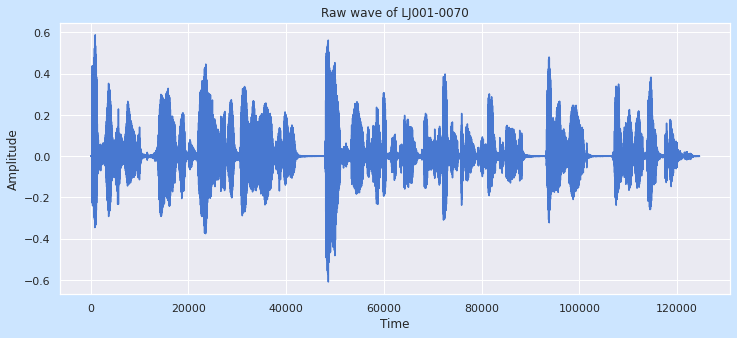

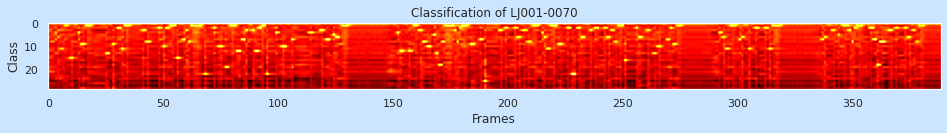



Predict a sequence of tokens tensor([ 0,  0,  0,  4,  6,  0, 11,  1,  0,  0, 15,  0,  0,  4,  9,  9,  0,  1,
         1,  0,  0,  0,  0,  0,  0, 13,  0,  0,  9,  0,  2,  2, 11,  1,  1,  1,
         0,  0,  0,  0,  0,  3,  0,  8,  0,  0,  0,  0,  2,  0, 10,  2,  2,  1,
         1,  0, 15,  0,  0,  7,  3,  8,  1,  1,  1,  1,  1,  0, 22,  0,  0,  0,
         2,  0, 10, 10,  0, 19, 19,  1,  1,  1, 12, 12,  0,  7,  3,  0,  0,  3,
        12, 12,  2,  1,  0, 22,  0,  0,  0,  4,  0,  0, 10, 10,  0,  0,  7,  0,
         0,  0,  0,  0,  0,  0,  4,  0,  0,  0,  0,  3,  0,  7,  7,  0,  5,  6,
         6,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  4, 12, 12,  0,  0, 12,  0,  1,  1,  0,
         3,  8,  8, 10, 10,  0,  5, 13, 18, 18,  8,  1,  1,  1,  1,  3,  8,  2,
         1,  1,  1,  0,  9,  9,  0,  0,  7,  0, 25,  0,  0,  0,  0,  0,  3,  3,
         0,  2,  0,  0,  0,  2,  6,  6,  0,  3,  3,  8,  0,  1,  1,  1,  0,  4,
         

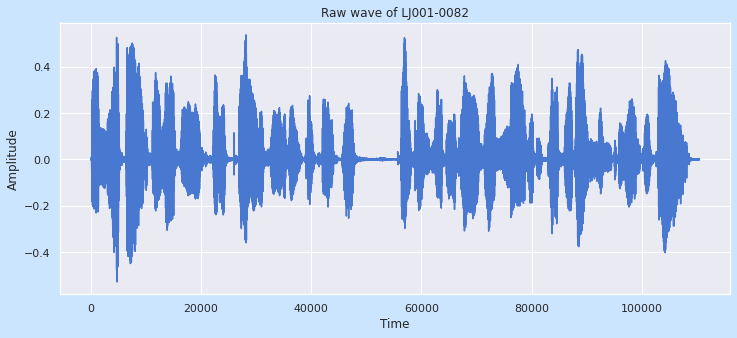

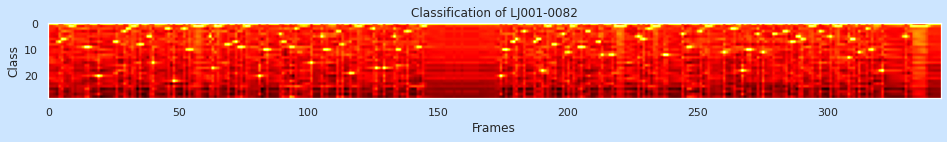



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  7,  6,  6,  0,  1,  1,  0,  0,  0,  0,  9,  9,  0,  0,
         0, 20,  0,  0,  0,  0,  0,  7,  7,  0,  0,  3,  2,  2,  1,  1,  0,  8,
         0,  0,  5,  5, 15,  0,  0,  0,  0,  2,  2,  0, 22,  0,  0,  0,  2,  0,
        10, 10,  1,  1,  1,  1,  0,  0,  5, 17,  1,  1,  1,  0,  8,  8,  0,  0,
         7,  9,  9,  0,  1,  1,  0,  0,  0, 20,  0, 10, 10,  0,  0,  0,  0,  4,
         7,  0,  0,  9,  9,  2,  0,  0,  0,  0,  0, 15,  0,  0,  0,  5, 10, 10,
         0,  0,  0,  3,  3,  8,  0,  0, 19, 19,  0,  1,  1,  0,  0,  0,  0,  2,
        17,  0,  0, 17,  0,  0,  0,  5, 10, 10,  0,  0,  3,  0,  0,  0,  9,  9,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20, 10, 10,  0,  0,  7,
         6,  0,  0,  3,  0,  0,  0,  7,  6,  6, 18,  0,  1,  1,  8,  8,  0,  0,
         4,  0, 11,  1,  1,  0,  9,  9,  0,  3,  3,  0,  0,  0,  7, 12,  0,  0,
         

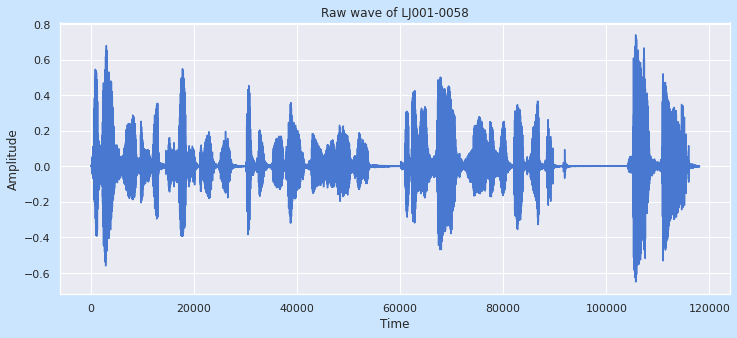

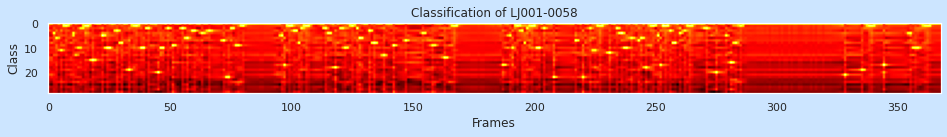



Predict a sequence of tokens tensor([ 0,  0,  4,  6,  0, 11,  1,  1,  0,  0,  4,  0, 10,  2,  2,  1,  1,  0,
        15,  0,  0,  0,  5,  0, 10, 10,  0,  0,  3,  8,  8,  0,  0, 19,  0,  1,
         1,  0, 10, 10,  0,  2,  0,  0,  0, 20, 10, 10,  0,  2,  0,  9,  0,  0,
         0,  2,  6,  6,  0,  3,  3,  0,  0,  4,  0,  0,  3,  0,  0,  0,  0,  0,
         7, 22, 22,  2,  2,  9,  9,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  5, 17,  0,  1,  1,  3,  3,  8,  2,  1,  1,  1,
         0,  0,  0,  0,  0,  0,  2,  4,  4,  0, 18,  0,  2,  2, 10, 10,  0,  1,
         0,  2,  6,  6,  0,  0,  3,  8,  8,  0,  0,  0, 13,  0,  0,  0,  9,  0,
         0,  0,  0,  7,  0,  0,  0,  0,  0,  0,  4,  4,  0,  0,  9,  9,  0,  0,
         0, 14, 14,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0, 17,  0,  0,  5, 10,  0,  1,  1,  3,  8,  2,
         1,  1,  1, 10, 10,  0,  2,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,
         

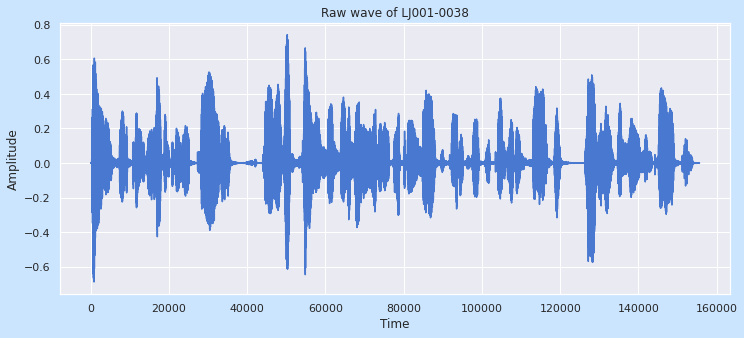

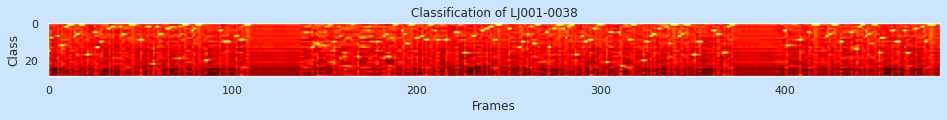



Predict a sequence of tokens tensor([15,  8,  0,  0,  0,  7,  0, 12, 12,  2,  2,  1,  1,  1,  7,  6,  6,  1,
         1,  0,  0, 17,  0,  0,  0,  5, 13, 13, 10, 10,  0,  0,  0,  3,  0,  2,
         0,  0,  0,  2,  6,  6,  0,  0,  0,  1,  1,  0,  0,  0,  9,  0,  0,  0,
         2,  0,  0, 22,  0,  2,  6,  6,  0,  0,  3,  3,  0,  0,  0,  0,  0, 19,
         0,  1,  1,  1,  0,  0,  4,  3,  0,  1,  1,  0,  0, 20, 20,  0,  0,  0,
         0,  0,  0,  4,  0,  0, 10, 10, 10,  0,  0,  0,  7,  0,  9,  9,  0,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 13,
         0,  0, 11,  0,  0,  0,  5,  0,  0,  0,  0, 10,  0,  0,  7,  0,  0, 16,
         8,  0,  0,  1,  0,  0, 18,  0,  0,  0,  0,  0,  2, 10,  0,  0, 10, 10,
         0,  0,  7,  0,  6, 18,  0,  0,  1,  1,  0,  0,  4,  6,  0, 11,  1,  1,
         1,  0,  8,  0,  0,  7,  0,  9,  0,  1,  1,  0,  4,  9,  9,  0,  0,  0,
         

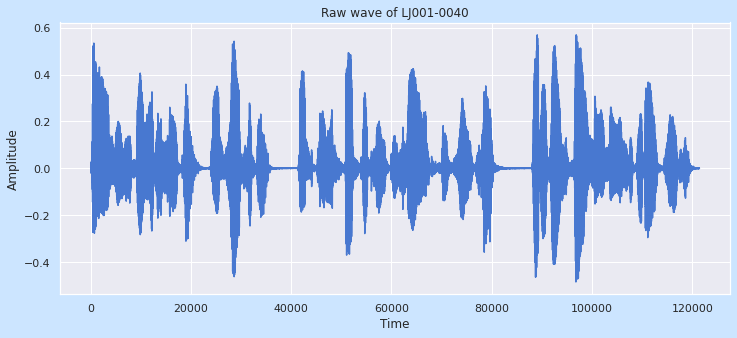

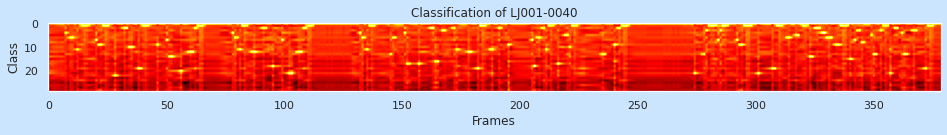



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  0,  4,  0,  6,  6,  0, 11,  0,  1,  1,  1,  0,
         0,  0,  7,  9,  9,  1,  1,  1,  0,  0, 22,  0,  0,  0,  2,  2, 10, 10,
         0,  0, 19, 19,  1,  1,  1,  0,  0,  0,  9,  0,  0,  0,  7, 14, 14,  0,
         0,  0, 20,  0,  0,  0, 12, 12,  2,  1,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  4,  6,  0, 11,  1,  1,  1,  0, 12, 12,  0,  0,
         0,  2,  2,  0,  0, 18,  0,  0,  0,  7,  0,  0, 21, 21,  0,  0, 12, 12,
         2,  2,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  4,  6,  0, 11,  1,  1,  1,  0,  0,  0,  0,  0,
         0, 13,  6,  0,  0,  0,  0,  4, 17,  0,  0,  0,  0, 17,  0,  0,  0,  0,
         2,  2, 16, 16,  0,  3,  3,  0,  0,  0,  2, 11,  0,  0,  0,  0, 12, 12,
         0,  0, 19,  1,  1,  1,  0,  0, 11,  0,  0,  2,  0,  0,  0,  9,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  7, 18,  6,  6,  0,  2, 11,  0,  1,  0,  0,
        1

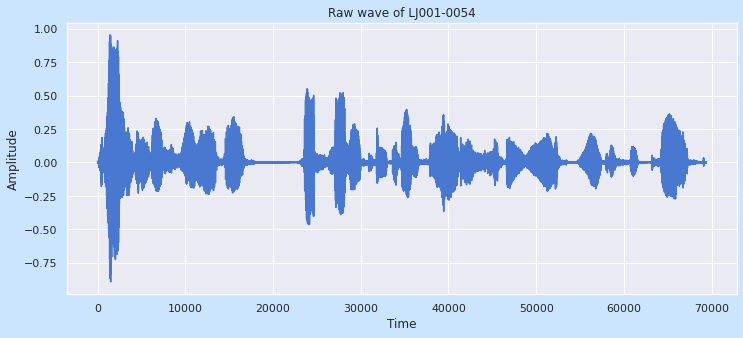

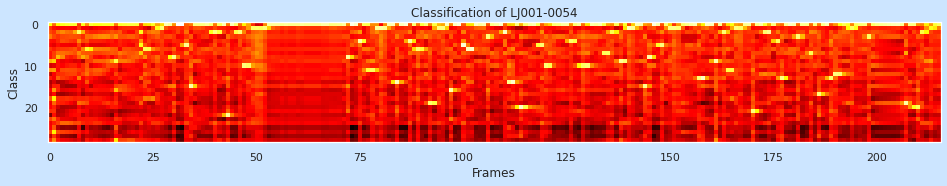



Predict a sequence of tokens tensor([ 0, 18,  0,  0,  0,  0,  0,  2,  0,  6,  0,  0,  0,  0,  0,  0,  9,  0,
         0,  0,  0,  0,  2,  6,  6,  0,  1,  1,  0,  0,  8,  0,  0,  5, 15,  0,
         0,  0,  0,  0,  2,  0,  0, 22,  0,  0,  2, 10, 10,  1,  1,  1,  1,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         8,  0,  0,  4,  0,  0, 11,  1,  1,  1,  0,  0, 14,  0,  0,  4,  0,  6,
         0,  0, 19, 19,  1,  1,  0, 16,  0,  0,  5,  6,  6,  0,  0,  0,  3,  0,
         0,  0,  2, 14, 14,  0, 20,  0,  0,  0,  0,  5, 10, 10,  0,  0,  0,  0,
         4,  0,  0, 10, 10,  0,  0,  0,  7,  7,  2,  0,  9,  9,  1,  1,  0,  0,
        15,  8,  0,  0,  5,  0,  1,  1,  1,  0,  0,  0,  0, 13, 13,  0,  0,  9,
         0,  2, 11, 11,  1,  1,  0,  0, 21,  0,  0,  2,  2,  0,  4, 13,  0,  0,
         0,  3,  0,  0,  7,  0, 17,  0,  0, 13, 12, 12,  0,  0,  1,  0,  0,  0,
         3,  0,  0,  0,  0,  0,  0,  0,  0, 19,  0,  0, 20,  2,  2,  1,  0,  0])

Merge r

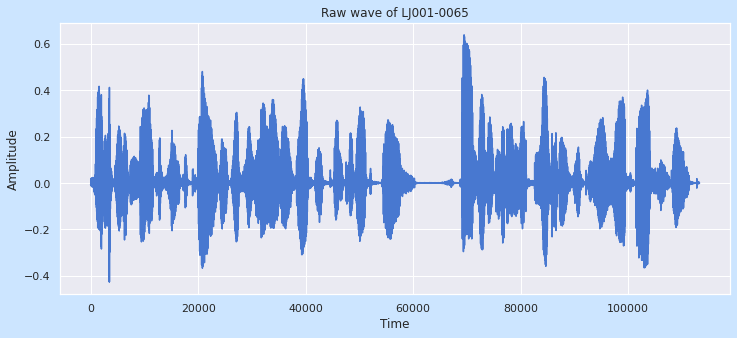

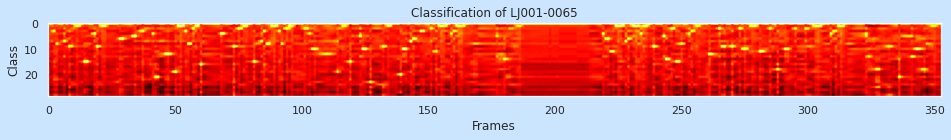



Predict a sequence of tokens tensor([ 0,  0,  3,  8,  0,  0,  7,  0,  9,  0,  0,  1,  0,  0, 15, 15,  0,  0,
         4,  9,  0,  1,  1,  0,  0,  0,  0,  0,  6,  6,  0,  0,  0,  5,  5,  0,
         0,  3,  0,  0,  0,  4, 21, 21,  0,  0, 12, 12,  0,  0, 19,  1,  1,  1,
         3,  8,  0,  2,  1,  0, 16,  0,  0,  0,  0,  0,  0,  0,  4,  4,  0,  0,
         0,  9,  0,  2,  2,  1,  1,  0,  0, 15,  0,  0,  7,  3,  8,  8,  1,  1,
         1,  3,  8,  0,  2,  1,  1,  0,  0,  0,  0,  2,  2,  4, 10, 10,  0,  0,
         0, 12, 12, 12,  0,  0, 19,  0,  1,  1,  0, 15,  0,  0,  0,  5, 10, 10,
         0, 23,  0,  0,  0,  0,  9,  9,  1,  0,  0,  0,  0, 20, 10, 10,  0,  7,
         6,  0,  0,  3,  3,  0,  0,  2,  0, 11,  1,  1,  1,  0,  0,  4,  3,  1,
         1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5,  0,  0,
        14,  0,  2,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

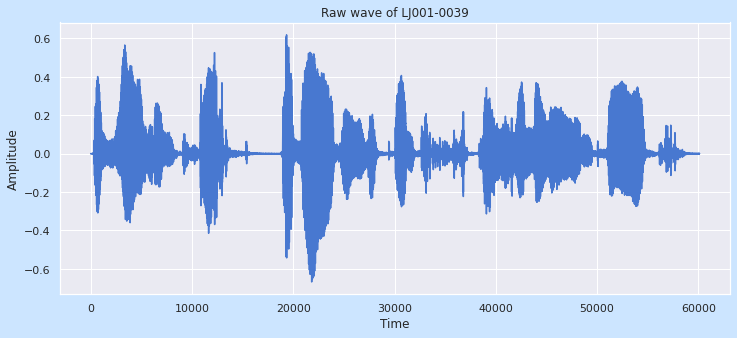

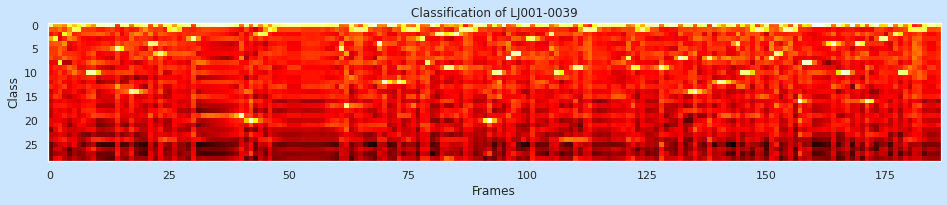



Predict a sequence of tokens tensor([ 0,  3,  8,  2,  0,  1,  1,  0, 10, 10,  0,  0,  0,  0,  5,  0,  0, 14,
        14,  0,  0,  4,  4,  6,  0,  0,  1,  0,  0,  0,  3,  0,  0,  0,  0,  0,
         0,  0,  0,  0, 19,  0, 20,  0,  2,  2,  1,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  5, 17,  0,  1,  1,  1,  0,  0,  4, 12,  0,
         0, 12,  0,  1,  1,  0,  3,  8,  0,  2,  2,  9,  9,  2,  1,  1,  1,  0,
         0,  0, 20, 10, 10,  0,  7,  6,  6,  0,  0,  3,  0,  0,  0,  2, 10,  0,
         0,  0,  9,  9,  1,  1,  1,  0,  0,  0,  0,  0,  0,  7,  9,  0,  1,  0,
         0,  0,  9,  0,  0,  0,  7,  0,  0, 14,  0,  0,  7,  0, 12, 12,  0,  0,
         4, 10, 10,  0,  1,  1,  0,  7,  6,  0,  1,  1,  0, 16,  8,  8,  0,  0,
         0,  0,  4,  0, 10, 10,  0,  4,  0, 16,  0,  0,  3,  3,  0,  2, 10, 10,
         1,  1,  1,  1,  0,  0,  0])

Merge repeats  tensor([ 0,  3,  8,  2,  0,  1,  0, 10,  0,  5,  0, 14,  0,  4,  6,  0,  1,  0,
         3,  0, 19,  0, 20,  0,  2, 

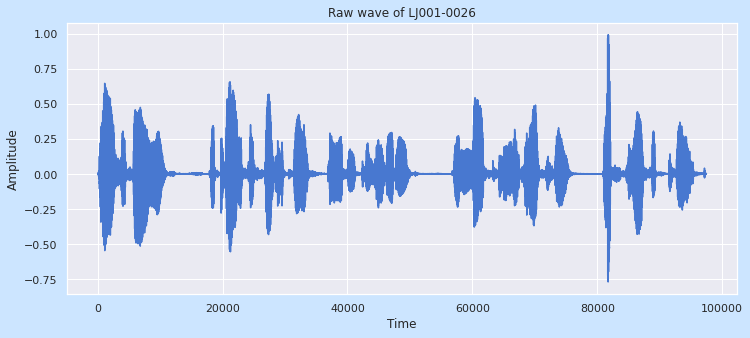

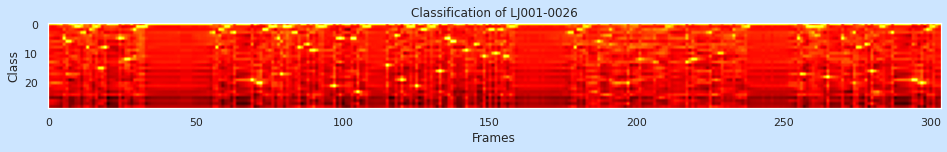



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  5,  6,  0,  0,  1,  1,  0,  3,  8,  2,  1,  1,  0,
        15,  8,  0,  0,  0,  0,  5,  0, 12, 12,  0,  2,  1,  1,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  3,  8,  2,  0,  1,  1,  0,  3,  0,  0,  0,  0,  0, 19,  0, 20,
        20,  2,  2,  1,  1,  1,  5, 17,  1,  1,  1,  3,  3,  8,  0,  0,  7,  9,
         9,  0,  1,  1,  0,  0,  0, 21,  0,  5,  0,  0,  0,  5,  5, 23,  0,  1,
         1,  1,  0,  0,  0,  0,  0, 14,  0,  0,  4,  0, 19,  0,  0,  1,  0, 21,
         0,  2,  2,  0,  1,  1,  0, 16,  0,  0,  5,  6,  6,  0,  0,  0,  9,  0,
         0,  7,  0,  0, 11,  0,  2,  2, 10,  0,  2, 11, 11,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  3,  8,
         2,  2,  1,  1,  0,  0,  0,  6,  0,  0,  0,  2,  0,  0,  0,  0,  0, 20,
         0,  0,  0, 12,  0,  0,  0,  0, 13,  0,  0,  0,  0,  1,  0,  0,  0,  0,
         

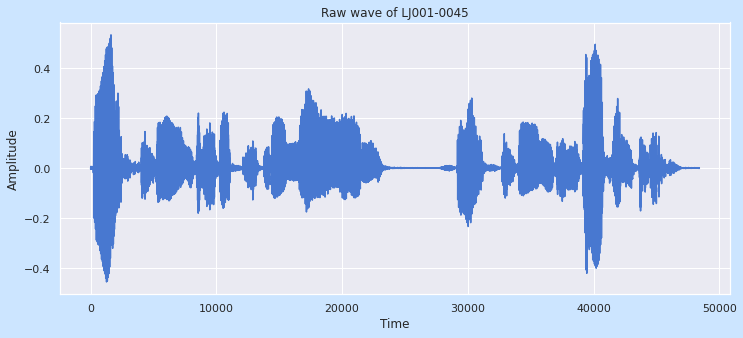

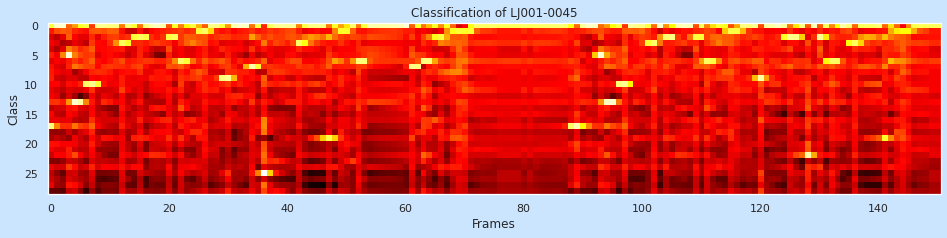



Predict a sequence of tokens tensor([17,  0,  0,  5, 13, 13, 10, 10,  0,  0,  0,  0,  3,  0,  2,  2,  0,  0,
         0,  0,  2,  2,  6,  6,  0,  1,  1,  0,  0,  9,  9,  0,  0,  0,  7,  0,
        25,  0,  0,  0,  0,  0,  3,  0,  0,  0,  0, 19,  0,  1,  1,  0,  6,  6,
         0,  0,  0,  0,  0,  0,  0,  7,  7,  6,  6,  0,  2,  0,  1,  1,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 17, 17,
         0,  0,  0,  5, 13, 13, 10, 10,  0,  0,  0,  0,  3,  0,  2,  2,  0,  0,
         0,  2,  0,  6,  6,  0,  0,  1,  1,  0,  0,  0,  9,  0,  0,  0,  0,  2,
         2,  0, 22,  0,  2,  0,  6,  6,  0,  0,  3,  0,  0,  0,  0, 19,  0,  1,
         1,  1,  0,  0,  0,  0,  0])

Merge repeats  tensor([17,  0,  5, 13, 10,  0,  3,  0,  2,  0,  2,  6,  0,  1,  0,  9,  0,  7,
         0, 25,  0,  3,  0, 19,  0,  1,  0,  6,  0,  7,  6,  0,  2,  0,  1,  0,
        17,  0,  5, 13, 10,  0,  3,  0,  2,  0,  2,  0,  6,  0,  1,  0,  9,  0,
         2,  0, 22,  0,  2,  0,  6, 

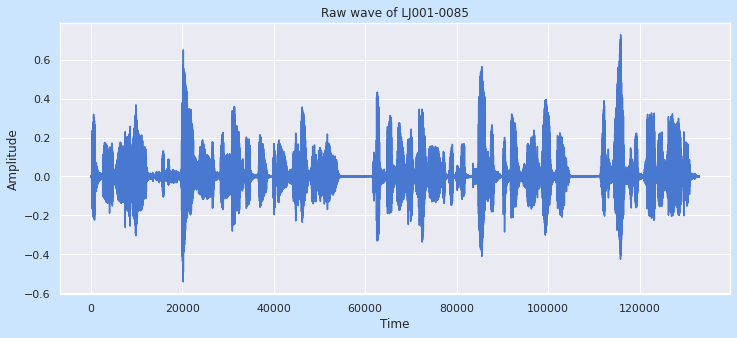

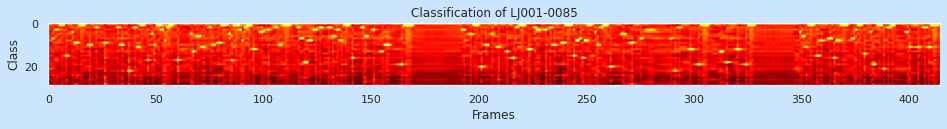



Predict a sequence of tokens tensor([ 0,  0,  7,  3,  3,  0,  1,  0, 15,  0,  0,  4,  9,  9,  0,  1,  1,  0,
         0, 10,  0,  0,  2,  0,  0,  0,  9,  0,  0,  0,  0,  0,  2,  0, 10,  0,
         0, 22,  0,  0,  2, 11, 11,  1,  1,  0, 17,  0,  5, 10,  0,  1,  1,  3,
         8,  2,  1,  1,  0,  0, 17,  0,  0,  0,  0,  0,  5, 13,  0,  6,  6, 11,
        11,  0,  0,  2, 10,  0,  0,  9,  9,  1,  1,  0,  5, 17,  1,  1,  1,  3,
         8,  2,  1,  1,  0, 12,  0,  0,  4,  4,  0,  0,  3,  0,  0,  2,  2, 10,
        10,  1,  1,  1,  0,  0,  0,  0,  2,  7,  7, 18, 18,  8,  8,  3,  3,  0,
         2,  0,  0,  0,  2,  2,  6,  0,  3,  8,  8,  0,  1,  1,  0, 16,  0,  0,
         0,  0,  2,  6,  0,  0,  0,  3,  0,  0,  0, 13, 10, 10, 10,  0,  0,  0,
         0,  0, 19,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  3,  0,  0,  5,  0,
         1,  1,  0, 20,  0, 10, 10,  0,  5,  0,  0, 11,  0,  0,  0, 13,  0,  0,
        1

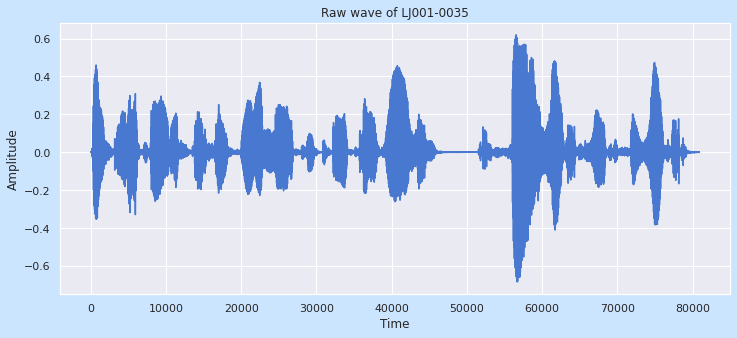

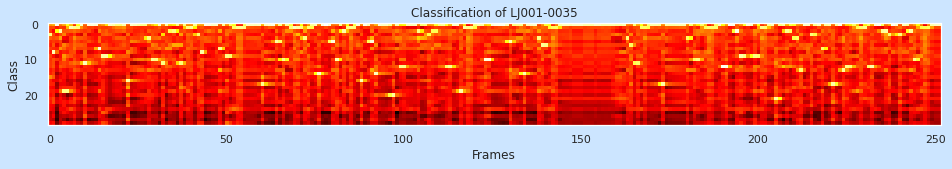



Predict a sequence of tokens tensor([ 3,  8,  0,  2, 19, 19,  1,  1,  1,  0, 11,  0,  0,  0,  7,  9,  9,  0,
         0,  0,  0,  0, 16,  0,  0,  0,  0,  0,  4, 10, 10,  0, 11,  0,  2,  2,
         0, 11,  0,  1,  1,  0,  3,  8,  0,  0,  0,  0,  7,  0,  9,  9,  1,  1,
         1,  1,  0,  0,  0,  0, 17,  0,  0,  0,  5,  0, 10,  0,  1,  1,  1,  1,
         4,  1,  0,  0, 14,  0,  0,  0,  5, 10,  0,  2,  1,  1,  1,  0, 16,  0,
         0,  5, 14,  0,  0,  0,  0, 20,  0, 12, 12,  0,  0,  0,  2,  0,  0,  3,
         2,  2,  0,  0, 12, 12,  0,  0, 19,  1,  1,  1,  0,  0,  0, 10, 10,  0,
         0,  0,  0,  0,  5,  0,  0,  0, 14,  0,  0,  0,  4,  6,  6,  1,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  4,  6,  0, 11,  1,  1,  0,  0,  0,  0, 17,  0,  0,  0,  0,  0,  0,
         4,  0, 10, 10,  0,  1,  1,  1,  1,  0, 12, 12,  0,  0,  2,  9,  9,  0,
         0,  9,  9,  1,  1,  0,  0, 21,  0,  0,  2,  2,  4,  4, 13,  0,  0,  3,
         

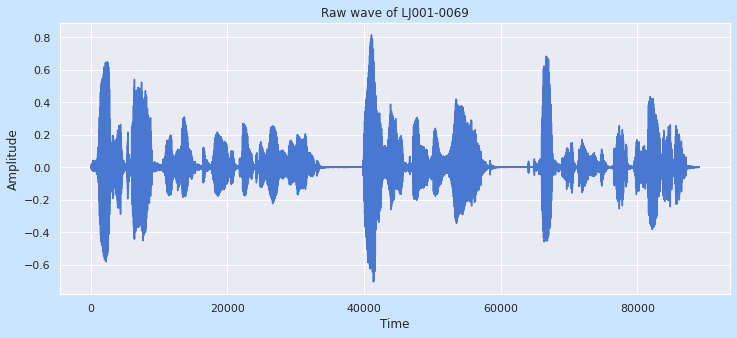

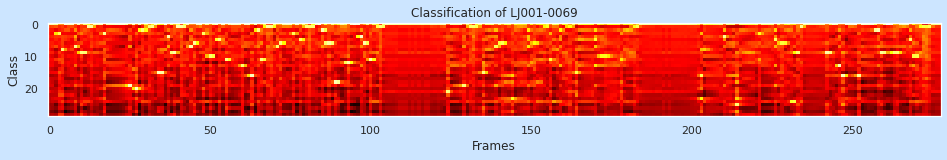



Predict a sequence of tokens tensor([ 0,  0,  0,  3,  8,  0,  0,  0,  7,  0,  9,  9,  1,  1,  0,  0,  0,  3,
         0,  0,  0,  0,  0,  0,  0, 19,  0, 20,  0,  2,  0,  1,  1,  0, 15, 15,
         0,  4,  9,  9,  1,  1,  1,  0,  7,  6,  0,  0,  3,  0, 10,  0,  0,  5,
         0, 11,  0,  0,  0,  0, 13,  0,  0, 16,  0,  2, 11,  0,  1,  1,  0,  7,
         6,  0,  0,  0,  3,  0,  5,  0,  1,  1,  1,  0,  0,  2,  6,  6,  6, 18,
        18,  0,  0, 12,  0,  0,  0,  4,  6,  0, 11,  0,  1,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 21,  0,
         0,  0,  0, 19,  0,  1,  1,  1,  0, 15,  0,  0,  0,  7,  0,  6,  0,  0,
        23,  0,  0,  0,  0,  2,  0,  6,  0,  0,  1,  0, 11,  0,  0,  2,  0,  0,
         1,  0, 15,  0,  0,  0,  0,  0,  5,  0, 10, 10,  0,  0,  0,  0, 11,  0,
         0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0, 16,  0,  0,  0,  0,  0,  0,  4,  0,  0,  0, 25,  0,
         

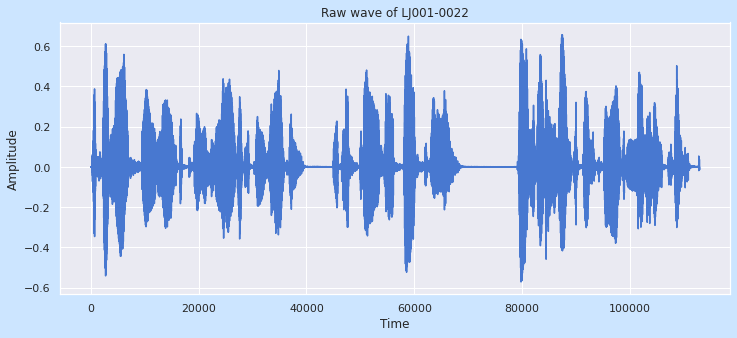

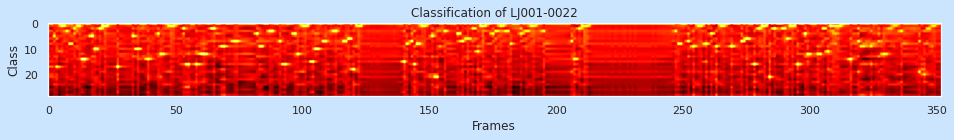



Predict a sequence of tokens tensor([ 0,  0,  5, 17,  0,  1,  1,  3,  8,  8,  2,  1,  1, 14, 14,  0,  0,  5,
        10, 10,  2,  1,  1,  1,  0,  0,  0, 17,  0,  0,  0,  0,  0,  5,  0, 10,
         0,  0,  0, 14,  0,  0,  0,  4, 12, 12,  0,  1,  1,  1,  0,  0,  0,  2,
        16, 16,  0,  0, 16,  0, 12, 12, 12,  0,  2,  2,  0,  0,  9,  9,  0,  0,
         0,  7,  7,  0,  0,  0,  0,  0,  0,  0,  4,  9,  9,  0,  0,  3,  3,  0,
         0,  7, 16, 16,  0,  0,  0,  4, 12,  0,  1,  1,  0, 15, 15, 10, 10,  0,
         7,  7,  0,  0,  3,  3,  0,  0,  7,  7,  6,  6, 18,  0,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,  8,  0,  7,
        16,  8,  8,  1,  1,  0,  0,  5, 21, 21,  0,  0,  3,  0,  0,  0,  0,  4,
         4,  7,  0,  6,  0,  2,  0, 11,  1,  1,  1,  0,  0,  4,  3,  0,  1,  1,
         3,  3,  8,  0,  0,  0,  4,  0,  3,  3,  1,  1,  0,  0,  0,  3,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  7, 14, 14,  2,  1,  1,  1,  0,  0,  0,
         

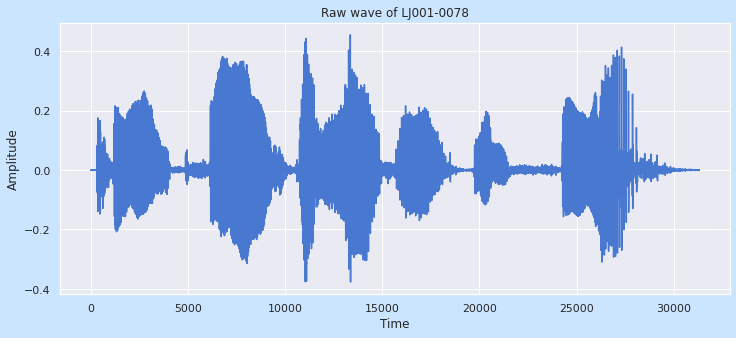

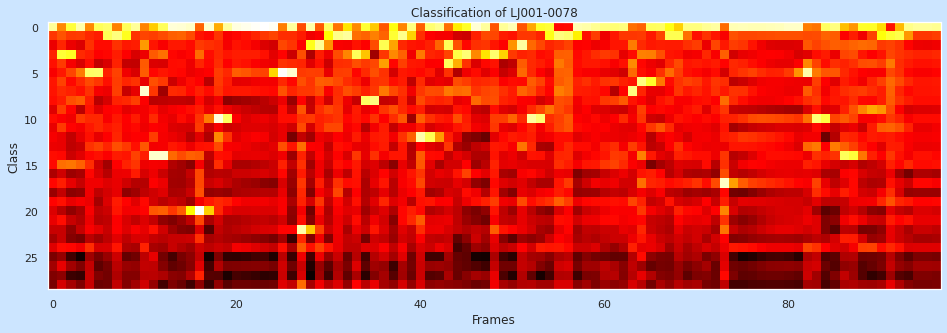



Predict a sequence of tokens tensor([ 0,  3,  0,  0,  5,  5,  0,  1,  0,  0,  7, 14, 14,  0,  0,  0, 20,  0,
        10,  0,  0,  0,  0,  0,  0,  5,  5, 22,  0,  2,  0,  1,  1,  3,  8,  8,
         2,  1,  1,  0, 12,  0,  0,  2,  3,  3,  0,  0,  3,  0,  0,  2, 10, 10,
         0,  1,  1,  0,  0,  0,  0,  0,  0,  7,  6,  0,  0,  1,  1,  0,  0,  0,
         0, 17,  0,  0,  0,  0,  0,  0,  0,  0,  5, 10,  0,  0, 14, 14,  0,  0,
         1,  1,  1,  0,  0,  0,  0])

Merge repeats  tensor([ 0,  3,  0,  5,  0,  1,  0,  7, 14,  0, 20,  0, 10,  0,  5, 22,  0,  2,
         0,  1,  3,  8,  2,  1,  0, 12,  0,  2,  3,  0,  3,  0,  2, 10,  0,  1,
         0,  7,  6,  0,  1,  0, 17,  0,  5, 10,  0, 14,  0,  1,  0])

labels ['T', 'O', '|', 'I', 'M', 'P', 'R', 'O', 'V', 'E', '|', 'T', 'H', 'E', '|', 'L', 'E', 'T', 'T', 'E', 'R', '|', 'I', 'N', '|', 'F', 'O', 'R', 'M', '|']

Transcript: TO|IMPROVE|THE|LETTER|IN|FORM|



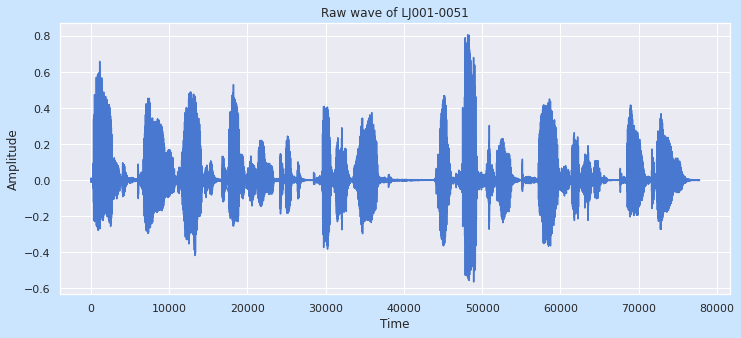

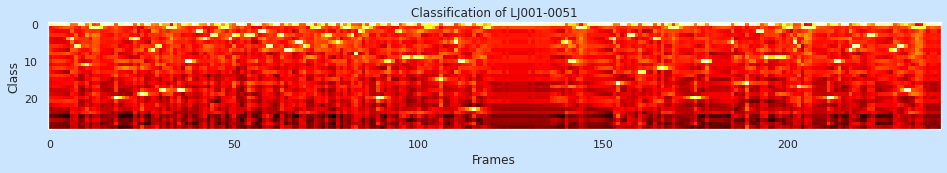



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  4,  6,  0,  0, 11,  1,  1,  1,  0,  0,  0,  0,
        20,  0,  0,  0,  0,  4,  0, 19,  0,  0,  7,  6,  0, 18,  1,  1,  1, 18,
        18, 10, 10,  0,  2,  2,  4,  0,  3,  3,  0,  1,  1,  4,  3,  0,  0,  0,
         3,  0,  0,  2,  2,  6,  6,  0,  0,  3,  7,  7,  0,  5,  5,  6,  0,  0,
         1,  1,  0,  3,  0,  0,  5,  0,  1,  1,  3,  8,  2,  1,  1,  0,  0, 20,
        20,  0, 10,  0,  0,  2,  9,  9,  0,  9,  9,  9,  0,  1,  0,  0, 15,  0,
         0,  0,  5, 10, 10,  0,  0, 23,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  5, 10, 10,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  4, 16,  0,  0,  3,  3,  0, 13,  0,
         0,  0,  4,  0, 12,  0,  1,  1,  1,  0,  0,  0,  0, 20,  0, 10, 10,  0,
         0,  0,  0,  0,  0,  5,  0,  0,  0, 16,  0,  0,  2,  2,  9,  0,  0,  9,
         9,  0,  1,  1,  5, 17,  1,  1,  1,  1,  0,  0,  0, 20, 20, 10, 10,  0,
         

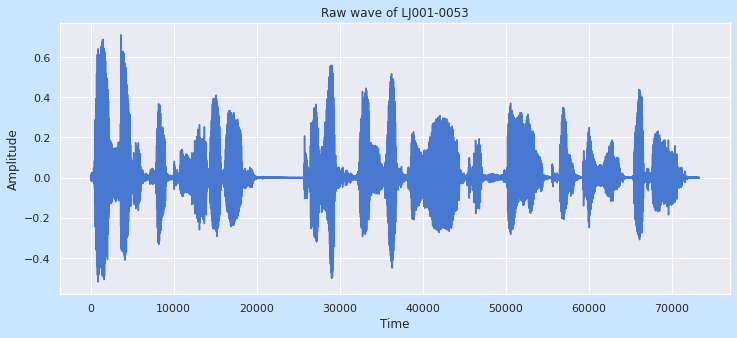

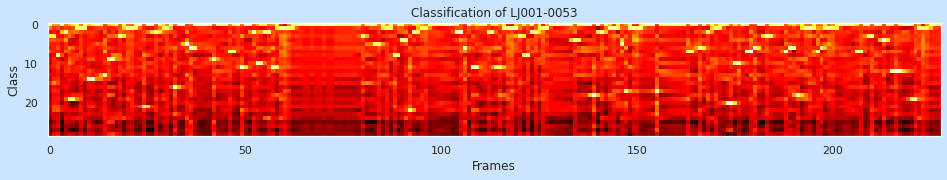



Predict a sequence of tokens tensor([ 0,  3,  8,  0,  2, 19, 19,  1,  1,  0, 14, 14,  0,  0, 13,  9,  9,  0,
         3,  0,  1,  1,  0,  0, 21,  0,  0,  2,  0,  1,  1,  0, 16,  0,  0,  5,
         6,  6,  0,  0,  0,  0,  9,  0,  0,  0,  7,  0,  0, 11,  0,  0,  2, 10,
        10,  2,  2, 11, 11,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  3,  0,  0,  0,  5,  0,  1,  0,  8,  0,
         4,  4, 22,  2,  2,  1,  1,  0,  0,  0,  0,  0,  0,  0,  2,  2,  6,  0,
        11, 11,  0,  0,  2,  2, 11, 11,  1,  1,  1,  1,  3,  8,  8,  2,  2,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  4,  0,  0,  0,  0, 18,  0,  2,  0,  1,
         1,  1,  5, 17,  1,  1,  1,  1,  0,  0,  0, 17,  0,  0,  0,  0,  0,  0,
         0,  7,  0,  0,  6,  0,  2,  0,  1,  1,  0, 20, 20, 10, 10,  0,  7,  7,
         6,  0,  0,  3,  3,  0,  0,  0,  7,  6,  6, 18,  0,  1,  1,  1,  7,  6,
         1,  1,  1,  0,  0,  0,  0,  0,  7,  7,  0,  0,  3,  0,  0,  4,  0,  0,
        1

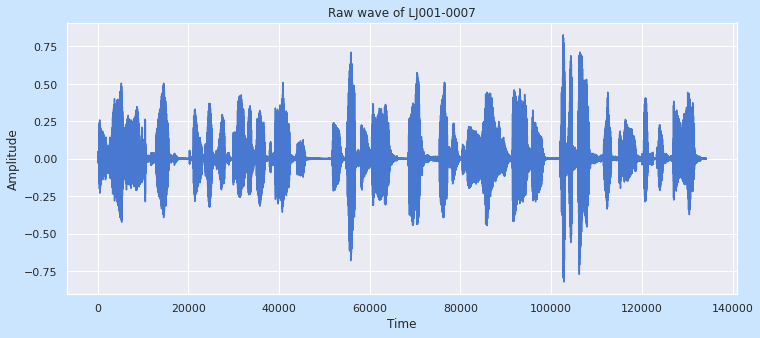

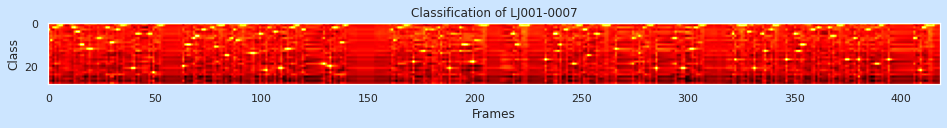



Predict a sequence of tokens tensor([ 3,  8,  0,  2,  0,  1,  1,  0,  0,  0,  0,  0,  2,  4,  4, 10, 10,  0,
         0, 12, 12,  0,  0,  7,  7,  0,  0,  2,  2,  9,  9,  0,  3,  0,  1,  1,
         0,  0,  0, 21, 21,  0,  5,  0,  0,  0,  0,  5,  0, 23,  0,  0,  1,  1,
         0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0, 10, 10,  0,  7,  6,  6,  0,
         3,  3,  0,  0,  0,  2, 11,  0,  1,  1,  0, 15, 15,  0,  7,  3,  8,  8,
         1,  1,  1,  0,  0, 14, 14,  0,  0,  5,  0,  0, 22,  0,  0,  0,  4,  0,
        21, 21,  0,  0, 12, 12,  2,  2,  1,  0,  0,  3,  3,  0,  0,  0,  0,  0,
         0,  0,  0, 19,  0,  0, 20,  0,  2,  2,  0,  9,  9,  1,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,
         8,  0,  2,  2,  0,  1,  1,  0,  0, 18,  0,  0,  0, 13, 13,  3,  0,  0,
         3,  0,  0,  2,  6,  0,  0,  0, 21,  0,  0,  0,  0,  2, 10, 10, 10,  0,
        18, 18,  0,  0,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

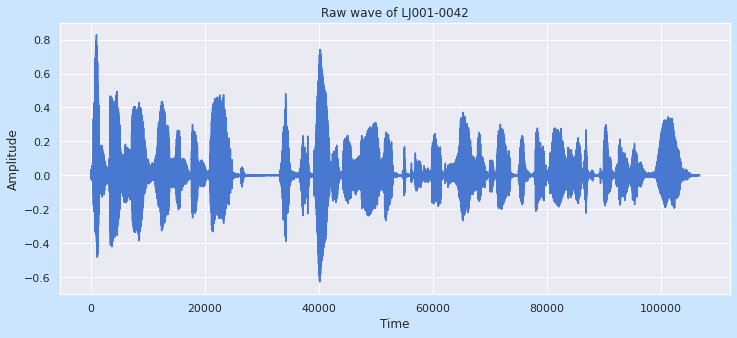

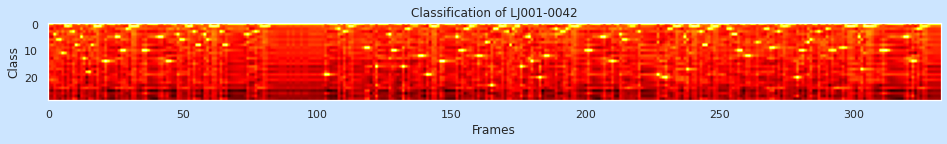



Predict a sequence of tokens tensor([ 0,  0,  4,  6,  6, 11,  0,  1,  0,  3,  8,  0,  5, 13,  0, 18,  8,  1,
         1,  1,  0, 14,  0,  0,  0,  5,  5, 10, 10,  2,  1,  1,  1,  1,  0, 10,
        10,  0,  0,  0,  0,  5,  5,  0, 14, 14,  0,  0,  4,  6,  6,  0,  1,  1,
         3,  8,  8,  0,  4,  6,  1,  1,  1,  1,  3,  8,  8,  0,  0,  0,  0,  0,
         0,  0,  4,  0,  0,  3,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 19, 19,  0,  0,  0,
         2,  0,  3,  0,  1,  1,  0,  0,  0,  0,  9,  9,  0,  0, 16,  0,  0,  0,
         0,  4, 10, 10,  0,  0, 16,  0,  2,  0,  0,  0, 12, 12,  0, 19, 19,  1,
         1,  0, 14, 14,  0,  0,  0,  0,  5,  0, 10,  2,  2,  1,  1,  0, 12,  0,
         0,  7,  0, 23,  2,  2,  1,  1,  1,  3,  8,  2,  1,  1, 16,  0,  0,  5,
        14,  0,  0, 20,  0, 12, 12,  0,  0,  2,  0,  3,  3,  2,  0,  1,  1,  1,
         0,  0,  0, 10, 10,  0,  0,  0,  5,  5,  0,  0, 14,  0,  0,  4,  6,  6,
         

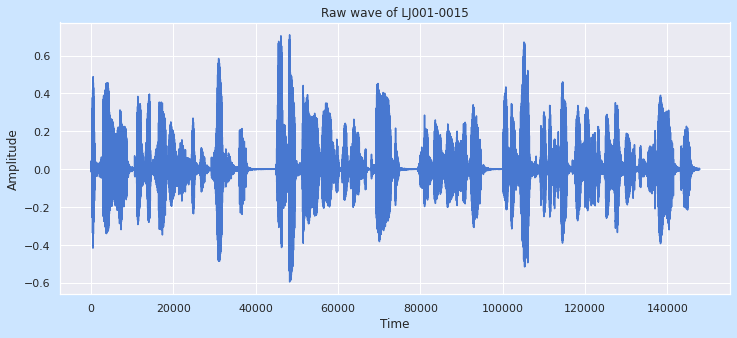

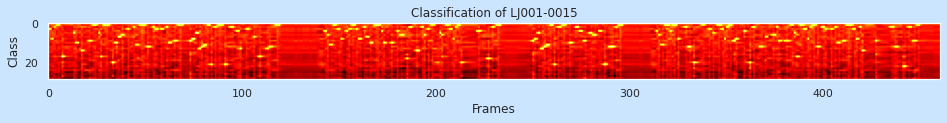



Predict a sequence of tokens tensor([ 3,  3,  8,  2,  1,  1,  0, 17,  0,  0,  0,  0,  0,  5, 10,  0,  0, 14,
         0,  0,  0,  9,  0,  1,  1,  0,  5, 17,  0,  1,  1,  1,  0, 20, 10, 10,
         7,  7,  6,  0,  0,  3,  0,  0,  2, 11, 11,  1,  1,  1,  0, 12, 12,  0,
         2,  3,  3,  0,  3,  3,  0,  2, 10, 10,  0,  9,  9,  1,  1,  1,  0,  0,
         0,  9,  8,  8,  5,  5, 13, 12,  0, 11,  1,  1, 21,  0,  2,  0,  1,  1,
         0, 21,  0,  0,  2,  2,  0,  4,  4, 13,  0,  0,  3,  3,  0,  0,  7,  0,
         0, 17,  0,  0,  0, 13, 12, 12,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,
         6, 11, 11,  1,  1,  3,  3,  8,  0,  0,  4,  3,  0,  1,  1,  3,  8,  8,
         0,  2,  7,  7, 10, 10,  1,  1,  1,  0,  4, 10,  0,  0,  0, 10,  0,  0,
         4,  0,  6,  6,  0, 18,  2,  2,  0,  0, 14, 14,  0,  2,  6,  0,  3,  0,
         1,  1,  0,  0,  5,  6,  0,  1,  1,  3,  3,  8,  2,  1,  1, 20,  0,  0,
         

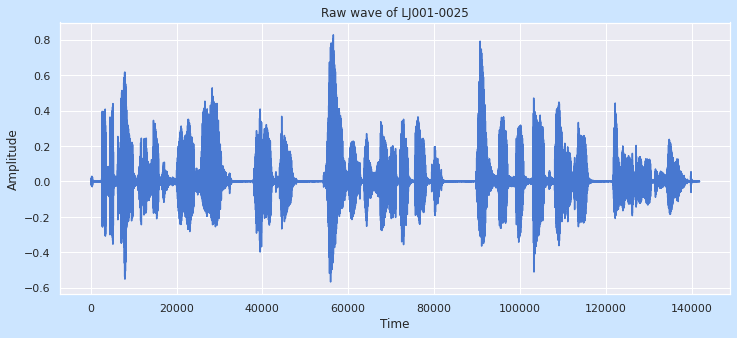

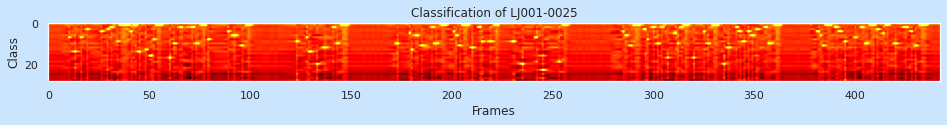



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  0,  0, 14,  0,  0,  7,  0,
         0,  3,  0,  0,  0,  0,  0,  0,  4,  0,  0,  3,  0,  2,  2,  0,  9,  0,
         1,  1,  1,  1,  1,  4,  1,  1,  0, 14,  0,  0, 13,  0, 16, 16,  8,  0,
         1,  1,  1,  0,  0,  0, 17,  0, 10, 10,  0,  2,  2,  0,  0,  0,  0,  2,
         2, 10, 10,  0,  1,  1,  1,  8,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,
         0,  6,  6,  6,  0,  0, 11,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  9,  0,  0,
         0,  0,  7, 14, 14,  0,  0, 20,  0,  0, 12, 12,  0,  0,  0,  2,  2, 10,
        10,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 10, 10,  0,  0,  0,  0,  0,  5,
        13,  0,  6,  6,  0, 11, 11,  0,  0,  0,  2, 10, 10, 10,  0,  1,  1,  1,
         0,  0,  0,  4,  6,  0, 11,  1,  1,  1,  1,  0, 12,  0,  0,  2,  2,  9,
         

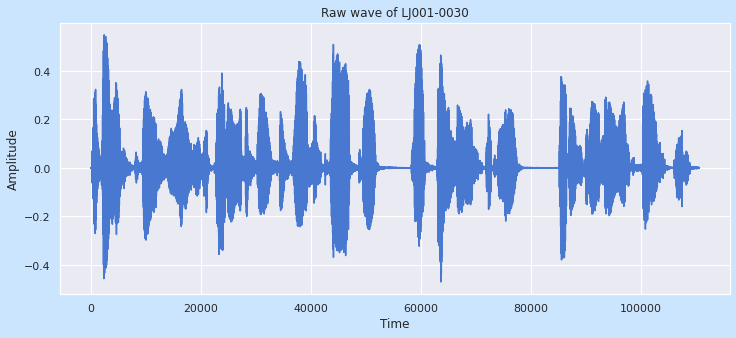

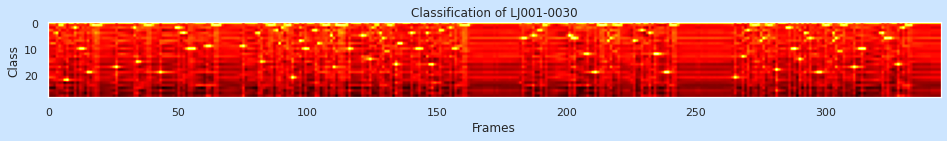



Predict a sequence of tokens tensor([ 0,  0,  0,  4,  1,  1,  0, 22,  0,  0,  2,  0, 10, 10,  0, 19, 19,  1,
         1,  1,  0,  0,  0,  0,  0,  0, 17,  0,  0,  0,  0,  0,  0,  2, 15,  0,
         0,  1,  1,  1,  0,  0,  0, 19,  0,  0,  0,  0,  0,  2,  2,  4,  4,  0,
        10, 10, 10,  0,  0,  0,  0,  9,  9,  1,  1,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  9,  0,  0,  0,  0,  0,  4, 15,  0,  0,  1,  1,  1,  3,  8,
         2,  1,  1,  1, 21,  0,  0,  7,  0, 10,  0,  0,  0,  3,  8,  0,  1,  1,
         1,  5, 17,  1,  1,  1,  1,  0, 10,  0,  0,  0,  0,  5,  5,  0, 14,  2,
         0,  0,  4,  6,  0,  1,  1,  0, 16,  8,  8,  0,  0,  0,  4,  0, 10, 10,
         0,  0,  4,  0, 16,  0,  0,  3,  3,  0,  0,  2,  0, 10,  0,  1,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  6,  6,  0,  0,  5,  0,  0,  3,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  5,  6,  6,  0,  0,  0, 12, 12,  0,  0, 19,  0,  1,  1,  1,
         

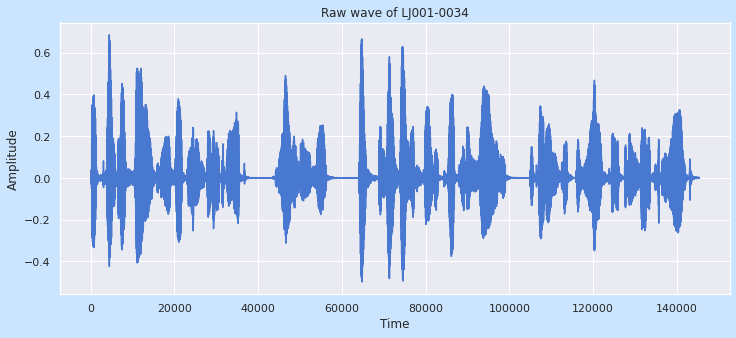

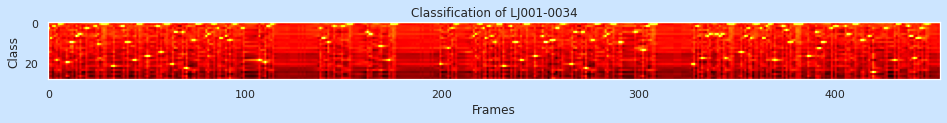



Predict a sequence of tokens tensor([ 3,  8,  0,  2, 19,  0,  1,  0,  0, 20, 20, 10, 10,  0,  7,  6,  6,  0,
         0,  3,  3,  0,  0,  0,  2, 11,  0,  1,  1,  1,  0,  0,  0, 22,  0,  0,
         0,  2,  2,  0, 10, 10,  0, 19, 19,  1,  1,  1,  0,  0, 17, 17,  0,  0,
         0,  2,  2, 15,  0,  1,  1,  1,  0, 21,  5,  5,  0,  0,  5,  0, 23,  0,
         0,  9,  9,  1,  1,  1,  0,  0,  7,  6,  0,  0,  1,  0,  3,  8,  8,  0,
         7,  0,  9,  0,  1,  1,  0,  0,  0,  3,  0,  0,  0,  0,  0,  0,  0, 19,
         0,  0, 20,  2,  2,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  8,  8,  0, 10,  0,
         0,  2,  0,  0,  0,  2,  2,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,
         5,  6,  6,  0,  0,  0, 12, 12,  0,  0,  0, 19,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0, 21,  0,  0,  0, 13,  0,  3,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,
         

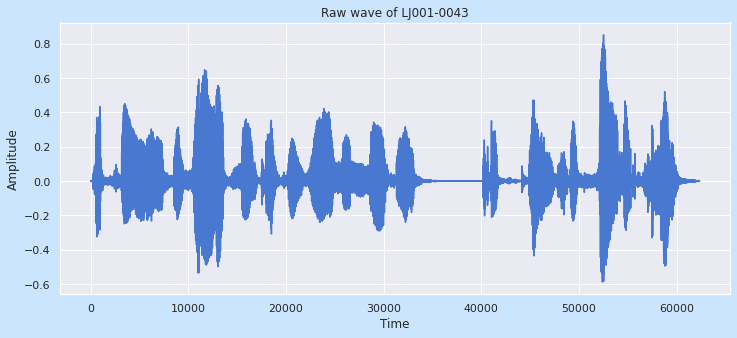

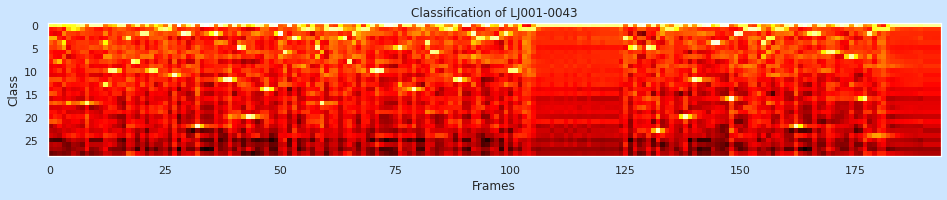



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  0,  0, 17,  0,  0,  0, 13, 10, 10,  0,  0,  3,
         8,  0,  2,  2, 10, 10,  1,  1,  0, 11,  0,  2,  2,  0, 22,  0,  0,  0,
         2,  0, 12, 12,  0,  5,  0, 20, 20,  0,  0, 14,  0,  0,  2,  6,  0,  3,
         0,  1,  1,  1,  5, 17,  1,  1,  1,  1,  3,  8,  2,  1,  1,  1,  0, 10,
        10,  0,  0,  0,  5,  0,  0, 14,  0,  0,  4,  6,  6,  0,  1,  1, 12, 12,
         0,  0,  2,  3,  0,  0,  3,  3,  0,  2, 10, 10,  1,  1,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,
         0,  5,  0,  0,  5,  0, 23,  0,  1,  1,  0,  0, 20,  0, 12,  0,  0,  0,
         4,  4,  0,  0, 16,  2,  2,  1,  1,  1,  1,  4,  3,  3,  1,  1,  0,  0,
        22,  0,  0,  0,  2,  0,  0,  6,  6,  0,  0,  0,  7,  0,  0, 16,  2,  0,
         1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0])

Merge repeats  tensor([ 0, 17,  0, 13, 10,  0,  3,  8,  0,  2, 10,  1,  0, 11,  0,  2,  0, 22,
        

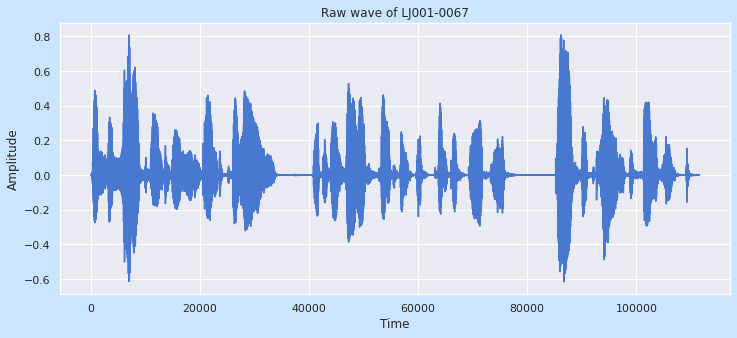

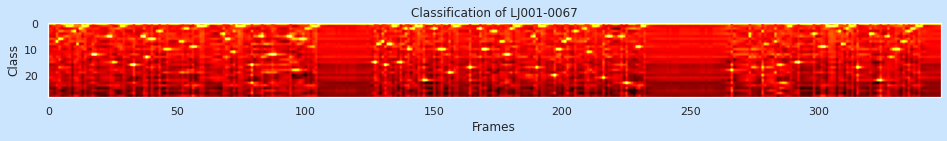



Predict a sequence of tokens tensor([ 0,  0,  0,  7,  6,  0,  0,  1,  1,  0,  3,  8,  2,  1,  1,  0,  0, 12,
        12,  0,  0,  0,  0,  5,  5, 15,  0,  0,  1,  1,  0,  0,  0, 16,  0,  0,
         0,  5, 13,  0,  6,  0,  0,  3,  0,  0, 10,  0,  0,  0,  0,  7,  7,  2,
         2,  0,  9,  9,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  4,  6,  6,  0,
        11,  1,  1,  1,  1,  0,  0, 16,  0,  0,  0,  5,  0,  0, 12, 12, 12,  0,
         0,  0,  0,  5,  5,  0, 18, 18,  6,  6,  2,  2,  0,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0, 15,  8,  0,  7, 16,  8,  8,  1,  1,  0, 15,  0,  2, 10,  0,  2,  1,
         1,  1, 22,  0,  0,  0,  2,  0, 10, 10,  0,  0, 19,  0,  1,  1,  0,  0,
         0,  0, 17,  0,  0,  0,  2, 10, 10,  0,  0,  3,  3,  0,  7,  7, 12, 12,
         2,  0,  1,  1,  0,  0,  0,  0,  0,  5, 17,  1,  1,  1,  0,  0,  0, 20,
        10, 10,  0,  7,  6,  0,  0,  3,  0,  0,  0,  2, 11,  0,  1,  1,  0,  0,
        2

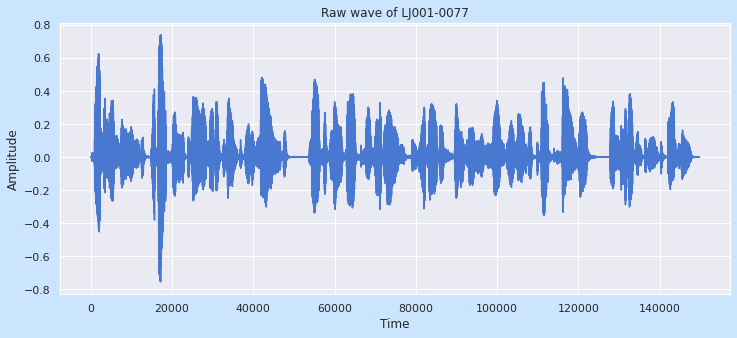

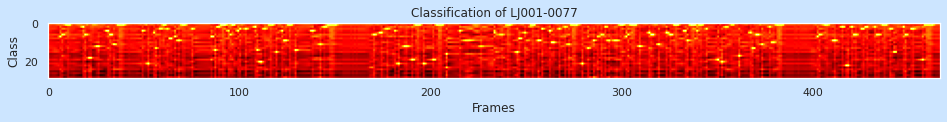



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  7,  6,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,
         2,  6,  0, 18, 18,  0,  0, 12, 12,  0,  0,  0,  4,  4,  6,  6, 11, 11,
         1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  0,  0, 21,  0,
         0,  5, 13,  0,  3,  3,  1,  1,  3,  8,  8,  0,  7,  0,  9,  0,  1,  1,
         0,  0,  0,  3,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  7, 14,  2,  2,
         1,  1,  1,  0,  4,  6,  1,  1,  0,  4,  3,  0,  0,  3,  0,  0,  0,  0,
         2, 14, 20, 20,  0,  3,  0,  1,  1,  1,  0, 15,  0,  0,  4,  9,  9,  1,
         1,  0,  0, 14,  0,  0,  0,  0,  0,  0,  0,  4,  4,  0,  0,  0, 11,  0,
         2,  2,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  6,  0,  0,  5,  5,  0,  0,  3,  0,  0,
         0,  4,  0, 21,  0,  0, 12, 12,  0,  0, 19, 19,  1,  1,  1,  0, 21,  0,
         0,  0,  0, 19, 19,  1,  1,  1,  1,  0, 16,  0,  0,  0,  0,  0,  0,  4,
         

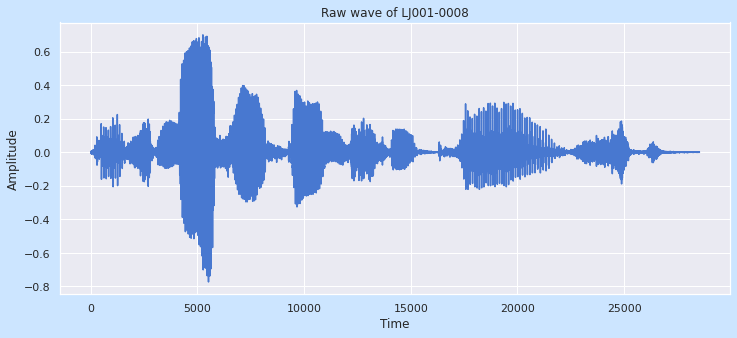

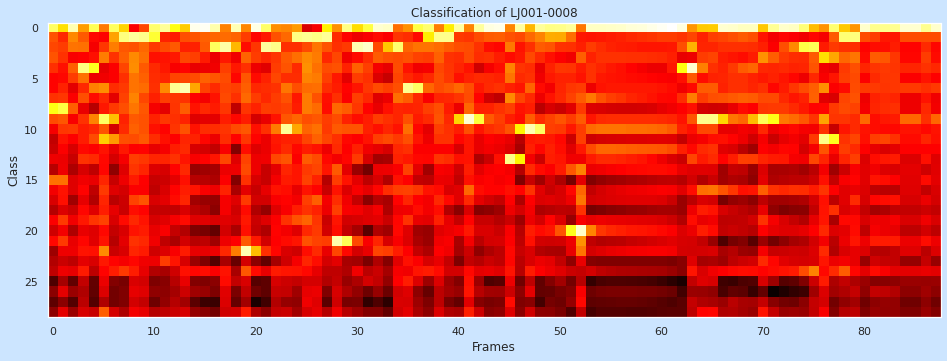



Predict a sequence of tokens tensor([ 0,  8,  0,  4,  0,  9,  0,  1,  1,  1,  0,  0,  6,  6,  0,  0,  0,  2,
         0, 22,  0,  2,  2, 10,  1,  1,  1,  1, 21,  0,  2,  2,  0,  0,  2,  6,
         6,  0,  1,  1,  0,  9,  0,  0,  0, 13,  0, 10,  0,  0,  0,  0, 20,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  9,  9,  0,  0,  0,  0,  9,  0,
         0,  0,  0,  2, 11,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0])

Merge repeats  tensor([ 0,  8,  0,  4,  0,  9,  0,  1,  0,  6,  0,  2,  0, 22,  0,  2, 10,  1,
        21,  0,  2,  0,  2,  6,  0,  1,  0,  9,  0, 13,  0, 10,  0, 20,  0,  4,
         9,  0,  9,  0,  2, 11,  0,  1,  0])

labels ['H', 'A', 'S', '|', 'N', 'E', 'V', 'E', 'R', '|', 'B', 'E', 'E', 'N', '|', 'S', 'U', 'R', 'P', 'A', 'S', 'S', 'E', 'D', '|']

Transcript: HAS|NEVER|BEEN|SURPASSED|



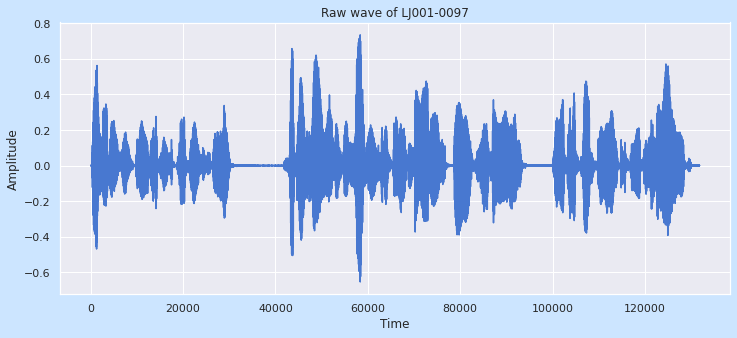

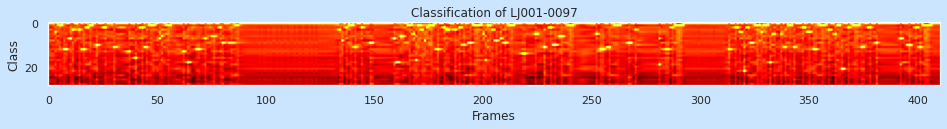



Predict a sequence of tokens tensor([ 0,  0,  0,  4,  0,  1,  1, 12, 12,  0,  7,  3,  0,  0,  3, 12, 12,  2,
         2,  1,  1,  0, 10,  0,  0,  2,  2,  0,  0,  0, 11,  0,  0,  0,  0,  0,
         0, 13,  0,  0, 16,  0,  2,  2, 11, 11,  0,  1,  1,  0,  0,  7,  6,  0,
         1,  1,  1,  0,  0,  0,  0,  0, 13,  0, 18, 18,  0,  0, 12, 12,  0,  0,
         7,  0,  0,  6,  6,  0,  0,  2,  9,  0,  0,  9,  9,  9,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  2,  0,  1,  1, 11,  0,  0,
         2,  0,  0,  0,  9,  9,  0,  0,  0,  0,  0,  0,  0,  0,  0,  7, 18, 18,
         6,  6,  0,  1,  1,  1,  5, 17,  1,  1,  3,  8,  2,  1,  1,  1,  0, 12,
         0,  0,  2,  3,  3,  0,  0,  3,  0,  2,  0, 10,  0,  9,  9,  0,  1,  1,
         1,  1,  5, 17,  1,  1,  3,  3,  8,  0,  7,  0,  9,  0,  1,  1,  1,  0,
         

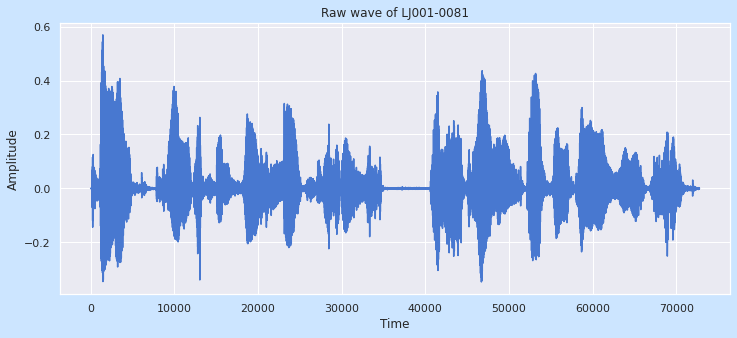

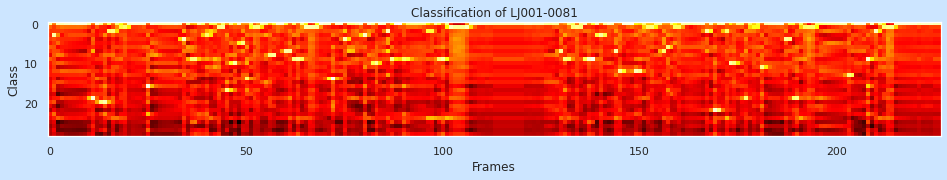



Predict a sequence of tokens tensor([ 0,  3,  0,  0,  0,  0,  0,  0,  0,  0,  0, 19,  0,  0, 20,  2,  2,  0,
         1,  1,  0,  0,  0,  0,  0, 16,  0,  0,  0,  0,  0,  0,  0,  0,  4,  0,
         9,  9,  0,  0,  3,  0,  0,  1,  1, 17,  0, 10,  0,  5, 14,  0,  1,  1,
         0,  0,  8,  8,  0,  0,  7,  7,  9,  9,  0,  1,  1,  1,  1,  0,  0,  0,
        14,  0,  0,  4,  0,  0,  0,  0,  3,  0,  0, 10,  0,  0,  2,  9,  0,  0,
         9,  0,  0,  0,  0,  0,  2,  2,  0,  9,  9,  0,  1,  1,  1,  1,  1,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  7,  9,  0,  1,  1,  0,  0,  9,  9,  0,  3,  0,  0,  0,
         7, 12,  0,  0,  0, 12, 12,  0,  1,  1,  0,  0,  7,  6,  0,  1,  1,  0,
         0,  0,  0,  0,  0,  2,  0, 22,  0,  0,  2, 10, 10,  0,  0, 19,  0,  1,
         0, 11,  0,  0,  0,  0,  0,  4,  4, 19, 19,  0,  1,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0, 13,  0,  0,  0,  0,  9,  0,  2,  0,  1,  1,  1,  0,
         

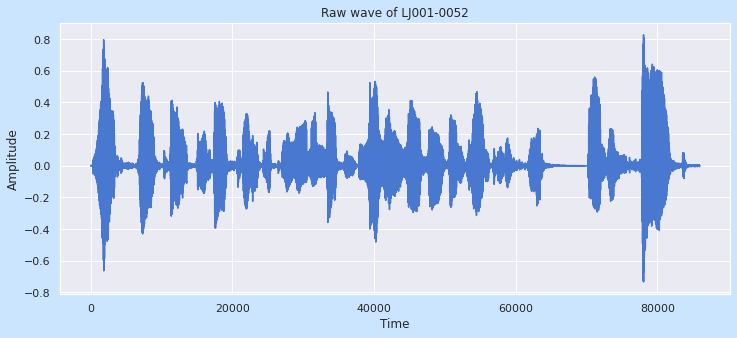

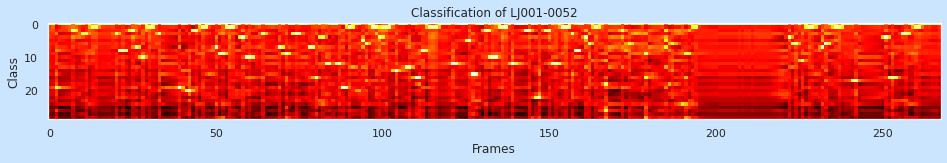



Predict a sequence of tokens tensor([ 0,  0, 19,  0,  0,  0,  0,  2,  0,  0,  3,  3,  0,  1,  1,  0,  0,  0,
         0,  0,  3,  8,  8,  0,  0,  2,  7,  0, 10,  0,  1,  1,  0,  3,  0,  0,
         0,  0,  0, 19,  0,  0, 20,  2,  2,  0,  1,  1,  0,  0,  7,  9,  9,  1,
         1,  1,  0,  0,  4, 10, 10,  0,  0,  0,  3,  0,  0,  0,  0,  7,  0,  9,
         0,  0,  3,  3,  0,  0,  7,  7, 16,  0,  4, 12, 12,  0,  0, 12, 19, 19,
         1,  1,  0,  0,  5,  6,  0,  1,  1,  4,  1,  1,  1,  0, 14,  0,  0, 13,
        13,  0, 16, 16,  8,  0,  1,  1,  1,  0,  0,  0,  0, 12, 12,  0,  0,  0,
         5, 15, 15,  0,  0,  2, 10, 10, 10,  1,  1,  1,  0, 12,  0,  0,  0,  2,
         2,  0,  0, 22,  0,  0,  2, 12, 12,  0,  1,  1,  1,  3,  8,  8,  0,  4,
         6,  0,  1,  1,  0, 18,  0,  0,  0,  0,  2,  0,  6,  0,  0,  0,  0,  9,
         0,  0,  0,  0,  0,  7,  0,  6,  0,  0, 24,  9,  9,  1,  1,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

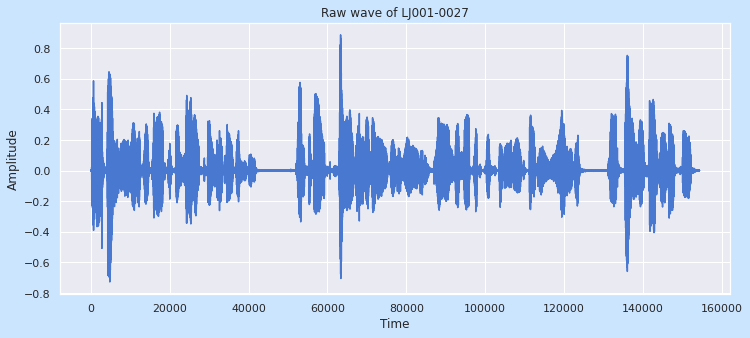

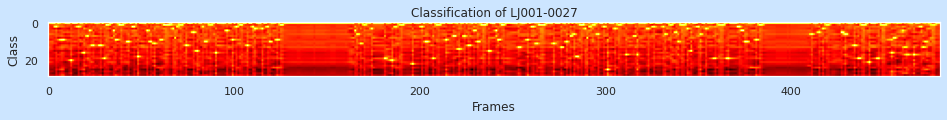



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  2,  0,  9,  9,  9,  0,  0,  0, 20,  0,  0,  0,  2,  0,
         0, 16,  0,  7,  4, 12, 12,  0,  0, 12, 12,  0, 19,  1,  1,  0,  0,  4,
         9,  9,  1,  1,  1,  0, 10, 10,  0,  2,  2,  0, 18,  0,  0,  0,  0,  4,
        10, 10,  0, 11,  0,  0,  9,  9,  1,  1,  1,  1,  0,  3,  8,  2,  1,  1,
         1,  0, 12,  0,  0,  0,  5,  0, 15,  0,  0,  2, 10, 10,  0,  1,  1,  0,
        16,  0,  0,  0,  0,  0,  4,  0,  0,  9,  0,  2,  0,  1,  1,  0,  0, 12,
         0,  0,  2,  3,  0,  0,  0,  3,  0,  0,  2, 10,  0,  0,  0,  9,  9,  1,
         1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  4,  6,  0, 11,  0,  1,  0,  0,  0,  3,  0,  0,  0,  0,  0,
         0, 19,  0,  0,  0, 20,  2,  2,  0,  1,  1,  1,  0,  0,  0,  0, 22,  0,
         0,  0,  0,  2,  0, 10, 10,  0,  0, 19,  0,  1,  1,  0,  0,  0,  9,  0,
         

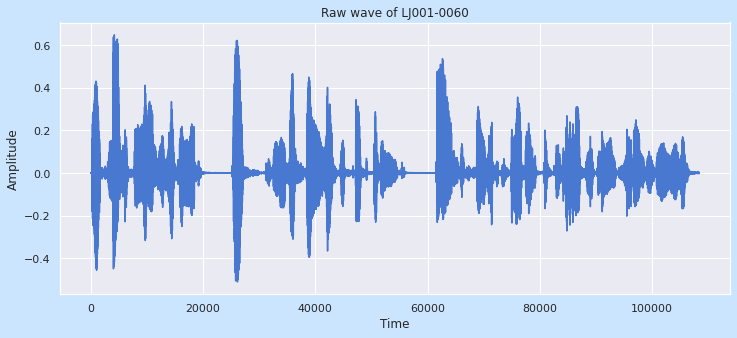

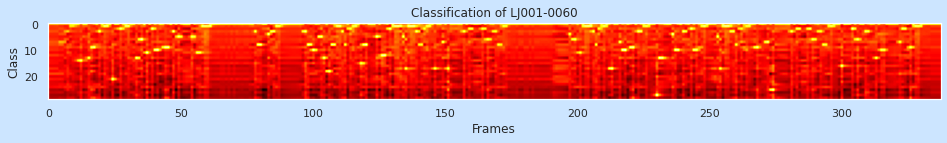



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14,  0,  0, 13,  9,  9,
         0,  3,  0,  1,  1,  0, 21,  0,  0,  2,  0,  1,  1,  0,  0, 13, 13,  6,
         0, 11,  0,  2, 10, 10,  0,  0,  9,  9,  0,  3,  0,  5,  0,  0,  0,  0,
         5,  0, 11, 11,  1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  3,  8,  8,  0,  0,  4,  3,  3,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  3,  8,  8, 10,  0,  5,  5, 13,  0, 18,  8,
         8,  1,  1,  3,  8,  0,  2,  1,  1,  0, 15,  8,  8,  0,  0,  0,  5,  0,
        12, 12,  0,  2,  0,  1,  1,  1,  5, 17,  1,  1,  1,  3,  8,  8,  2,  1,
         1,  0, 17,  0,  0,  7,  0, 17,  0,  0,  0,  0,  0,  3,  0,  2,  0,  0,
         0,  0,  2,  0,  6,  0,  0,  3,  8,  0,  1,  1,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,
         6,  6,  0, 11,  1,  1,  1,  1,  3,  8,  2,  0,  1,  0, 17, 17,  0,  0,
         

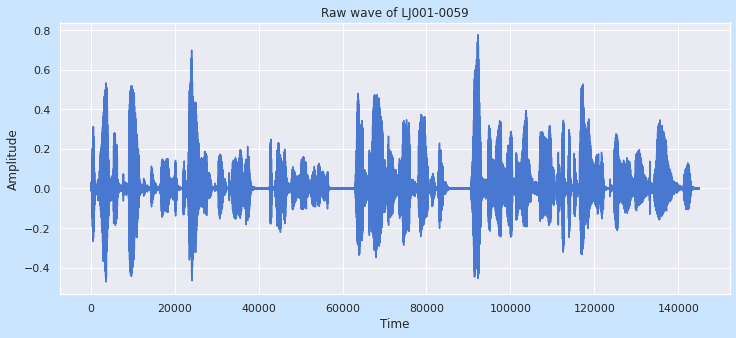

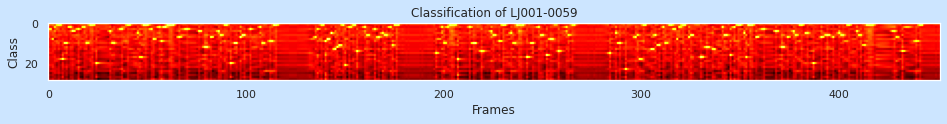



Predict a sequence of tokens tensor([ 3,  3,  8,  2,  1,  1,  0, 18, 10, 10,  0,  2,  4,  4,  0,  3,  0,  0,
         2, 10, 10,  1,  1,  0, 20,  0,  0,  0,  0,  0,  0,  4, 10, 10,  0,  0,
         3,  3,  0,  0,  1,  1,  0,  0,  0,  5, 17, 17,  1,  1,  1,  0,  3,  8,
         0,  0,  2,  9,  2,  2,  1,  1,  1,  1,  0,  0,  7,  0,  0,  3,  3,  0,
         0,  0,  0,  0,  4,  4,  0, 12, 12,  0,  7,  7,  0,  0,  4,  6,  6,  1,
         1,  0, 20,  0, 10, 10,  0,  7,  6,  6,  0,  0,  3,  0,  0,  0,  0,  2,
        10, 10,  0,  0,  9,  9,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  7,  3,  0,  1,  1,  9,  8,  8,  5,
         0, 13, 12, 11, 11,  1, 21,  0,  2,  2,  1,  1, 14,  0,  0,  0,  2,  6,
         6,  0,  0,  3,  0,  7,  0,  5,  6,  6,  0,  2, 11,  1,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 15,  0,
         0,  2, 10, 10,  2,  1,  1,  1,  0, 18,  0,  0,  0,  0,  0,  2,  0, 10,
        1

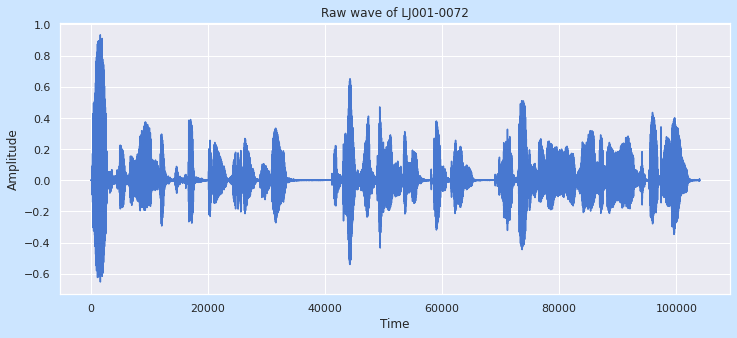

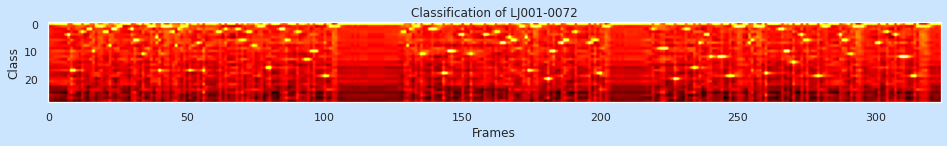



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  0,  0,  0,  4, 17, 17,  0,  0,  3,  0,  0,  2, 10,  0,
         1,  1,  3,  3,  8,  2,  2,  1,  1,  0,  0,  0,  2,  6,  6,  0, 11,  0,
         1,  1,  1,  5, 17,  1,  1,  1,  1,  3,  8,  2,  1,  1,  0, 17,  0,  0,
         7,  0, 17,  0,  0,  0,  0,  3,  3,  0,  2,  0,  0,  0,  2,  2,  6,  0,
         3,  3,  8,  0,  1,  1,  0, 16, 16,  0,  0,  0,  2,  2,  6,  0,  0,  0,
         3,  0,  0, 13, 13,  0, 10,  0,  0,  0, 19,  0,  1,  1,  1,  1,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  3,  8,  2,  0,  1,  1, 11,  0,  0,  0,  2,  2,  0,  0, 18,
         0, 10, 10,  0,  0,  4,  4,  0,  0, 11,  0,  0,  0,  0,  4,  4,  0,  0,
         3,  3,  7,  7,  0,  5,  6,  6,  0,  1,  1,  5, 17,  0,  1,  1,  1,  0,
         0, 20, 10, 10,  0,  0,  7,  6,  6,  0,  0,  3,  0,  0,  0,  0,  7,  0,
         6,  0, 18,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         

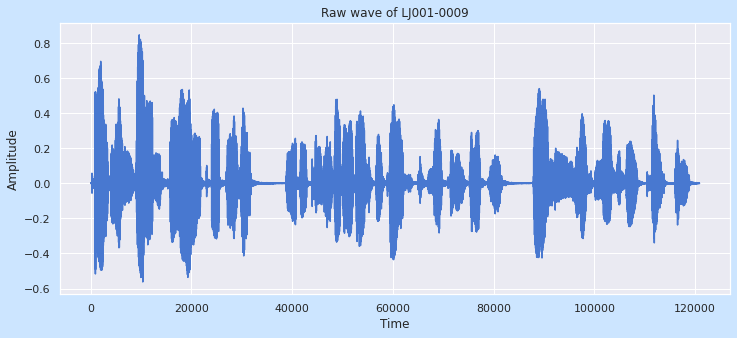

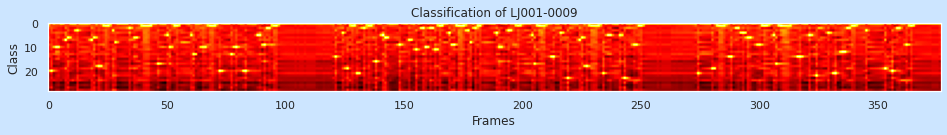



Predict a sequence of tokens tensor([ 0, 20,  0, 10, 10,  0,  0,  7,  6,  0,  0,  0,  3,  0,  0,  0,  0,  0,
         7,  6,  0, 18, 18,  1,  1,  1,  0,  3,  8,  0,  0,  0,  0,  0,  2,  0,
         6,  6,  0,  1,  1,  1,  1,  1,  0,  0, 17,  0,  0,  0,  5, 10,  0,  1,
         1,  0,  0,  0,  0,  0,  5, 13,  0,  0,  0, 10, 10,  0,  1,  1,  1,  0,
        20,  0,  0,  0,  0, 13,  0, 10,  0,  0, 20, 20,  0,  0,  0,  0,  5,  5,
         9,  9,  2,  2,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14,  0,  0,  4,  0,
        19,  0,  1,  1, 21, 21,  0,  2,  0,  1,  1,  0, 16,  0,  0,  5,  6,  6,
         0,  0,  0,  0,  9,  0,  0,  0,  7,  0,  0, 11,  0,  2,  2, 10, 10,  2,
         2, 11, 11,  1,  1,  0,  0,  4,  9,  9,  1,  1,  1,  1,  0,  3,  8,  0,
         2,  1,  1,  0,  0,  0,  0,  0,  0,  4, 10, 10,  0,  0,  3,  3,  0,  0,
         1,  1,  0,  0,  0,  0,  5, 17,  0,  1,  1,  1,  0,  0, 14, 14,  0,  0,
         

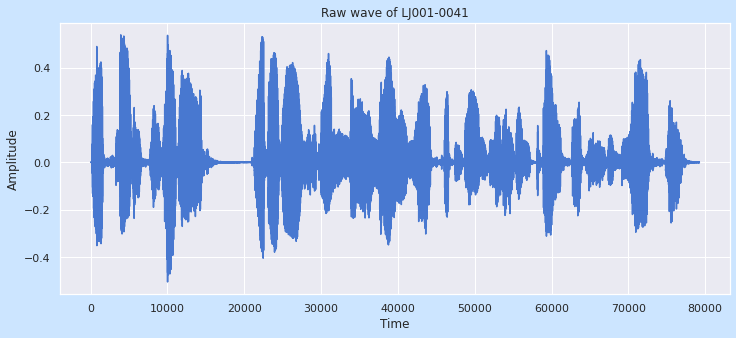

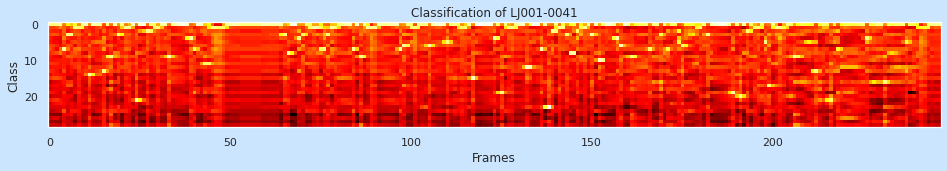



Predict a sequence of tokens tensor([ 0,  0,  0,  0,  7,  3,  3,  1,  1,  0,  0, 14,  0,  0,  0, 13,  0,  9,
         0,  3,  0,  1,  1,  0, 21,  0,  0,  2,  0,  0,  1,  0,  0,  9,  0,  0,
         0,  0,  0,  4,  7,  0,  0, 11, 11,  1,  1,  1,  1,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  8,  0,  0,  4,  3,  0,
         1,  1,  1,  7,  7,  3,  1,  1,  0,  0,  0,  0,  7,  0,  9,  0,  1,  1,
         1,  0,  0,  0,  0,  0,  0,  7,  6,  0,  1,  1,  0,  0,  0,  6,  0,  0,
         0,  0,  5,  0,  0,  0,  1,  1,  0, 15,  0,  0,  0,  0,  0,  4,  0, 19,
         0,  1,  1,  0,  0,  0, 12, 12,  0,  0,  7,  0, 23,  2,  0,  1,  1,  3,
         8,  8,  2,  1,  1,  0,  3,  0, 10, 10,  0,  0,  0,  4,  6,  0,  0,  9,
         0,  0,  0,  0,  7,  0,  0,  3,  0,  7,  0,  0,  5,  6,  0,  0,  0,  1,
         1,  0,  3,  0,  0,  0,  0,  0,  0, 19,  0, 20,  0,  2,  0,  1,  1,  0,
         5, 17,  0,  1,  1,  1,  0,  0,  9,  9,  0,  0,  0,  0, 13,  0,  0,  0,
        2

In [35]:
%%time
for f in pathlist:
  tr = decoding('/content/wavs/'+f)
  print('\nTranscript:', tr)
  print('\n=====================================================================================================================================')

> I will save all the results into data frame

#### DataFrame of the results

In [36]:
#save the results into the dataframe
df['File_Name'] = file_name
df['Transcript'] = Transcript

In [37]:
df

,File_Name,Transcript
0,LJ001-0023,AND|WAS|IN|FACT|THE|KIND|OF|LETTER|USED|IN|THE...
1,LJ001-0087,FOR|THE|SEVENTEENTH|CENTURY|LETTERS|ARE|AT|LEA...
2,LJ001-0098,AND|THE|WHOLE|EFFECT|IS|A|LITTLE|TOO|GREY|OWIN...
3,LJ001-0095,THESE|AND|SIMILAR|FOUNTS|CAST|BY|THE|ABOVE|FIR...
4,LJ001-0021,THE|EARLIEST|BOOK|PRINTED|WITH|MOVABLE|TYPE|TH...
...,...,...
95,LJ001-0060,MUST|BE|UNDERSTOOD|THAT|THROUGH|THE|WHOLE|OF|T...
96,LJ001-0059,THE|GREATER|PART|OF|THESE|ITALIAN|PRINTERS|IT|...
97,LJ001-0072,AFTER|THE|END|OF|THE|FIFTEENTH|CENTURY|THE|DEG...
98,LJ001-0009,PRINTING|THEN|FOR|OUR|PURPOSE|MAY|BE|CONSIDERE...


In [38]:
#sort the data fram by audio name 
df = df.sort_values(by='File_Name', ascending=True)
df

,File_Name,Transcript
45,LJ001-0001,PRINTING|IN|THE|ONLY|SENSE|WITH|WHICH|WE|ARE|A...
47,LJ001-0002,IN|BEING|COMPARATIVELY|MODERN|
13,LJ001-0003,FOR|ALTHOUGH|THE|CHINESE|TOOK|IMPRESSIONS|FROM...
40,LJ001-0004,PRODUCED|THE|BLOCK|BOOKS|WHICH|WERE|THE|IMMEDI...
42,LJ001-0005,THE|INVENTION|OF|MOVABLE|METAL|LETTERS|IN|THE|...
...,...,...
20,LJ001-0096,HAVE|NOW|COME|INTO|GENERAL|USE|AND|ARE|OBVIOUS...
91,LJ001-0097,A|LITTLE|REDUCED|IN|UGLINESS|THE|DESIGN|OF|THE...
2,LJ001-0098,AND|THE|WHOLE|EFFECT|IS|A|LITTLE|TOO|GREY|OWIN...
5,LJ001-0099,IT|MUST|BE|REMEMBERED|HOWEVER|THAT|MOST|MODERN...


# Task 4: evaluate the performance of the trained model on the testing dataset using Word Error Rate (WER), Match Error Rate (MER)

Hint: consider this package, https://pypi.org/project/jiwer/

#### Read the labels file

> I will read the CSV file with seperator `|` and specify 3 columns `['File_Name', 'Transcript', 'Transcript_2']`

In [39]:
#reading the labels CSV file
labels = pd.read_csv('/content/labels.csv', sep = '|', names = ['File_Name', 'Transcript', 'Transcript_2'])
labels

,File_Name,Transcript,Transcript_2
0,LJ001-0001,"Printing, in the only sense with which we are ...","Printing, in the only sense with which we are ..."
1,LJ001-0002,in being comparatively modern.,"in being comparatively modern.,,,,,,,,,,,,,,,,,,,"
2,LJ001-0003,For although the Chinese took impressions from...,For although the Chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed...","produced the block books, which were the immed..."
4,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...
...,...,...,...
518,LJ002-0334,"Again, there was no regular allowance of fuel....","Again, there was no regular allowance of fuel...."
519,LJ002-0335,"so were candles, salt, pepper, mops and brooms...","so were candles, salt, pepper, mops and brooms..."
520,LJ002-0336,"indeed the place, with its oak floors caulked ...","indeed the place, with its oak floors caulked ..."
521,LJ002-0337,could not be made even to look clean while the...,could not be made even to look clean while the...


In [40]:
labels = labels.sort_values(by='File_Name', ascending=True)
labels

,File_Name,Transcript,Transcript_2
0,LJ001-0001,"Printing, in the only sense with which we are ...","Printing, in the only sense with which we are ..."
1,LJ001-0002,in being comparatively modern.,"in being comparatively modern.,,,,,,,,,,,,,,,,,,,"
2,LJ001-0003,For although the Chinese took impressions from...,For although the Chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed...","produced the block books, which were the immed..."
4,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...
...,...,...,...
518,LJ002-0334,"Again, there was no regular allowance of fuel....","Again, there was no regular allowance of fuel...."
519,LJ002-0335,"so were candles, salt, pepper, mops and brooms...","so were candles, salt, pepper, mops and brooms..."
520,LJ002-0336,"indeed the place, with its oak floors caulked ...","indeed the place, with its oak floors caulked ..."
521,LJ002-0337,could not be made even to look clean while the...,could not be made even to look clean while the...


> As we can see that the labels file has `523 records`, so I will choose the first `100 records` for performance evaluation because I only have `100 prediction records`

> And it has `3 columns`, the first column is `Audio Name` and the other two are represent the same information for the `transcript`, so I will choose the second column `Transcript` for performance evaluation

In [41]:
#keep only the first 100 records, and the first two columns for the performance evaluation
labels = labels[:100]
labels = labels[['File_Name', 'Transcript']]
labels

,File_Name,Transcript
0,LJ001-0001,"Printing, in the only sense with which we are ..."
1,LJ001-0002,in being comparatively modern.
2,LJ001-0003,For although the Chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed..."
4,LJ001-0005,the invention of movable metal letters in the ...
...,...,...
95,LJ001-0096,have now come into general use and are obvious...
96,LJ001-0097,a little reduced in ugliness. The design of th...
97,LJ001-0098,"and the whole effect is a little too gray, owi..."
98,LJ001-0099,"It must be remembered, however, that most mode..."


In [42]:
#data describe
df.describe(include='all').transpose()

,count,unique,top,freq
File_Name,100,100,LJ001-0001,1
Transcript,100,100,PRINTING|IN|THE|ONLY|SENSE|WITH|WHICH|WE|ARE|A...,1


In [43]:
#checking for null values
labels.isnull().sum()

File_Name     0
Transcript    0
dtype: int64

In [44]:
#checking for dupicates
labels.duplicated().sum()

0

####Data Preprocessing without using jiwer

* Convert to lower case
* Remove punctuation
* Remove the separator `|`
* convert all whitespaces (tabs etc.) to single wspace

> To evaluate the performance of the model, we need to handle all the transcripts so that it is easy to evaluate the performance

> I will create a method to handle both transcripts `[predictions, labels]`

In [45]:
def preprocess_text(text):
  #Convert to lower case
  text = text.lower()
  #Remove punctuation
  # text = re.sub(r'!"$%&\'()*,./:|;<=>?@[\\]^_`{|}~', " ", text)
  text = re.sub(r'[^\w\s]', " ", text)
  #convert all whitespaces (tabs etc.) to single wspace
  text = re.sub(r"\s+", " ", text)
  text = text.strip()
  # text = ''.join(i for i in text)
  return text

> Apply the preprocessing method on the prediction dataframe

In [46]:
%%time
#apply the preprocess_text Function on Transcript column and create a new column called Clean_Transcript column
df['Clean_Transcript'] = df['Transcript']
df['Clean_Transcript'] = df['Clean_Transcript'].apply(lambda x: str(x))
df['Clean_Transcript'] = df['Clean_Transcript'].apply(lambda x: preprocess_text(x))

CPU times: user 5.35 ms, sys: 8 µs, total: 5.36 ms
Wall time: 5.37 ms


> Apply the preprocessing method on the labels dataframe

In [47]:
%%time
#apply the preprocess_text Function on Transcript column and create a new column called Clean_Transcript column
labels['Clean_Transcript'] = labels['Transcript']
labels['Clean_Transcript'] = labels['Clean_Transcript'].apply(lambda x: str(x))
labels['Clean_Transcript'] = labels['Clean_Transcript'].apply(lambda x: preprocess_text(x))

CPU times: user 4.93 ms, sys: 0 ns, total: 4.93 ms
Wall time: 5.6 ms


In [48]:
df.head(5)

,File_Name,Transcript,Clean_Transcript
45,LJ001-0001,PRINTING|IN|THE|ONLY|SENSE|WITH|WHICH|WE|ARE|A...,printing in the only sense with which we are a...
47,LJ001-0002,IN|BEING|COMPARATIVELY|MODERN|,in being comparatively modern
13,LJ001-0003,FOR|ALTHOUGH|THE|CHINESE|TOOK|IMPRESSIONS|FROM...,for although the chinese took impressions from...
40,LJ001-0004,PRODUCED|THE|BLOCK|BOOKS|WHICH|WERE|THE|IMMEDI...,produced the block books which were the immedi...
42,LJ001-0005,THE|INVENTION|OF|MOVABLE|METAL|LETTERS|IN|THE|...,the invention of movable metal letters in the ...


In [49]:
labels.head(5)

,File_Name,Transcript,Clean_Transcript
0,LJ001-0001,"Printing, in the only sense with which we are ...",printing in the only sense with which we are a...
1,LJ001-0002,in being comparatively modern.,in being comparatively modern
2,LJ001-0003,For although the Chinese took impressions from...,for although the chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed...",produced the block books which were the immedi...
4,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...


In [50]:
#data describe
df.describe(include='all').transpose()

,count,unique,top,freq
File_Name,100,100,LJ001-0001,1
Transcript,100,100,PRINTING|IN|THE|ONLY|SENSE|WITH|WHICH|WE|ARE|A...,1
Clean_Transcript,100,100,printing in the only sense with which we are a...,1


In [51]:
#checking for null values
df.isnull().sum()

File_Name           0
Transcript          0
Clean_Transcript    0
dtype: int64

In [52]:
#checking for dupicates
df.duplicated().sum()

0

In [53]:
#data describe
labels.describe(include='all').transpose()

,count,unique,top,freq
File_Name,100,100,LJ001-0001,1
Transcript,100,100,"Printing, in the only sense with which we are ...",1
Clean_Transcript,100,100,printing in the only sense with which we are a...,1


In [54]:
#checking for null values
labels.isnull().sum()

File_Name           0
Transcript          0
Clean_Transcript    0
dtype: int64

In [55]:
#checking for dupicates
labels.duplicated().sum()

0

#### The Word Error Rate(WER) & The Match Error Rate (MER)

In [56]:
Wer_score = []
Mer_score = []
for i in range(100):
  error_wer = wer(labels['Clean_Transcript'][i], df['Clean_Transcript'][i])
  error_mer = mer(labels['Clean_Transcript'][i], df['Clean_Transcript'][i])
  Wer_score.append(error_wer)
  Mer_score.append(error_mer)
  print('Record number [ ', i+1, ' ]')
  print('Wer_Score : ', error_wer)
  print('Mer_Score : ', error_mer)
  print('====================================')

Record number [  1  ]
Wer_Score :  0.9629629629629629
Mer_Score :  0.896551724137931
Record number [  2  ]
Wer_Score :  4.75
Mer_Score :  0.95
Record number [  3  ]
Wer_Score :  0.8333333333333334
Mer_Score :  0.8333333333333334
Record number [  4  ]
Wer_Score :  0.9285714285714286
Mer_Score :  0.9285714285714286
Record number [  5  ]
Wer_Score :  0.92
Mer_Score :  0.92
Record number [  6  ]
Wer_Score :  1.5
Mer_Score :  0.9545454545454546
Record number [  7  ]
Wer_Score :  1.0588235294117647
Mer_Score :  1.0
Record number [  8  ]
Wer_Score :  7.75
Mer_Score :  1.0
Record number [  9  ]
Wer_Score :  0.8947368421052632
Mer_Score :  0.8947368421052632
Record number [  10  ]
Wer_Score :  1.0
Mer_Score :  1.0
Record number [  11  ]
Wer_Score :  1.6666666666666667
Mer_Score :  1.0
Record number [  12  ]
Wer_Score :  0.9411764705882353
Mer_Score :  0.9411764705882353
Record number [  13  ]
Wer_Score :  2.0
Mer_Score :  0.9411764705882353
Record number [  14  ]
Wer_Score :  0.967741935483871


#### Result DataFrame

>I'm going to create a result data frame containing `[Audio_name, clean_predicted_Transcript, clean_label_Transcript, WER_SCORE, MER_SCORE]` so that I can handle all this data easily

In [57]:
result = pd.DataFrame()
result['Audio_Name'] = df['File_Name']
result['Predicted_Transcript'] = df['Clean_Transcript']
result['Labels_Transcript'] = labels['Clean_Transcript'].tolist()
result['WER_SCORE'] = Wer_score
result['MER_SCORE'] = Mer_score

In [58]:
result.head()

,Audio_Name,Predicted_Transcript,Labels_Transcript,WER_SCORE,MER_SCORE
45,LJ001-0001,printing in the only sense with which we are a...,printing in the only sense with which we are a...,0.962963,0.896552
47,LJ001-0002,in being comparatively modern,in being comparatively modern,4.750000,0.950000
13,LJ001-0003,for although the chinese took impressions from...,for although the chinese took impressions from...,0.833333,0.833333
40,LJ001-0004,produced the block books which were the immedi...,produced the block books which were the immedi...,0.928571,0.928571
42,LJ001-0005,the invention of movable metal letters in the ...,the invention of movable metal letters in the ...,0.920000,0.920000


In [59]:
#data describe
result.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Audio_Name,100,100,LJ001-0001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Predicted_Transcript,100,100,printing in the only sense with which we are a...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Labels_Transcript,100,100,printing in the only sense with which we are a...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WER_SCORE,100.0,NaN,NaN,NaN,1.300453,0.875067,0.833333,0.954545,1.0,1.269444,7.75
MER_SCORE,100.0,NaN,NaN,NaN,0.955445,0.045835,0.809524,0.928571,0.956522,1.0,1.0


In [60]:
#checking for null values
result.isnull().sum()

Audio_Name              0
Predicted_Transcript    0
Labels_Transcript       0
WER_SCORE               0
MER_SCORE               0
dtype: int64

In [61]:
#checking for dupicates
result.duplicated().sum()

0

#### Distribution of WER_SCORE & MER_SCORE

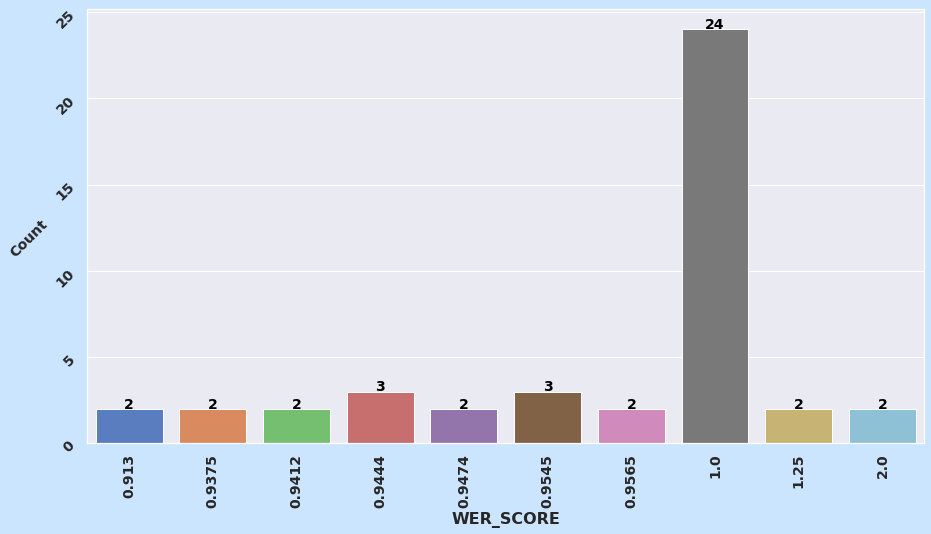

In [62]:
#target column distribution
plt.figure(figsize=(15,8), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
first_15 = sns.barplot(x = np.round(result['WER_SCORE'].value_counts().head(10).index, decimals = 4), y=result['WER_SCORE'].value_counts().head(10).values)
plt.xticks(rotation=90, fontsize=14, fontweight='bold')
plt.xlabel('WER_SCORE', fontsize=16, fontweight='bold')
plt.yticks(rotation=45, fontsize=14, fontweight='bold')
plt.ylabel('Count', rotation=45, ha='right', fontsize=14, fontweight='bold')

for patch in first_15.patches:
  first_15.annotate("%.0f" % patch.get_height(), (patch.get_x() + patch.get_width() / 2., patch.get_height()), ha='center', va='center', fontsize=14, fontweight='bold', color='black', xytext=(0, 5), textcoords='offset points')
plt.show()

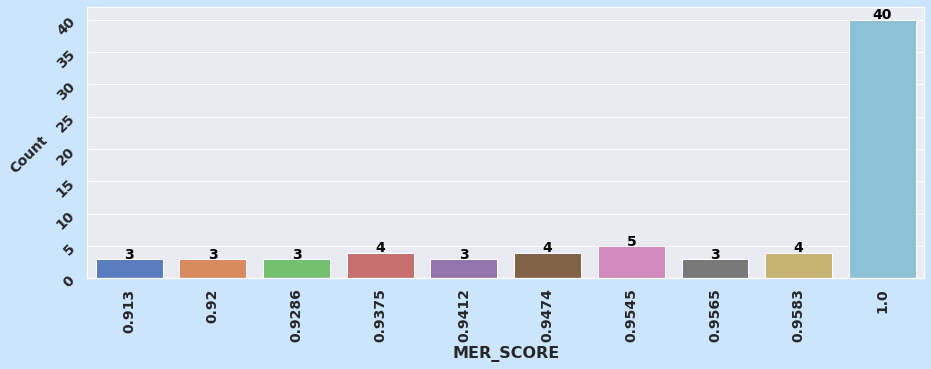

In [63]:
#target column distribution
plt.figure(figsize=(15,5), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
first_15 = sns.barplot(x = np.round(result['MER_SCORE'].value_counts().head(10).index, decimals = 4), y = result['MER_SCORE'].value_counts().head(10).values)
plt.xticks(rotation=90, fontsize=14, fontweight='bold')
plt.xlabel('MER_SCORE', fontsize=16, fontweight='bold')
plt.yticks(rotation=45, fontsize=14, fontweight='bold')
plt.ylabel('Count', rotation=45, ha='right', fontsize=14, fontweight='bold')

for patch in first_15.patches:
  first_15.annotate("%.0f" % patch.get_height(), (patch.get_x() + patch.get_width() / 2., patch.get_height()), ha='center', va='center', fontsize=14, fontweight='bold', color='black', xytext=(0, 5), textcoords='offset points')
plt.show()

# Task 5: check files with the worst performance and perform a simple error analysis, e.g., 
1. what are the files having worser performance.
2. what are the potential reasons
3. do they share any common patterns?


### 1.what are the files having worser performance.

> I will use `WER_SCORE` and `MER_SCORE` to check the performance

> As we know from the `WER` and `MER` comparison , 
* The wave with `lower WER` value it has the `better performance`.
* The wave with `Higher MER` value it has the `better performance`.



#### MER_SCORE

> I will check the files with the worst performance by using `MER_SCORE`

> I'm going to sort the data frame with `MER_SCORE` to see which Audio has the worst performance`( has lower values )`

In [64]:
result = result.sort_values(by='MER_SCORE', ascending=True)
result.head()

,Audio_Name,Predicted_Transcript,Labels_Transcript,WER_SCORE,MER_SCORE
19,LJ001-0036,but about the same year menteline at strausbur...,but about the same year mentelin at strasburg ...,0.944444,0.809524
13,LJ001-0003,for although the chinese took impressions from...,for although the chinese took impressions from...,0.833333,0.833333
21,LJ001-0073,went on apace and by the end of the sixteenth ...,went on apace and by the end of the sixteenth ...,0.888889,0.842105
59,LJ001-0050,and though the famous family of aldos restored...,and though the famous family of aldus restored...,0.857143,0.857143
79,LJ001-0051,and paying great attention to the press work o...,and paying great attention to the press work o...,1.461538,0.863636


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


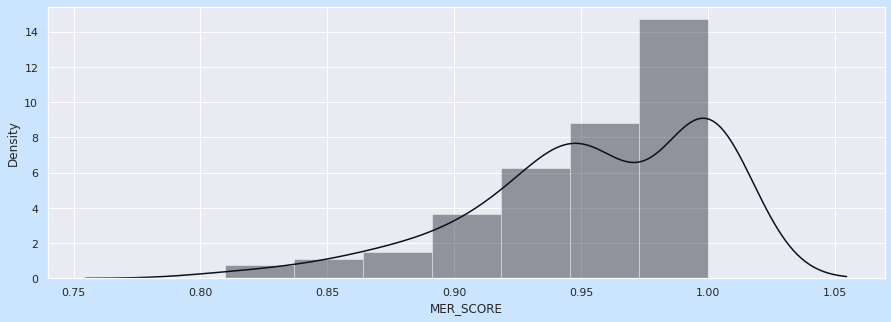

In [65]:
#the distribution of MER_SCORE
plt.figure(figsize=(15,5), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
sns.distplot(result['MER_SCORE'], color = '#0A0F1C')
plt.show()

>As we can see, the `Worst MER_SCORE` is around `0.81` which is not so bad

> But I will take all records with `MER_SCORE` less than or equal `0.90` as the worst performance files

In [66]:
#get all the records which has MER_SCORE les than or equal 0.90
worst = pd.DataFrame()
worst = result.loc[(result['MER_SCORE']<=0.90)]
worst

,Audio_Name,Predicted_Transcript,Labels_Transcript,WER_SCORE,MER_SCORE
19,LJ001-0036,but about the same year menteline at strausbur...,but about the same year mentelin at strasburg ...,0.944444,0.809524
13,LJ001-0003,for although the chinese took impressions from...,for although the chinese took impressions from...,0.833333,0.833333
21,LJ001-0073,went on apace and by the end of the sixteenth ...,went on apace and by the end of the sixteenth ...,0.888889,0.842105
59,LJ001-0050,and though the famous family of aldos restored...,and though the famous family of aldus restored...,0.857143,0.857143
79,LJ001-0051,and paying great attention to the press work o...,and paying great attention to the press work o...,1.461538,0.863636
52,LJ001-0089,but his letters though uninteresting and poor ...,but his letters though uninteresting and poor ...,0.869565,0.869565
3,LJ001-0095,these and similar founts cast by the above fir...,these and similar founts cast by the above fir...,1.909091,0.875000
97,LJ001-0072,after the end of the fifteenth century the deg...,after the end of the fifteenth century the deg...,0.875000,0.875000
15,LJ001-0020,the lower case being in fact invented in the e...,the lower case being in fact invented in the e...,1.333333,0.888889
4,LJ001-0021,the earliest book printed with movable type th...,the earliest book printed with movable type th...,1.250000,0.892857


In [67]:
#The total number of the worst file performance
worst.shape

(14, 5)

> As we can see, these are the worst files performance based on the `MER_SCORE`

> The total number of the worst file performance is `14 records`

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


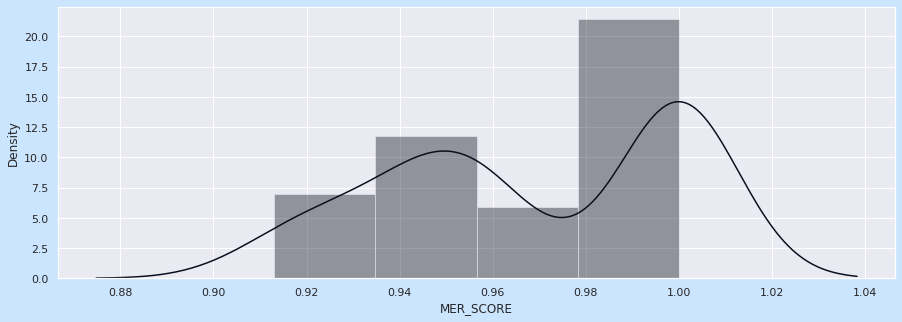

In [68]:
#the distribution of MER_SCORE without the worst performance scores
plt.figure(figsize=(15,5), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
sns.distplot(result[result['MER_SCORE']>0.9].MER_SCORE, color = '#0A0F1C')
plt.show()

#### WER_SCORE

> I will check the files with the worst performance by using `WER_SCORE`

> I'm going to sort the data frame with `WER_SCORE` to see which Audio has the worst performance`( has higher values )`

In [69]:
wer_df = result
wer_df = result.sort_values(by='WER_SCORE', ascending=False)
wer_df.head(10)

,Audio_Name,Predicted_Transcript,Labels_Transcript,WER_SCORE,MER_SCORE
90,LJ001-0008,has never been surpassed,has never been surpassed,7.750000,1.000000
47,LJ001-0002,in being comparatively modern,in being comparatively modern,4.750000,0.950000
73,LJ001-0045,fourteen sixty nine fourteen seventy,1469 1470,4.000000,1.000000
78,LJ001-0078,to improve the letter in form,to improve the letter in form,2.833333,1.000000
38,LJ001-0090,with this change the art of printing touched b...,with this change the art of printing touched b...,2.555556,0.958333
87,LJ001-0043,further development of the roman letter took p...,a further development of the roman letter took...,2.090909,0.920000
49,LJ001-0084,but for the beauty of the earlier work they mi...,but for the beauty of the earlier work they mi...,2.076923,0.964286
44,LJ001-0013,an in the same operations with ugly ones,than in the same operations with ugly ones,2.000000,0.941176
69,LJ001-0054,gensen however had many contemporaries who use...,jenson however had many contemporaries who use...,2.000000,1.000000
3,LJ001-0095,these and similar founts cast by the above fir...,these and similar founts cast by the above fir...,1.909091,0.875000


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


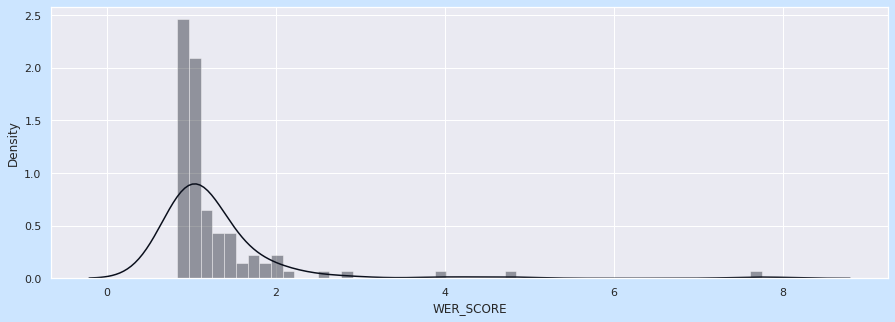

In [70]:
#the distribution of WER_SCORE
plt.figure(figsize=(15,5), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
sns.distplot(result['WER_SCORE'], color = '#0A0F1C')
plt.show()

>As we can see, the `Worst WER_SCORE` is more than or equal  `2.0`

> So I will take all records with `WER_SCORE` more than or equal `2.0` as the worst performance files

In [71]:
#get all the records which has WER_SCORE more than or equal 2.0
worst_WER = pd.DataFrame()
worst_WER = wer_df.loc[(result['WER_SCORE']>=2.0)]
worst_WER

,Audio_Name,Predicted_Transcript,Labels_Transcript,WER_SCORE,MER_SCORE
90,LJ001-0008,has never been surpassed,has never been surpassed,7.750000,1.000000
47,LJ001-0002,in being comparatively modern,in being comparatively modern,4.750000,0.950000
73,LJ001-0045,fourteen sixty nine fourteen seventy,1469 1470,4.000000,1.000000
78,LJ001-0078,to improve the letter in form,to improve the letter in form,2.833333,1.000000
38,LJ001-0090,with this change the art of printing touched b...,with this change the art of printing touched b...,2.555556,0.958333
87,LJ001-0043,further development of the roman letter took p...,a further development of the roman letter took...,2.090909,0.920000
49,LJ001-0084,but for the beauty of the earlier work they mi...,but for the beauty of the earlier work they mi...,2.076923,0.964286
44,LJ001-0013,an in the same operations with ugly ones,than in the same operations with ugly ones,2.000000,0.941176
69,LJ001-0054,gensen however had many contemporaries who use...,jenson however had many contemporaries who use...,2.000000,1.000000


In [72]:
#The total number of the worst file performance
worst_WER.shape

(9, 5)

> As we can see, these are the worst files performance based on the `WER_SCORE`

> The total number of the worst file performance are `9 records`

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


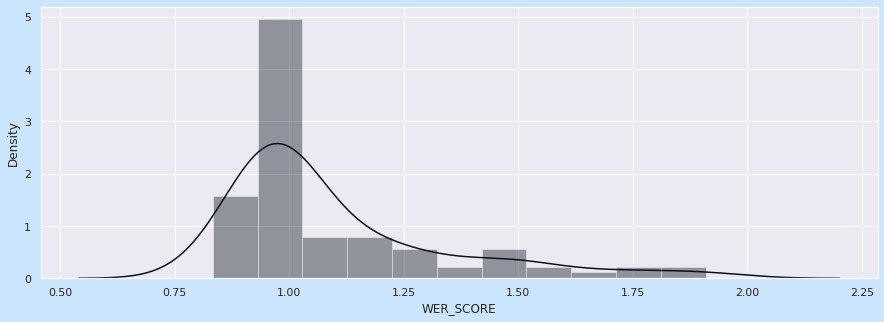

In [73]:
#the distribution of WER_SCORE without the worst performance scores
plt.figure(figsize=(15,5), facecolor='#CCE5FF')
sns.set(palette="muted", color_codes=True)
sns.distplot(result[result['WER_SCORE']<2.0].WER_SCORE, color = '#0A0F1C')
plt.show()

### 2.what are the potential reasons

> The reasons for this worst performance are :
  1. There may be a problem with the data processing The preprocessing may not cover all cases such as: 
    * Common English contractions: like `let's` should be `let us`, `won't` should be `will not`
    * missing any punctuation
  2. There is a problem with the tone of the voice
  3. Say any human or animal name such as:
    * when we asked `google assistant`, `Siri`, or any `smart assistant` about any name of the human or animal .
  4. If there are any `technical words` like `Keras` or `pytorch` in the audio
  5. Another difficulty is that WER counts the amount of full word mistakes by definition. For this computation, many tools define words as strings separated by spaces, however not all writing systems use spaces to divide words. Before calculating WER, you may need to tokenize the text in this situation.
  6. There are three types of mistakes that may be used to estimate WER:
    * ***`Substitutions`***: When the system substitutes one term for another. A substitution mistake would be writing the fifth word as `these` instead of `the.`
    * ***`Insertions`***:When the system inserts a word that the speaker did not say into the transcript.
    * ***`Deletions`***: When the system completely misses any word.
> These are all possible reasons for this performance

### 3.do they share any common patterns?

> I will work on `MER_SCORE` to find out if there is any pattern

In [74]:
#worst performance files
worst_MER = worst[['Audio_Name', 'Predicted_Transcript', 'Labels_Transcript', 'MER_SCORE']]
worst_MER

,Audio_Name,Predicted_Transcript,Labels_Transcript,MER_SCORE
19,LJ001-0036,but about the same year menteline at strausbur...,but about the same year mentelin at strasburg ...,0.809524
13,LJ001-0003,for although the chinese took impressions from...,for although the chinese took impressions from...,0.833333
21,LJ001-0073,went on apace and by the end of the sixteenth ...,went on apace and by the end of the sixteenth ...,0.842105
59,LJ001-0050,and though the famous family of aldos restored...,and though the famous family of aldus restored...,0.857143
79,LJ001-0051,and paying great attention to the press work o...,and paying great attention to the press work o...,0.863636
52,LJ001-0089,but his letters though uninteresting and poor ...,but his letters though uninteresting and poor ...,0.869565
3,LJ001-0095,these and similar founts cast by the above fir...,these and similar founts cast by the above fir...,0.875000
97,LJ001-0072,after the end of the fifteenth century the deg...,after the end of the fifteenth century the deg...,0.875000
15,LJ001-0020,the lower case being in fact invented in the e...,the lower case being in fact invented in the e...,0.888889
4,LJ001-0021,the earliest book printed with movable type th...,the earliest book printed with movable type th...,0.892857


> I will create a method to check the similarity between the label and the predicted transcripts and convert the transcripts to a list of strings to help me to do a comparison of the two transcripts

In [75]:
# method for check the similarity between the label and predicted transcript and convert the transcript to list of strings to help me to make a comparison between the two transcripts
def sim(n):
  pt = worst_MER.iloc[n]['Predicted_Transcript'].split()
  lt = worst_MER.iloc[n]['Labels_Transcript'].split()
  print('similarity : ', pt == lt)
  print('MER_SCORE: ', np.round(worst_MER.iloc[n]['MER_SCORE'], 4), '\n')
  print(pt)
  print(lt)

In [76]:
#record 0
sim(0)

similarity :  False
MER_SCORE:  0.8095 

['but', 'about', 'the', 'same', 'year', 'menteline', 'at', 'strausburg', 'began', 'to', 'print', 'in', 'a', 'type', 'which', 'is', 'distinctly', 'roman']
['but', 'about', 'the', 'same', 'year', 'mentelin', 'at', 'strasburg', 'began', 'to', 'print', 'in', 'a', 'type', 'which', 'is', 'distinctly', 'roman']


> As we can see, there is a problem in the `labels.csv`, the data on it has a `missing character`
* predicted transcript : menteline
* label predicted transcript : mentelin

>As we can see also, the model can't predict the `human names` like the `labels.CSV`
* predicted transcript : strausburg
* label predicted transcript : strasburg

In [77]:
#record 1
sim(1)

similarity :  False
MER_SCORE:  0.8333 

['for', 'although', 'the', 'chinese', 'took', 'impressions', 'from', 'wood', 'blocks', 'engraved', 'in', 'relief', 'for', 'centuries', 'before', 'the', 'wood', 'cutters', 'of', 'the', 'netherlands', 'by', 'a', 'similar', 'process']
['for', 'although', 'the', 'chinese', 'took', 'impressions', 'from', 'wood', 'blocks', 'engraved', 'in', 'relief', 'for', 'centuries', 'before', 'the', 'woodcutters', 'of', 'the', 'netherlands', 'by', 'a', 'similar', 'process']


> As we can see, the model has a problem with `two-part words`
* predicted transcript : 'wood', 'cutters'
* label predicted transcript : woodcutters


In [78]:
#record 2
sim(2)

similarity :  True
MER_SCORE:  0.8421 

['went', 'on', 'apace', 'and', 'by', 'the', 'end', 'of', 'the', 'sixteenth', 'century', 'there', 'was', 'no', 'really', 'beautiful', 'printing', 'done']
['went', 'on', 'apace', 'and', 'by', 'the', 'end', 'of', 'the', 'sixteenth', 'century', 'there', 'was', 'no', 'really', 'beautiful', 'printing', 'done']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [79]:
#record 3
sim(3)

similarity :  False
MER_SCORE:  0.8571 

['and', 'though', 'the', 'famous', 'family', 'of', 'aldos', 'restored', 'its', 'technical', 'excellence', 'rejecting', 'battered', 'letters']
['and', 'though', 'the', 'famous', 'family', 'of', 'aldus', 'restored', 'its', 'technical', 'excellence', 'rejecting', 'battered', 'letters']


>As we can see also, the model can't predict the `human names` like the `labels.CSV`
* predicted transcript : strausburg
* label predicted transcript : strasburg

In [80]:
#record 4
sim(4)

similarity :  True
MER_SCORE:  0.8636 

['and', 'paying', 'great', 'attention', 'to', 'the', 'press', 'work', 'or', 'actual', 'process', 'of', 'printing']
['and', 'paying', 'great', 'attention', 'to', 'the', 'press', 'work', 'or', 'actual', 'process', 'of', 'printing']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [81]:
#record 5
sim(5)

similarity :  True
MER_SCORE:  0.8696 

['but', 'his', 'letters', 'though', 'uninteresting', 'and', 'poor', 'are', 'not', 'nearly', 'so', 'gross', 'and', 'vulgar', 'as', 'those', 'of', 'either', 'the', 'italian', 'or', 'the', 'frenchman']
['but', 'his', 'letters', 'though', 'uninteresting', 'and', 'poor', 'are', 'not', 'nearly', 'so', 'gross', 'and', 'vulgar', 'as', 'those', 'of', 'either', 'the', 'italian', 'or', 'the', 'frenchman']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [82]:
#record 6
sim(6)

similarity :  True
MER_SCORE:  0.875 

['these', 'and', 'similar', 'founts', 'cast', 'by', 'the', 'above', 'firm', 'and', 'others']
['these', 'and', 'similar', 'founts', 'cast', 'by', 'the', 'above', 'firm', 'and', 'others']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [83]:
#record 7
sim(7)

similarity :  True
MER_SCORE:  0.875 

['after', 'the', 'end', 'of', 'the', 'fifteenth', 'century', 'the', 'degradation', 'of', 'printing', 'especially', 'in', 'germany', 'and', 'italy']
['after', 'the', 'end', 'of', 'the', 'fifteenth', 'century', 'the', 'degradation', 'of', 'printing', 'especially', 'in', 'germany', 'and', 'italy']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [84]:
#record 8
sim(8)

similarity :  True
MER_SCORE:  0.8889 

['the', 'lower', 'case', 'being', 'in', 'fact', 'invented', 'in', 'the', 'early', 'middle', 'ages']
['the', 'lower', 'case', 'being', 'in', 'fact', 'invented', 'in', 'the', 'early', 'middle', 'ages']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [85]:
#record 9
sim(9)

similarity :  False
MER_SCORE:  0.8929 

['the', 'earliest', 'book', 'printed', 'with', 'movable', 'type', 'the', 'afforesaid', 'guttenberg', 'bible', 'is', 'printed', 'in', 'letters', 'which', 'are', 'an', 'exact', 'imitation']
['the', 'earliest', 'book', 'printed', 'with', 'movable', 'type', 'the', 'aforesaid', 'gutenberg', 'bible', 'is', 'printed', 'in', 'letters', 'which', 'are', 'an', 'exact', 'imitation']


> As we can see, there is a problem in the `model`, the model had `duplicate a character`
* predicted transcript : afforesaid
* label predicted transcript : aforesaid

>As we can see also, the model can't predict the `place names` and a `human names` like the `labels.CSV`
* predicted transcript : guttenberg
* label predicted transcript : gutenberg

In [86]:
#record 10
sim(10)

similarity :  True
MER_SCORE:  0.8947 

['printing', 'then', 'for', 'our', 'purpose', 'may', 'be', 'considered', 'as', 'the', 'art', 'of', 'making', 'books', 'by', 'means', 'of', 'movable', 'types']
['printing', 'then', 'for', 'our', 'purpose', 'may', 'be', 'considered', 'as', 'the', 'art', 'of', 'making', 'books', 'by', 'means', 'of', 'movable', 'types']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [87]:
#record 11
sim(11)

similarity :  False
MER_SCORE:  0.8947 

['on', 'the', 'whole', 'the', 'type', 'of', 'this', 'book', 'may', 'be', 'considered', 'the', 'neplu', 'ultra', 'of', 'gothic', 'type']
['on', 'the', 'whole', 'the', 'type', 'of', 'this', 'book', 'may', 'be', 'considered', 'the', 'ne', 'plus', 'ultra', 'of', 'gothic', 'type']


> The model `can't figure out expressions`
* predicted : `neplu ultra`
* label : `ne plus ultra`

In [88]:
#record 12
sim(12)

similarity :  True
MER_SCORE:  0.8966 

['printing', 'in', 'the', 'only', 'sense', 'with', 'which', 'we', 'are', 'at', 'present', 'concerned', 'differs', 'from', 'most', 'if', 'not', 'from', 'all', 'the', 'arts', 'and', 'crafts', 'represented', 'in', 'the', 'exhibition']
['printing', 'in', 'the', 'only', 'sense', 'with', 'which', 'we', 'are', 'at', 'present', 'concerned', 'differs', 'from', 'most', 'if', 'not', 'from', 'all', 'the', 'arts', 'and', 'crafts', 'represented', 'in', 'the', 'exhibition']


> These two sentences are similar to each other but I don't know why `MER_SCORE` is low, maybe there is another reason but I haven't figured it out

In [89]:
#record 13
sim(13)

similarity :  False
MER_SCORE:  0.9 

['this', 'was', 'notably', 'the', 'case', 'with', 'the', 'early', 'works', 'printed', 'at', 'ome', 'and', 'in', 'a', 'somewhat', 'lesser', 'degree', 'at', 'augsburg']
['this', 'was', 'notably', 'the', 'case', 'with', 'the', 'early', 'works', 'printed', 'at', 'ulm', 'and', 'in', 'a', 'somewhat', 'lesser', 'degree', 'at', 'augsburg']


> As we can see, the model has a problem with a `place names` and a `human names`
* predicted transcript : `ome`
* label predicted transcript : `ulm`

#### **Conclusion**

#####do they share any common patterns?

> Yes and No.

> From all the previous results we found that `there is a pattern` between these predicted files, and that pattern is that **`the model can't detect human names, place names, city names, country names, and things like that`** like the `labels.csv`

> Others I didn't find any pattern for them.

> #### <a>***`So there are some files with a pattern and some without a pattern`***

#Refrences

> [Ref.](https://learnpython.com/blog/plot-waveform-in-python/)
> [Ref.](https://www.kaggle.com/code/esraaashraf99/numbers-anom1)
> [Ref.](https://www.kaggle.com/code/jimregan/ljspeech-for-asr)
> [Ref.](https://pytorch.org/tutorials/intermediate/speech_recognition_pipeline_tutorial.html)
> [Ref.](https://www.kaggle.com/code/davids1992/speech-representation-and-data-exploration/notebook)
> [Ref.](https://pypi.org/project/jiwer/)
> [Ref.](https://colab.research.google.com/github/pytorch/audio/blob/gh-pages/main/_downloads/ca83af2ea8d7db05fb63211d515b7fde/speech_recognition_pipeline_tutorial.ipynb#scrollTo=eptHo02sc_-P)
